## 1.0 - Importing packages

In [1]:
import os
import numpy as np
from sklearn import datasets
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.svm import LinearSVC
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

from sklearn import svm
import seaborn as sb
import pandas as pd
import numpy as np
import itertools

from sklearn.svm import LinearSVC as SVC
import matplotlib as mpl
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

import plotly as ply
import timeit

## 2.0 - Functions

In [974]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

def classif_score_builder(xtrain,xval,xtest,ytrain,yval,ytest,features,tvt):
    
    pipeline = Pipeline([
        ('min_max_scaler', MinMaxScaler()),
        ('std_scaler', StandardScaler())
    ])
    
    xtrain_bestf=xtrain.loc[:, xtrain.columns.isin(features)]
    xval_bestf=xval.loc[:, xval.columns.isin(features)]
    xtest_bestf=xtest.loc[:, xtest.columns.isin(features)]
    
    xtrain_scalef = pd.DataFrame(pipeline.fit_transform(xtrain_bestf),columns=features)
    xval_scalef = pd.DataFrame(pipeline.transform(xval_bestf),columns=features)
    xtest_scalef = pd.DataFrame(pipeline.transform(xtest_bestf),columns=features)
           
    model = SVC(kernel='linear')
    model.fit(xtrain_scalef, ytrain)
    if tvt=='train':
        y_pred=model.predict(xtrain_scalef)
        ytrue=ytrain
    elif tvt=='val':
        y_pred=model.predict(xval_scalef)
        ytrue=yval
    elif tvt=='test':
        y_pred=model.predict(xtest_scalef)
        ytrue=ytest
    else:
        print("incorrect inputs")

    acc=classification_report(ytrue, y_pred, output_dict=True)['accuracy']
    p=classification_report(ytrue, y_pred,output_dict=True)['macro avg']['precision']
    r=classification_report(ytrue, y_pred,output_dict=True)['macro avg']['recall']
    f1=classification_report(ytrue, y_pred,output_dict=True)['macro avg']['f1-score']
    auc=roc_auc_score(ytrue, y_pred)
    
    scores=list([acc,p,r,f1,auc])
    
    return scores

def print_score(clf, X_train, y_train, X_val, y_val, X_test , y_test, tvt):  # tvt == train, val or test
    if tvt=='train':
        pred = clf.predict(X_train)
        clf_report = pd.DataFrame(classification_report(y_train, pred, output_dict=True))
        print("Train Result:\n================================================")
        print(f"Accuracy Score: {accuracy_score(y_train, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_train, pred)}\n")
        
    elif tvt=='val':
        pred = clf.predict(X_val)
        clf_report = pd.DataFrame(classification_report(y_val, pred, output_dict=True))
        print("Validation Result:\n================================================")        
        print(f"Accuracy Score: {accuracy_score(y_val, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_val, pred)}\n")
        
    elif tvt=='test':
        pred = clf.predict(X_test)
        clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))
        print("Test Result:\n================================================")        
        print(f"Accuracy Score: {accuracy_score(y_test, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_test, pred)}\n")
        
    else:
        print("Please specify data split to verify on i.e train, val or test")

## 3.0 - Dataset

### 00 - Original Set

<AxesSubplot:xlabel='OverallPoF', ylabel='count'>

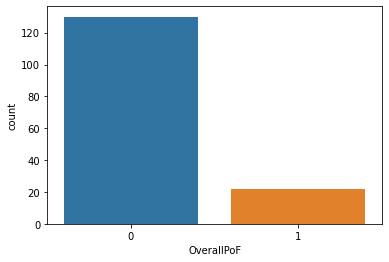

In [185]:
X_train0=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\00 - Original\\X_train.csv")
X_val0=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\00 - Original\\X_val.csv")
X_test0=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\00 - Original\\X_test.csv")
y_train0=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\00 - Original\\y_train.csv")
y_val0=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\00 - Original\\y_val.csv")
y_test0=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\00 - Original\\y_test.csv")
sb.countplot(y_train0['OverallPoF'],fill='OverallPoF')

In [1172]:
X_train0=X_train0.filter(regex='fa',axis=1)
X_val0=X_val0.filter(regex='fa',axis=1)
X_test0=X_test0.filter(regex='fa',axis=1)

In [1173]:
data=pd.concat([X_train0,y_train0],axis=1)
plot_data=pd.melt(data,'OverallPoF')
plot_data['PoF'] = np.where(plot_data['OverallPoF']==0, 'Pass', 'Fail')
plot_data.head(5)

,OverallPoF,variable,value,PoF
0,0,fa226,0.0620,Pass
1,0,fa226,0.0348,Pass
2,0,fa226,0.0026,Pass
3,0,fa226,0.0283,Pass
4,0,fa226,0.0359,Pass


<AxesSubplot:xlabel='variable', ylabel='value'>

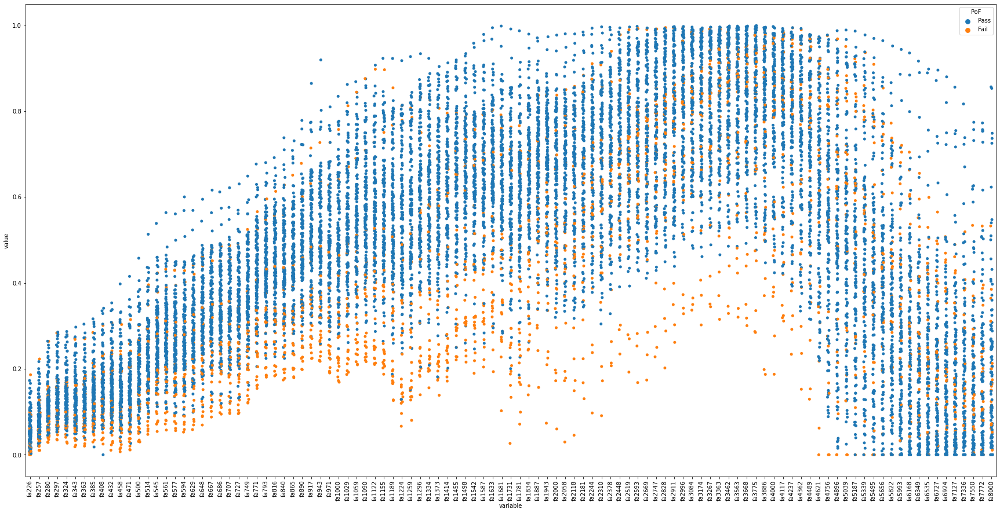

In [188]:
plt.figure(figsize=(30, 15))
plt.xticks(rotation=90)
sb.stripplot(data=plot_data,x="variable",y="value",hue="PoF")

In [1180]:
trial

fa408     0.1710
fa1189    0.6756
fa3084    0.6874
fa4362    0.5758
fa7127    0.0659
Name: 2, dtype: float64

<AxesSubplot:xlabel='variable', ylabel='value'>

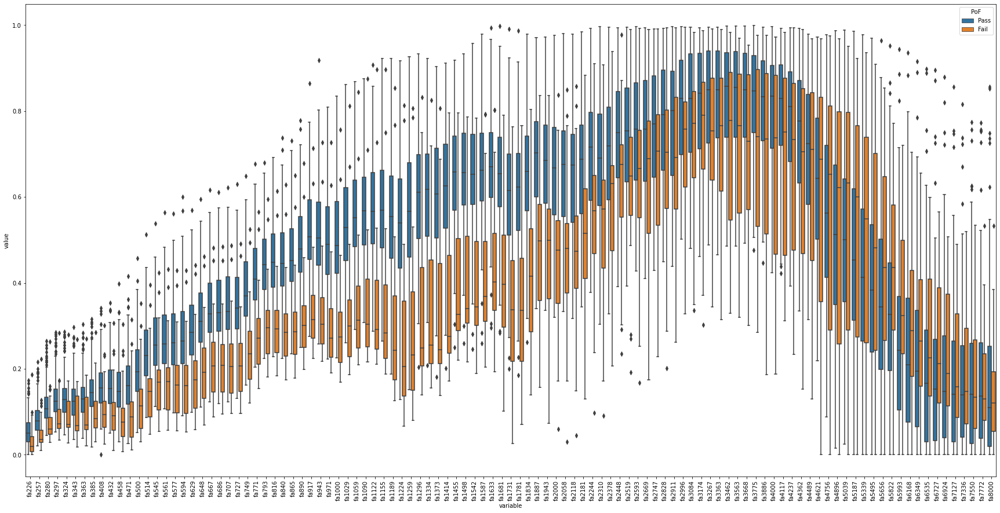

In [1186]:
plt.figure(figsize=(30, 15))
plt.xticks(rotation=90)
sb.boxplot(data=plot_data,x="variable",y="value",hue="PoF")

### 01 - NearMiss Under-sampling

<AxesSubplot:xlabel='OverallPoF', ylabel='count'>

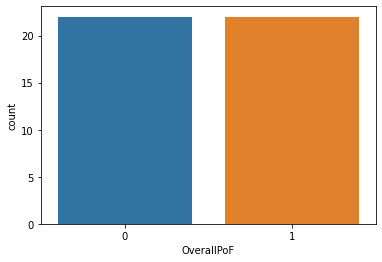

In [190]:
X_train1=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\01 - NM2\\X_train.csv")
X_val1=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\01 - NM2\\X_val.csv")
X_test1=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\01 - NM2\\X_test.csv")
y_train1=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\01 - NM2\\y_train.csv")
y_val1=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\01 - NM2\\y_val.csv")
y_test1=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\01 - NM2\\y_test.csv")
sb.countplot(y_train1['OverallPoF'],fill='OverallPoF')

In [191]:
X_train1=X_train1.filter(regex='fa',axis=1)
X_val1=X_val1.filter(regex='fa',axis=1)
X_test1=X_test1.filter(regex='fa',axis=1)

In [192]:
data=pd.concat([X_train1,y_train1],axis=1)
plot_data=pd.melt(data,'OverallPoF')
plot_data['PoF'] = np.where(plot_data['OverallPoF']==0, 'Pass', 'Fail')
plot_data.head(5)

,OverallPoF,variable,value,PoF
0,0,fa226,0.0367,Pass
1,0,fa226,0.0543,Pass
2,0,fa226,0.0465,Pass
3,0,fa226,0.1032,Pass
4,0,fa226,0.0802,Pass


<AxesSubplot:xlabel='variable', ylabel='value'>

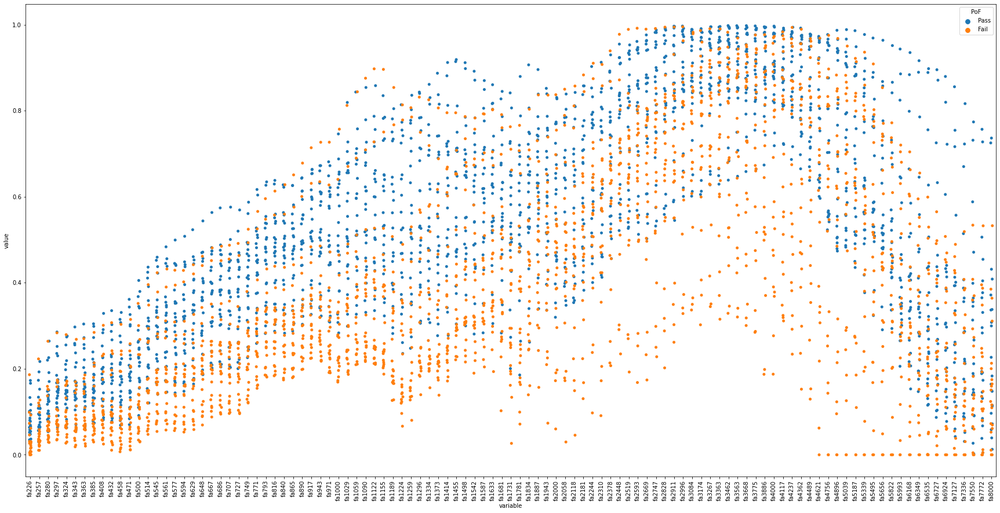

In [193]:
plt.figure(figsize=(30, 15))
plt.xticks(rotation=90)
sb.stripplot(data=plot_data,x="variable",y="value",hue="PoF")

<AxesSubplot:xlabel='variable', ylabel='value'>

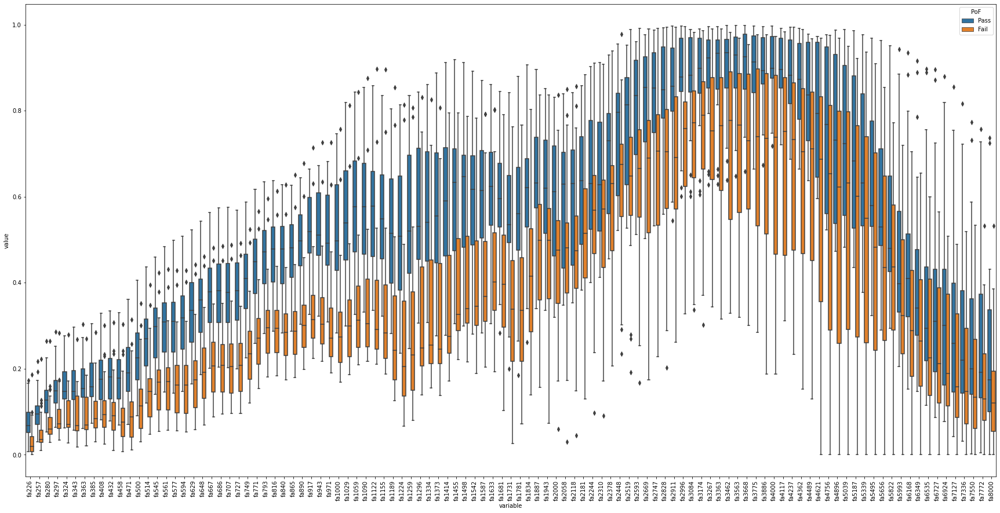

In [194]:
plt.figure(figsize=(30, 15))
plt.xticks(rotation=90)
sb.boxplot(data=plot_data,x="variable",y="value",hue="PoF")

### 02 - SMOTE Over-sampling

<AxesSubplot:xlabel='OverallPoF', ylabel='count'>

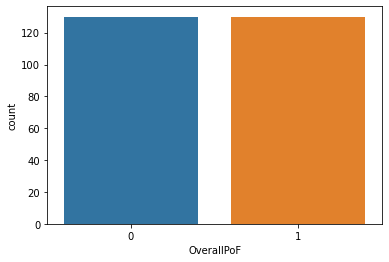

In [730]:
X_train2=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\02 - SMOTE\\X_train.csv")
X_val2=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\02 - SMOTE\\X_val.csv")
X_test2=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\02 - SMOTE\\X_test.csv")
y_train2=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\02 - SMOTE\\y_train.csv")
y_val2=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\02 - SMOTE\\y_val.csv")
y_test2=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\02 - SMOTE\\y_test.csv")
sb.countplot(y_train2['OverallPoF'],fill='OverallPoF')

In [731]:
X_train2=X_train2.filter(regex='fa',axis=1)
X_val2=X_val2.filter(regex='fa',axis=1)
X_test2=X_test2.filter(regex='fa',axis=1)

In [732]:
data=pd.concat([X_train2,y_train2],axis=1)
plot_data=pd.melt(data,'OverallPoF')
plot_data['PoF'] = np.where(plot_data['OverallPoF']==0, 'Pass', 'Fail')
plot_data.head(5)

,OverallPoF,variable,value,PoF
0,0,fa226,0.0620,Pass
1,0,fa226,0.0348,Pass
2,0,fa226,0.0026,Pass
3,0,fa226,0.0283,Pass
4,0,fa226,0.0359,Pass


<AxesSubplot:xlabel='variable', ylabel='value'>

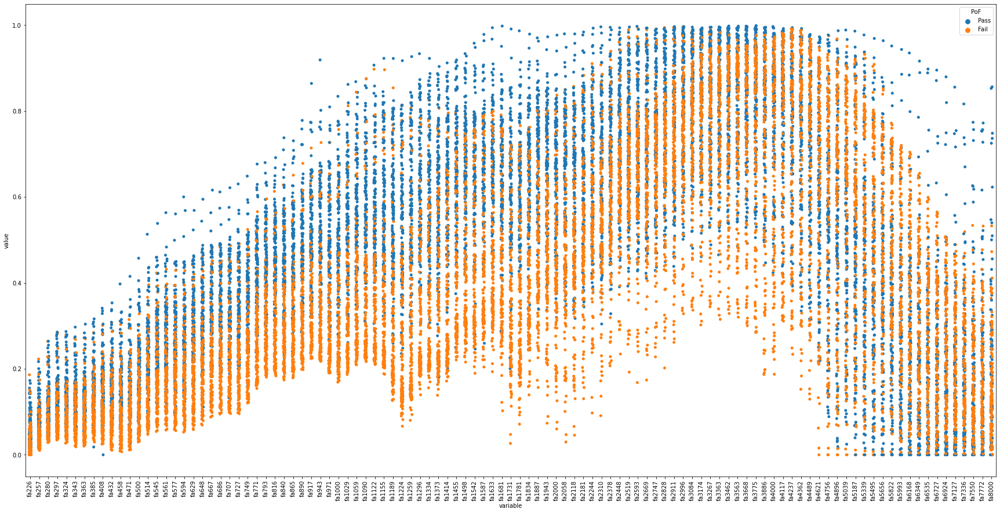

In [198]:
plt.figure(figsize=(30, 15))
plt.xticks(rotation=90)
sb.stripplot(data=plot_data,x="variable",y="value",hue="PoF")

<AxesSubplot:xlabel='variable', ylabel='value'>

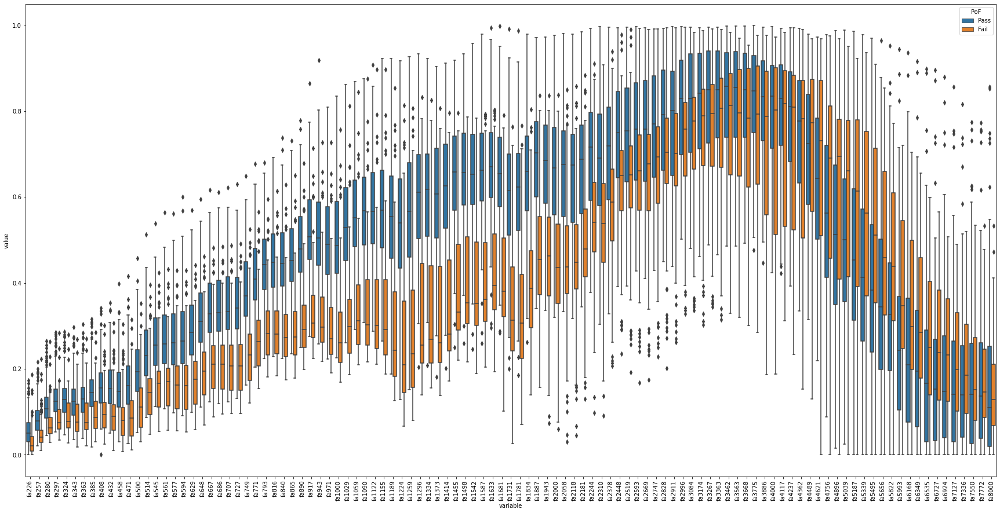

In [199]:
plt.figure(figsize=(30, 15))
plt.xticks(rotation=90)
sb.boxplot(data=plot_data,x="variable",y="value",hue="PoF")

### 03 - SMOTEENN

<AxesSubplot:xlabel='OverallPoF', ylabel='count'>

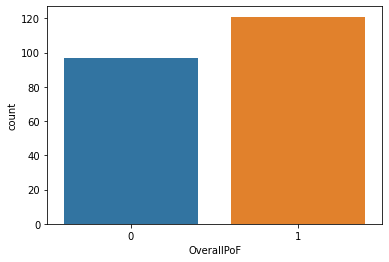

In [200]:
X_train3=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\03 - SMOTEENN\\X_train.csv")
X_val3=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\03 - SMOTEENN\\X_val.csv")
X_test3=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\03 - SMOTEENN\\X_test.csv")
y_train3=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\03 - SMOTEENN\\y_train.csv")
y_val3=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\03 - SMOTEENN\\y_val.csv")
y_test3=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\03 - SMOTEENN\\y_test.csv")
sb.countplot(y_train3['OverallPoF'],fill='OverallPoF')

In [201]:
X_train3.head()

,Gender,AgeM,ECV,TPP,SC,OAE1,OAE1.4,OAE2,OAE2.8,OAE4,...,fp6168,fp6349,fp6535,fp6727,fp6924,fp7127,fp7336,fp7550,fp7772,fp8000
0,0,97,1.01,-78,0.84,14.7,22.9,19.2,7.5,10.6,...,-88.8839,-88.8359,-90.6649,-90.3674,-88.3935,-91.0641,-92.7877,-114.7202,122.4531,112.2305
1,1,117,0.71,3,0.47,21.0,18.0,22.0,15.0,11.0,...,-51.7346,-22.2277,50.3318,80.6503,82.6362,86.7219,87.6202,90.5000,91.0953,93.3113
2,1,104,0.88,-11,0.46,9.5,11.3,11.1,13.5,11.1,...,136.2679,102.0953,97.2395,94.3545,90.6787,89.1412,87.2806,86.4388,84.9723,83.5814
3,0,102,0.80,-8,0.70,4.0,7.0,11.0,15.0,15.0,...,-49.2873,-42.2230,-25.7535,6.9751,24.5090,46.7996,62.4586,73.2916,75.2660,80.3582
4,0,106,1.54,-11,0.78,3.0,22.0,20.0,17.0,20.0,...,-70.2761,-65.7322,-58.6314,-41.7434,-23.7137,10.4994,41.8514,60.6193,67.1151,72.2054


In [202]:
X_train3=X_train3.filter(regex='fa',axis=1)
X_val3=X_val3.filter(regex='fa',axis=1)
X_test3=X_test3.filter(regex='fa',axis=1)

In [203]:
data=pd.concat([X_train3,y_train3],axis=1)
plot_data=pd.melt(data,'OverallPoF')
plot_data['PoF'] = np.where(plot_data['OverallPoF']==0, 'Pass', 'Fail')
plot_data.head(5)

,OverallPoF,variable,value,PoF
0,0,fa226,0.0026,Pass
1,0,fa226,0.0359,Pass
2,0,fa226,0.0345,Pass
3,0,fa226,0.0802,Pass
4,0,fa226,0.1476,Pass


<AxesSubplot:xlabel='variable', ylabel='value'>

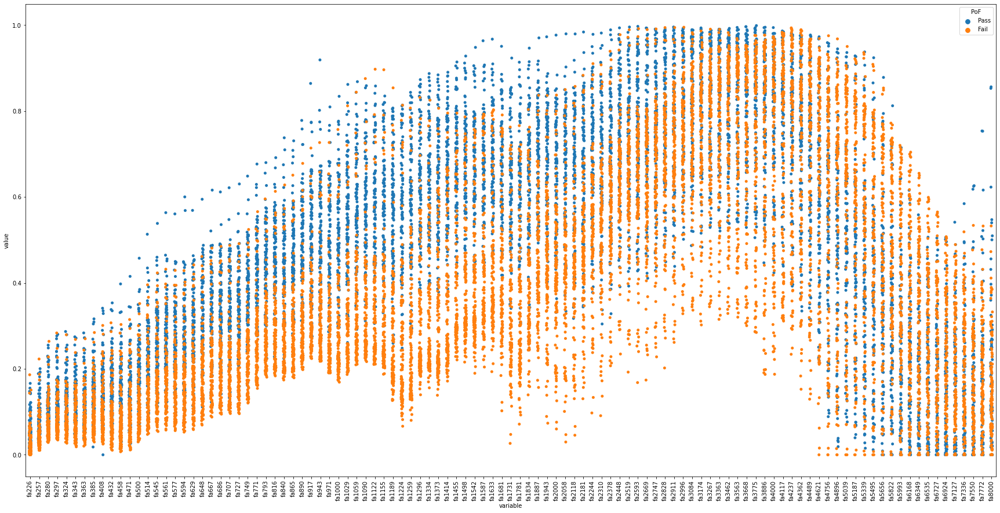

In [204]:
plt.figure(figsize=(30, 15))
plt.xticks(rotation=90)
sb.stripplot(data=plot_data,x="variable",y="value",hue="PoF")

<AxesSubplot:xlabel='variable', ylabel='value'>

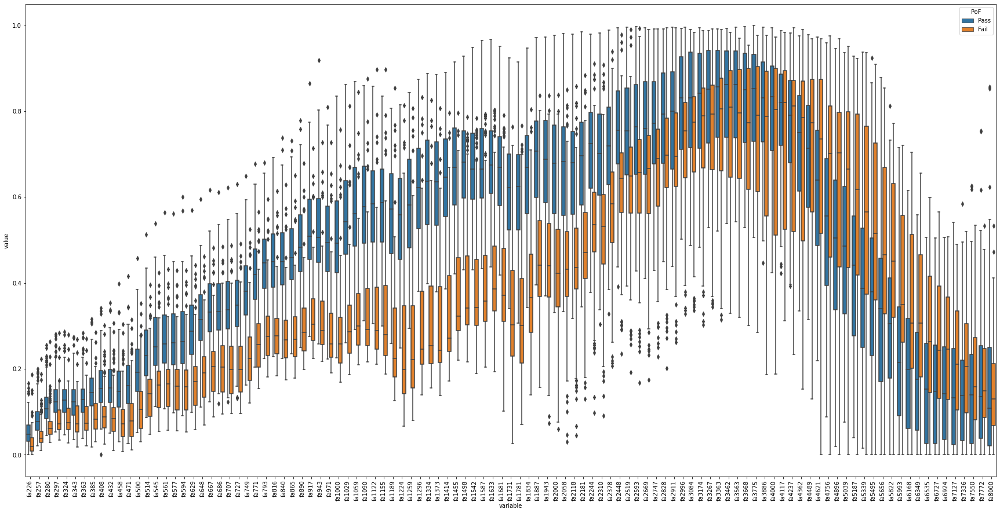

In [205]:
plt.figure(figsize=(30, 15))
plt.xticks(rotation=90)
sb.boxplot(data=plot_data,x="variable",y="value",hue="PoF")

### 04 - SMOTETomek

<AxesSubplot:xlabel='OverallPoF', ylabel='count'>

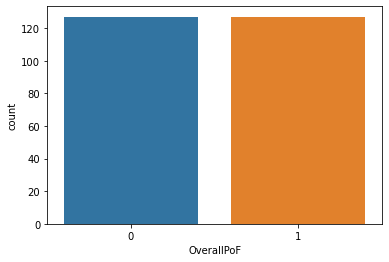

In [206]:
X_train4=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\04 - SMOTETomek\\X_train.csv")
X_val4=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\04 - SMOTETomek\\X_val.csv")
X_test4=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\04 - SMOTETomek\\X_test.csv")
y_train4=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\04 - SMOTETomek\\y_train.csv")
y_val4=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\04 - SMOTETomek\\y_val.csv")
y_test4=pd.read_csv("C:\\Users\\AndyJ\\12-Ears\\P1\\03 - Code\\00 - Dataset\\03 - Sampling Splits\\04 - SMOTETomek\\y_test.csv")
sb.countplot(y_train4['OverallPoF'],fill='OverallPoF')

In [207]:
X_train4=X_train4.filter(regex='fa',axis=1)
X_val4=X_val4.filter(regex='fa',axis=1)
X_test4=X_test4.filter(regex='fa',axis=1)

In [208]:
data=pd.concat([X_train4,y_train4],axis=1)
plot_data=pd.melt(data,'OverallPoF')
plot_data['PoF'] = np.where(plot_data['OverallPoF']==0, 'Pass', 'Fail')
plot_data.head(5)

,OverallPoF,variable,value,PoF
0,0,fa226,0.0348,Pass
1,0,fa226,0.0026,Pass
2,0,fa226,0.0283,Pass
3,0,fa226,0.0359,Pass
4,0,fa226,0.0434,Pass


<AxesSubplot:xlabel='variable', ylabel='value'>

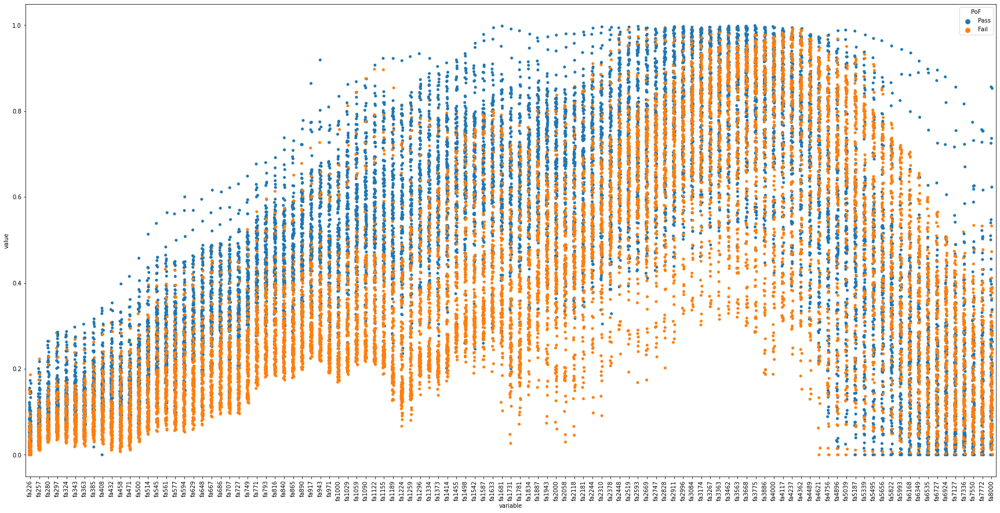

In [209]:
plt.figure(figsize=(30, 15))
plt.xticks(rotation=90)
sb.stripplot(data=plot_data,x="variable",y="value",hue="PoF")

<AxesSubplot:xlabel='variable', ylabel='value'>

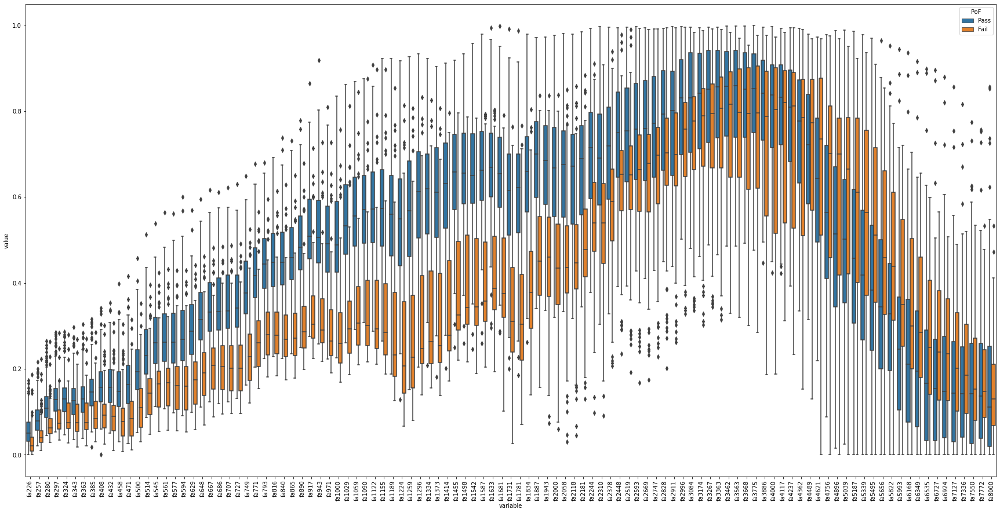

In [210]:
plt.figure(figsize=(30, 15))
plt.xticks(rotation=90)
sb.boxplot(data=plot_data,x="variable",y="value",hue="PoF")

### Distribution of Pass and Fails

In [623]:
# getting necessary libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt

test3=test.iloc[0:3380,]
freq_test2=X_train1.columns[0:13]
freq_test2

# getting the data
lst2 =freq_test2
freq_list2=dict(zip(range(len(lst2)),lst2))

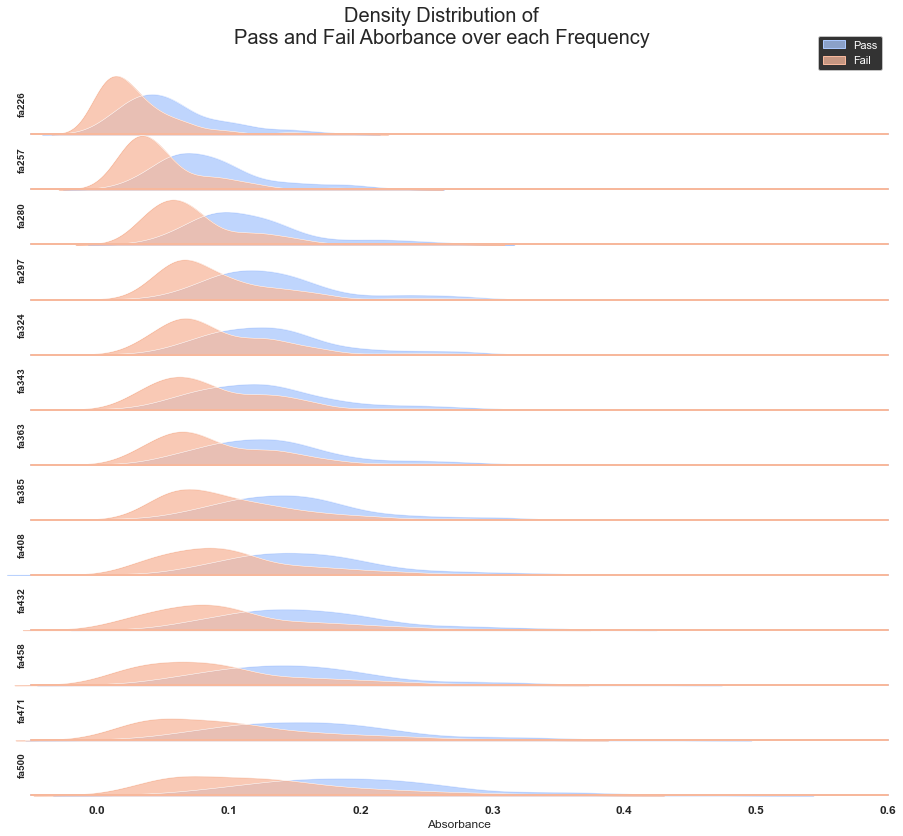

In [624]:
# we generate a color palette with Seaborn.color_palette()
pal = sb.color_palette(palette='coolwarm', n_colors=2)

# in the sb.FacetGrid class, the 'hue' argument is the one that is the one that will be represented by colors with 'palette'
g = sb.FacetGrid(test3, row='variable', hue='PoF', aspect=15, height=0.85, palette=pal)

# then we add the densities kdeplots for each month
g.map(sb.kdeplot, 'value',
      bw_adjust=1, clip_on=False,
      fill=True, alpha=0.75, linewidth=1)

# here we add a white line that represents the contour of each kdeplot
g.map(sb.kdeplot, 'value', 
      bw_adjust=1, clip_on=False, 
      color="w", lw=0.5)

# here we add a horizontal line for each plot
g.map(plt.axhline, y=0,
      lw=2, clip_on=False)

# we loop over the FacetGrid figure axes (g.axes.flat) and add the month as text with the right color
# notice how ax.lines[-1].get_color() enables you to access the last line's color in each matplotlib.Axes
for i, ax in enumerate(g.axes.flat):
    ax.set_ylabel(freq_list2[i],fontweight='bold', fontsize=10)

# we use matplotlib.Figure.subplots_adjust() function to get the subplots to overlap
g.fig.subplots_adjust(hspace=-0.1)

# eventually we remove axes titles, yticks and spines
g.set_titles("")
g.set(yticks=[])
g.set(xlabel="Absorbance")
g.set(xlim=[-0.05,0.6])
g.despine(bottom=True, left=True)


plt.setp(ax.get_xticklabels(), fontsize=12, fontweight='bold')
plt.legend(['Pass','Fail'],loc='best', bbox_to_anchor=(0.5, 6.25, 0.5, 6.25),labelcolor="white")
g.fig.suptitle('Density Distribution of\nPass and Fail Aborbance over each Frequency',y=1.05,
               ha='center',
               fontsize=20,
               fontweight=20)

plt.show()

In [581]:
f_list=X_train1.columns
list(f_list).index('fa1414')

46

In [604]:
import re
freq_list=[]
for string in f_list:
    freq_list += re.findall(r'\d+', string)

In [583]:
def freq_getter(start_f,end_f,f_list):
    return list(f_list).index(start_f), list(f_list).index(end_f)
    
    

In [584]:
freq_getter('fa500','fa514',f_list)

(12, 13)

In [543]:
# getting necessary libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt

test2=test.iloc[8840:12220,]
freq_test=X_train1.columns[34:47]
freq_test

# getting the data
lst =freq_test
freq_list=dict(zip(range(len(lst)),lst))

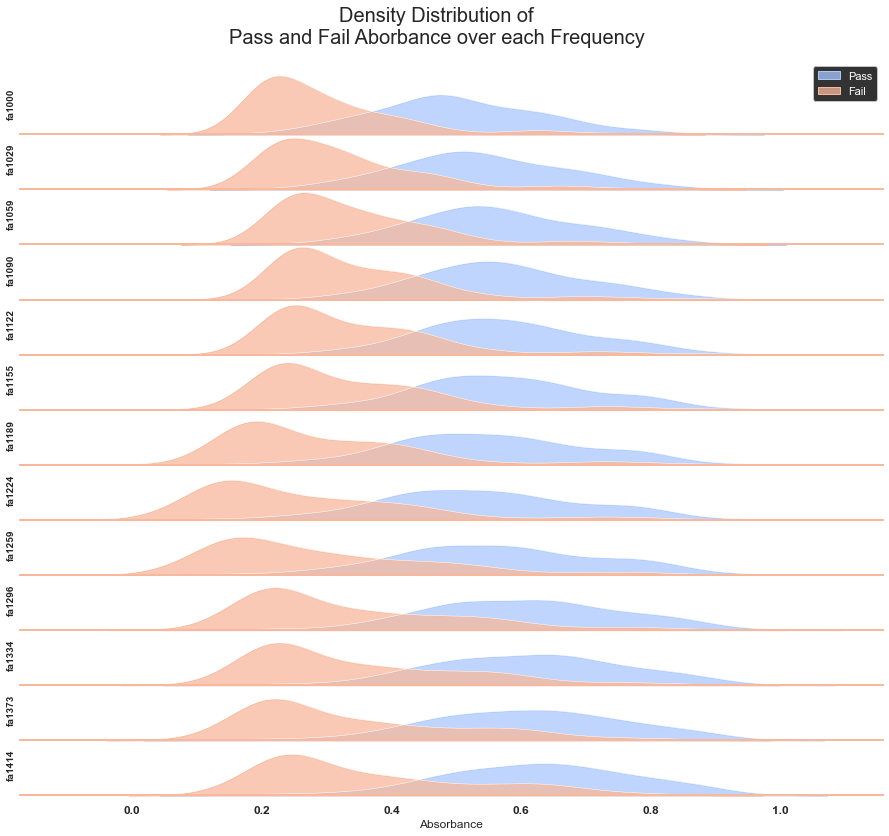

In [544]:
# we generate a color palette with Seaborn.color_palette()
pal = sb.color_palette(palette='coolwarm', n_colors=2)

# in the sb.FacetGrid class, the 'hue' argument is the one that is the one that will be represented by colors with 'palette'
g = sb.FacetGrid(test2, row='variable', hue='PoF', aspect=15, height=0.85, palette=pal)

# then we add the densities kdeplots for each month
g.map(sb.kdeplot, 'value',
      bw_adjust=1, clip_on=False,
      fill=True, alpha=0.75, linewidth=1)

# here we add a white line that represents the contour of each kdeplot
g.map(sb.kdeplot, 'value', 
      bw_adjust=1, clip_on=False, 
      color="w", lw=0.5)

# here we add a horizontal line for each plot
g.map(plt.axhline, y=0,
      lw=2, clip_on=False)

# we loop over the FacetGrid figure axes (g.axes.flat) and add the month as text with the right color
# notice how ax.lines[-1].get_color() enables you to access the last line's color in each matplotlib.Axes
for i, ax in enumerate(g.axes.flat):
    ax.set_ylabel(freq_list[i],fontweight='bold', fontsize=10)

# we use matplotlib.Figure.subplots_adjust() function to get the subplots to overlap
g.fig.subplots_adjust(hspace=-0.1)

# eventually we remove axes titles, yticks and spines
g.set_titles("")
g.set(yticks=[])
g.set(xlabel="Absorbance")
g.despine(bottom=True, left=True)


plt.setp(ax.get_xticklabels(), fontsize=12, fontweight='bold')
plt.legend(['Pass','Fail'],loc='best', bbox_to_anchor=(0.5, 6, 0.5, 6),labelcolor="white")
g.fig.suptitle('Density Distribution of\nPass and Fail Aborbance over each Frequency',y=1.05,
               ha='center',
               fontsize=20,
               fontweight=20)

plt.show()

In [367]:
data=pd.concat([X_train2,y_train2],axis=1)
plot_data=pd.melt(data,'OverallPoF')
plot_data['PoF'] = np.where(plot_data['OverallPoF']==0, 'Pass', 'Fail')
plot_data['PoF'] = np.where(plot_data['OverallPoF']==0, 'Pass', 'Fail')
plot_data.head(5)

,OverallPoF,variable,value,PoF
0,0,fa226,0.0620,Pass
1,0,fa226,0.0348,Pass
2,0,fa226,0.0026,Pass
3,0,fa226,0.0283,Pass
4,0,fa226,0.0359,Pass


## 4.0 - Feature Selection

### 01 - Filter Methods

#### 01 - SelectKBest - ANOVA ONE-WAY F-TEST

#### Visualised

In [156]:
from scipy.stats import f_oneway

data=pd.concat([X_train2,y_train2],axis=1)
plot_data=pd.melt(data,'OverallPoF')
plot_data['PoF'] = np.where(plot_data['OverallPoF']==0, 'Pass', 'Fail')


In [157]:
passes=plot_data.loc[(plot_data['variable']=='fa226') & (plot_data['PoF']=='Pass')].value

In [158]:
fails=plot_data.loc[(plot_data['variable']=='fa226') & (plot_data['PoF']=='Fail')].value

In [159]:
f_stat=[]
p_val=[]
for i in X_train2.columns.values:
    passes=plot_data.loc[(plot_data['variable']==i) & (plot_data['PoF']=='Pass')].value
    fails=plot_data.loc[(plot_data['variable']==i) & (plot_data['PoF']=='Fail')].value
    f_stat.append(f_oneway(passes,fails)[0])
    p_val.append(f_oneway(passes,fails)[1])

In [160]:
freq=X_train2.columns.values
f_scores=pd.DataFrame({'freq':freq,'f_stat':f_stat,'p_val':p_val})
f_scores.head()

,freq,f_stat,p_val
0,fa226,43.913785,1.991023e-10
1,fa257,60.196836,2.002439e-13
2,fa280,63.983195,4.251649e-14
3,fa297,64.469037,3.489942e-14
4,fa324,57.838041,5.311370e-13


In [161]:
f_scores.sort_values('f_stat',ascending=False).head(10)

,freq,f_stat,p_val
37,fa1090,228.635369,2.030220e-37
44,fa1334,224.603490,5.965834e-37
43,fa1296,224.066841,6.890919e-37
38,fa1122,222.026341,1.193900e-36
36,fa1059,218.087623,3.472291e-36
39,fa1155,217.843730,3.710679e-36
45,fa1373,216.972585,4.705188e-36
40,fa1189,216.726238,5.032381e-36
41,fa1224,213.911420,1.087602e-35
46,fa1414,213.131679,1.347540e-35


<AxesSubplot:xlabel='freq', ylabel='f_stat'>

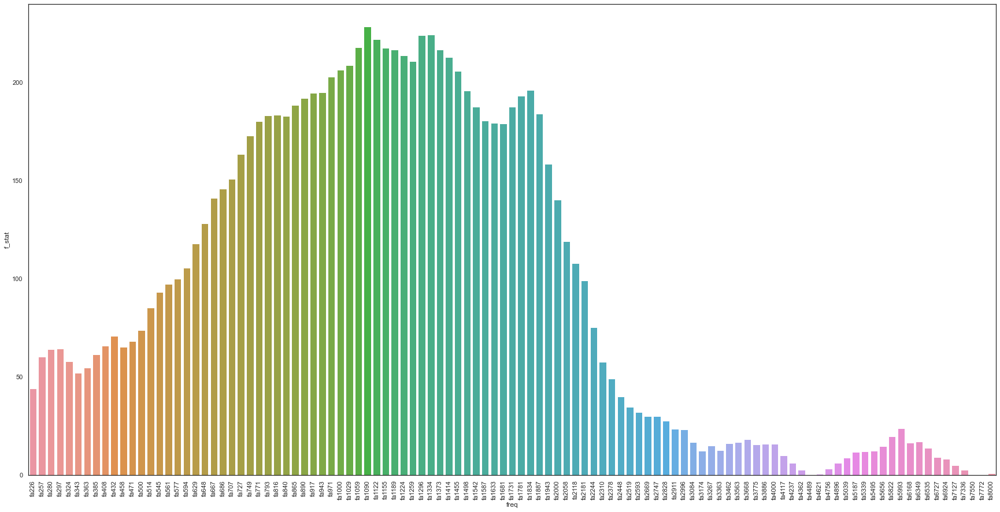

In [612]:
plt.figure(figsize=(30, 15))
plt.xticks(rotation=90)
sb.barplot(data=f_scores,x='freq',y='f_stat')

##### 00 - Original Results

In [1082]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
start = timeit.default_timer()
X=X_train0
y=y_train0
X_new0 = SelectKBest(f_classif, k=15).fit(X, y)

mask0=X_new0.get_support()
anov_feat_0 = [] 
for bool, feature in zip(mask0, X_train0.columns):
    if bool:
        anov_feat_0.append(feature)
print("The best features are:{}".format(anov_feat_0))

stop = timeit.default_timer()

anova_time_0=stop-start
print('Time: ',anova_time_0)

The best features are:['fa1224', 'fa1259', 'fa1296', 'fa1334', 'fa1373', 'fa1414', 'fa1455', 'fa1498', 'fa1542', 'fa1587', 'fa1633', 'fa1681', 'fa1731', 'fa1781', 'fa1834']
Time:  0.011655399997835048


##### 01 - Nearmiss Results

In [1083]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
start = timeit.default_timer()

X=X_train1
y=y_train1
X_new1 = SelectKBest(f_classif, k=15).fit(X, y)
mask1=X_new1.get_support()
anov_feat_1 = [] 
for bool, feature in zip(mask1, X_train1.columns):
    if bool:
        anov_feat_1.append(feature)
print("The best features are:{}".format(anov_feat_1))

stop = timeit.default_timer()

anova_time_1=stop-start
print('Time: ',anova_time_1)

The best features are:['fa686', 'fa707', 'fa727', 'fa749', 'fa771', 'fa793', 'fa816', 'fa840', 'fa865', 'fa890', 'fa917', 'fa943', 'fa971', 'fa1000', 'fa1029']
Time:  0.008550699989427812


##### 02 - SMOTE Results

In [1084]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
start = timeit.default_timer()

X=X_train2
y=y_train2
X_new2 = SelectKBest(f_classif, k=15).fit(X, y)
mask2=X_new2.get_support()
anov_feat_2 = [] 
for bool, feature in zip(mask2, X_train2.columns):
    if bool:
        anov_feat_2.append(feature)
print("The best features are:{}".format(anov_feat_2))

stop = timeit.default_timer()

anova_time_2=stop-start
print('Time: ',anova_time_2)

The best features are:['fa971', 'fa1000', 'fa1029', 'fa1059', 'fa1090', 'fa1122', 'fa1155', 'fa1189', 'fa1224', 'fa1259', 'fa1296', 'fa1334', 'fa1373', 'fa1414', 'fa1455']
Time:  0.015168600002652965


##### 03 - SMOTEENN Results

In [1085]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
start = timeit.default_timer()

X=X_train3
y=y_train3
X_new3 = SelectKBest(f_classif, k=15).fit(X, y)
mask3=X_new3.get_support()
anov_feat_3 = [] 
for bool, feature in zip(mask3, X_train3.columns):
    if bool:
        anov_feat_3.append(feature)
print("The best features are:{}".format(anov_feat_3))

stop = timeit.default_timer()

anova_time_3=stop-start
print('Time: ',anova_time_3)

The best features are:['fa1000', 'fa1029', 'fa1059', 'fa1090', 'fa1122', 'fa1155', 'fa1189', 'fa1224', 'fa1259', 'fa1296', 'fa1334', 'fa1373', 'fa1414', 'fa1455', 'fa1498']
Time:  0.008580399997299537


##### 04 - SMOTETomek Results

In [1086]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
start = timeit.default_timer()

X=X_train4
y=y_train4
X_new4 = SelectKBest(f_classif, k=15).fit(X, y)
mask4=X_new4.get_support()
anov_feat_4 = [] 
for bool, feature in zip(mask4, X_train4.columns):
    if bool:
        anov_feat_4.append(feature)
print("The best features are:{}".format(anov_feat_4))

stop = timeit.default_timer()

anova_time_4=stop-start
print('Time: ',anova_time_4)

The best features are:['fa917', 'fa971', 'fa1000', 'fa1029', 'fa1059', 'fa1090', 'fa1122', 'fa1155', 'fa1189', 'fa1224', 'fa1259', 'fa1296', 'fa1334', 'fa1373', 'fa1414']
Time:  0.013561600004322827


##### 05 - Percentile of features selected SMOTETomek

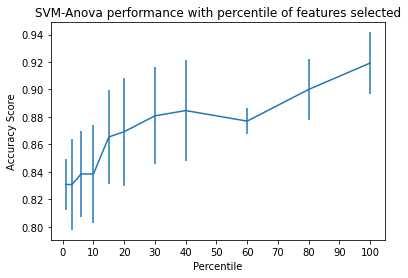

In [230]:
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectPercentile, chi2
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
import matplotlib.pyplot as plt
from sklearn.model_selection import cross_val_score

# Create a feature-selection transform, a scaler and an instance of SVM that we
# combine together to have a full-blown estimator

clf = Pipeline(
    [
        ("anova", SelectPercentile(chi2)),
        ("scaler", StandardScaler()),
        ("svc", SVC(kernel='linear')),
    ]
)


score_means = list()
score_stds = list()
percentiles = (1, 3, 6, 10, 15, 20, 30, 40, 60, 80, 100)

for percentile in percentiles:
    clf.set_params(anova__percentile=percentile)
    this_scores = cross_val_score(clf, X_train2, y_train2)
    score_means.append(this_scores.mean())
    score_stds.append(this_scores.std())

plt.errorbar(percentiles, score_means, np.array(score_stds))
plt.title("SVM-Anova performance with percentile of features selected")
plt.xticks(np.linspace(0, 100, 11, endpoint=True))
plt.xlabel("Percentile")
plt.ylabel("Accuracy Score")
plt.show()

### 02 - Wrapper Methods

#### 01 - Recursive Feature Elimination (RFE)

##### 00 - Original Results

In [999]:
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.datasets import make_classification

start = timeit.default_timer()

# Create the RFE object and compute a cross-validated score.
svc = SVC(kernel="linear")
# The "accuracy" scoring shows the proportion of correct classifications

min_features_to_select = 1  # Minimum number of features to consider
rfecv_0 = RFECV(
    estimator=svc,
    step=1,
    cv=StratifiedKFold(10),
    scoring="accuracy",
    min_features_to_select=min_features_to_select,
)
rfecv_0.fit(X_train0, y_train0)

print("Optimal number of features : %d" % rfecv_0.n_features_)

ranking = pd.DataFrame(rfecv_0.ranking_, columns = ['Ranking'])
features=pd.DataFrame(X_train0.columns.values[rfecv_0.ranking_],columns=['Features'])
# feature_rank=pd.concat([ranking,features],axis=1)
rfe_svc_0=X_train0.columns[rfecv_0.support_]
rfe_svc_0_total=X_train0.columns[rfecv_0.support_].size

stop = timeit.default_timer()

rfe_svc_time_0=stop-start
print('Time: ',rfe_svc_time_0)

Optimal number of features : 7
Time:  4.192980899999384


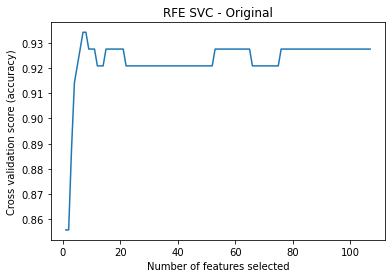

Best features: Index(['fa1000', 'fa1090', 'fa1122', 'fa2747', 'fa4000', 'fa4117'], dtype='object')


In [1000]:
rfeSVC_feat_0=X_train0.columns[rfecv_0.support_]
# Plot number of features VS. cross-validation scores
plt.figure()
plt.title("RFE SVC - Original")
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (accuracy)")
plt.plot(
    range(min_features_to_select, len(rfecv_0.grid_scores_) + min_features_to_select),
    rfecv_0.cv_results_['mean_test_score'],
)
plt.show()
print("Best features:", X_train0.columns[rfecv.support_])

##### 01 - Nearmiss Results

In [997]:
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.datasets import make_classification

start = timeit.default_timer()
# Create the RFE object and compute a cross-validated score.
svc = SVC(kernel="linear")
# The "accuracy" scoring shows the proportion of correct classifications

min_features_to_select = 1  # Minimum number of features to consider
rfecv_1 = RFECV(
    estimator=svc,
    step=1,
    cv=StratifiedKFold(10),
    scoring="accuracy",
    min_features_to_select=min_features_to_select,
)
rfecv_1.fit(X_train1, y_train1)

ranking = pd.DataFrame(rfecv_1.ranking_, columns = ['Ranking'])
features=pd.DataFrame(X_train1.columns.values[rfecv.ranking_],columns=['Features'])
# feature_rank=pd.concat([ranking,features],axis=1)
rfe_svc_1=X_train1.columns[rfecv_1.support_]
rfe_svc_1_total=X_train1.columns[rfecv_1.support_].size

stop = timeit.default_timer()

rfe_svc_time_1=stop-start
print('Time: ',rfe_svc_time_1)

Time:  4.5493971000105375


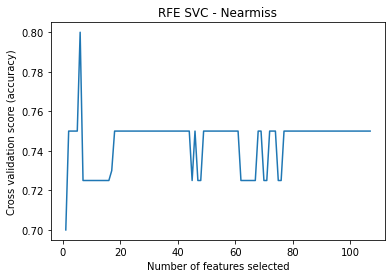

Optimal number of features : 6
Best features: Index(['fa1000', 'fa1090', 'fa1122', 'fa2747', 'fa4000', 'fa4117'], dtype='object')


In [1001]:
rfeSVC_feat_1=X_train1.columns[rfecv_1.support_]
# Plot number of features VS. cross-validation scores

plt.figure()
plt.title("RFE SVC - Nearmiss")
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (accuracy)")
plt.plot(
    range(min_features_to_select, len(rfecv_1.grid_scores_) + min_features_to_select),
    rfecv_1.cv_results_['mean_test_score'],
)
plt.show()
print("Optimal number of features : %d" % rfecv.n_features_)
print("Best features:", X_train1.columns[rfecv.support_])

##### 02 - SMOTE Results

In [1002]:
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.datasets import make_classification

start = timeit.default_timer()

# Create the RFE object and compute a cross-validated score.
svc = SVC(kernel="linear")
# The "accuracy" scoring shows the proportion of correct classifications

min_features_to_select = 1  # Minimum number of features to consider
rfecv_2 = RFECV(
    estimator=svc,
    step=1,
    cv=StratifiedKFold(10),
    scoring="accuracy",
    min_features_to_select=min_features_to_select,
)
rfecv_2.fit(X_train2, y_train2)

ranking = pd.DataFrame(rfecv_2.ranking_, columns = ['Ranking'])
features=pd.DataFrame(X_train2.columns.values[rfecv_2.ranking_],columns=['Features'])
# feature_rank=pd.concat([ranking,features],axis=1)
rfe_svc_2=X_train2.columns[rfecv_2.support_]
rfe_svc_2_total=X_train2.columns[rfecv_2.support_].size

stop = timeit.default_timer()

rfe_svc_time_2=stop-start

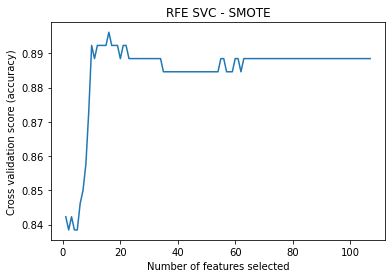

Time:  6.900542499992298
Optimal number of features : 16
Best features: Index(['fa1029', 'fa1059', 'fa1090', 'fa1296', 'fa1781', 'fa1834', 'fa1887',
       'fa2118', 'fa2181', 'fa2911', 'fa3084', 'fa3174', 'fa3363', 'fa4000',
       'fa4117', 'fa5039'],
      dtype='object')


In [1003]:
rfeSVC_feat_2=X_train2.columns[rfecv_2.support_]

# Plot number of features VS. cross-validation scores
plt.figure()
plt.title("RFE SVC - SMOTE")
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (accuracy)")
plt.plot(
    range(min_features_to_select, len(rfecv_2.grid_scores_) + min_features_to_select),
    rfecv_2.cv_results_['mean_test_score'],
)
plt.show()
print('Time: ',rfe_svc_time_2)
print("Optimal number of features : %d" % rfecv_2.n_features_)
print("Best features:", X_train2.columns[rfecv_2.support_])

##### 03 - SMOTEENN Results

In [1004]:
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.datasets import make_classification

start = timeit.default_timer()

# Create the RFE object and compute a cross-validated score.
svc = SVC(kernel="linear")
# The "accuracy" scoring shows the proportion of correct classifications

min_features_to_select = 1  # Minimum number of features to consider
rfecv_3 = RFECV(
    estimator=svc,
    step=1,
    cv=StratifiedKFold(10),
    scoring="accuracy",
    min_features_to_select=min_features_to_select,
)
rfecv_3.fit(X_train3, y_train3)

ranking = pd.DataFrame(rfecv_3.ranking_, columns = ['Ranking'])
features=pd.DataFrame(X_train3.columns.values[rfecv_3.ranking_],columns=['Features'])
# feature_rank=pd.concat([ranking,features],axis=1)
rfe_svc_3=X_train3.columns[rfecv_3.support_]
rfe_svc_3_total=X_train3.columns[rfecv_3.support_].size

stop = timeit.default_timer()

rfe_svc_time_3=stop-start

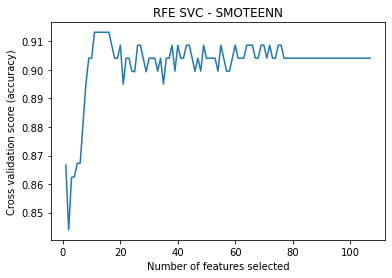

Time:  6.86220279999543
Optimal number of features : 11
Best features: Index(['fa1090', 'fa1259', 'fa1296', 'fa1334', 'fa2118', 'fa2181', 'fa2911',
       'fa3174', 'fa4000', 'fa4896', 'fa6349'],
      dtype='object')


In [1005]:
rfeSVC_feat_3=X_train3.columns[rfecv_3.support_]

# Plot number of features VS. cross-validation scores
plt.figure()
plt.title("RFE SVC - SMOTEENN")
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (accuracy)")
plt.plot(
    range(min_features_to_select, len(rfecv_3.grid_scores_) + min_features_to_select),
    rfecv_3.cv_results_['mean_test_score'],
)
plt.show()
print('Time: ',rfe_svc_time_3)
print("Optimal number of features : %d" % rfecv_3.n_features_)
print("Best features:", X_train3.columns[rfecv_3.support_])

##### 04 - SMOTETomek Results

In [1006]:
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.datasets import make_classification

start = timeit.default_timer()

# Create the RFE object and compute a cross-validated score.
svc = SVC(kernel="linear")
# The "accuracy" scoring shows the proportion of correct classifications

min_features_to_select = 1  # Minimum number of features to consider
rfecv_4 = RFECV(
    estimator=svc,
    step=1,
    cv=StratifiedKFold(10),
    scoring="accuracy",
    min_features_to_select=min_features_to_select,
)
rfecv_4.fit(X_train4, y_train4)

ranking = pd.DataFrame(rfecv_4.ranking_, columns = ['Ranking'])
features=pd.DataFrame(X_train4.columns.values[rfecv_4.ranking_],columns=['Features'])
# feature_rank=pd.concat([ranking,features],axis=1)
rfe_svc_4=X_train4.columns[rfecv_4.support_]
rfe_svc_4_total=X_train4.columns[rfecv_4.support_].size

stop = timeit.default_timer()

rfe_svc_time_4=stop-start

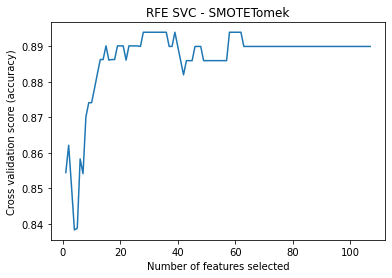

Time:  7.43719240000064
Optimal number of features : 28
Best features: Index(['fa771', 'fa1029', 'fa1059', 'fa1090', 'fa1122', 'fa1259', 'fa1296',
       'fa1781', 'fa1834', 'fa1887', 'fa2058', 'fa2118', 'fa2181', 'fa2244',
       'fa2911', 'fa3084', 'fa3174', 'fa3267', 'fa3363', 'fa4000', 'fa4117',
       'fa4237', 'fa4756', 'fa4896', 'fa5039', 'fa5495', 'fa5656', 'fa5993'],
      dtype='object')


In [1007]:
rfeSVC_feat_4=X_train4.columns[rfecv_4.support_]

# Plot number of features VS. cross-validation scores
plt.figure()
plt.title("RFE SVC - SMOTETomek")
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (accuracy)")
plt.plot(
    range(min_features_to_select, len(rfecv_4.grid_scores_) + min_features_to_select),
    rfecv_4.cv_results_['mean_test_score'],
)
plt.show()
print('Time: ',rfe_svc_time_4)
print("Optimal number of features : %d" % rfecv_4.n_features_)
print("Best features:", X_train4.columns[rfecv_4.support_])

#### 02 - Recursive Feature Elimination (Random Forest Classifier)

##### 00 - Original Results

In [305]:
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
start = timeit.default_timer()

cv_estimator = RandomForestClassifier(random_state =12)
cv_estimator.fit(X_train0, y_train0)
cv_selector_rf_0 = RFECV(cv_estimator,cv= 5, step=1,scoring='accuracy')
cv_selector_rf_0 = cv_selector_rf_0.fit(X_train0, y_train0)

stop = timeit.default_timer()
rfe_rf_time_0=stop-start

Time:  212.8086639999965
Optimal number of features : 12
Best features : ['fa257', 'fa1090', 'fa1122', 'fa1155', 'fa1224', 'fa1296', 'fa1334', 'fa1373', 'fa1414', 'fa4117', 'fa4896', 'fa5039']


<AxesSubplot:xlabel='f_importance', ylabel='name'>

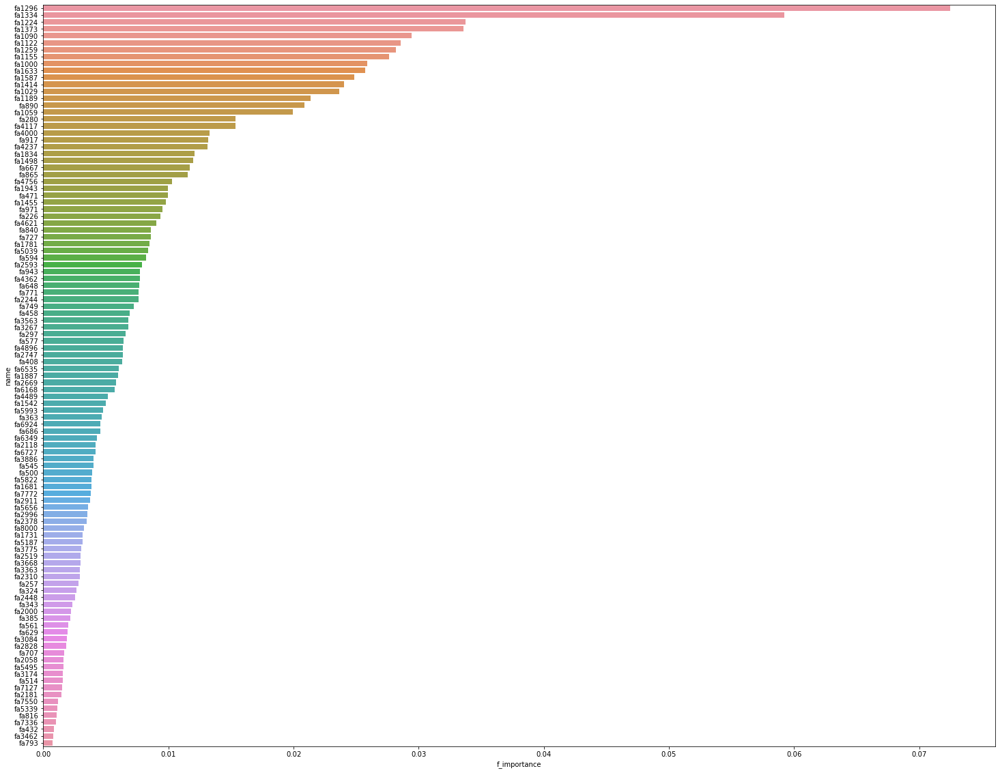

In [306]:
rfecv_mask = cv_selector_rf_0.get_support() #list of booleans
rfecv_feat_rf_0 = [] 
for bool, feature in zip(rfecv_mask, X_train0.columns):
    if bool:
        rfecv_feat_rf_0.append(feature)
        
print('Time: ',rfe_rf_time_0)
print('Optimal number of features :', cv_selector_rf_0.n_features_)
print('Best features :', rfecv_feat_rf_0)
n_features = X_train0.shape[1]

n0=np.arange(n_features)
v0=X_train0.columns.values
f0=cv_estimator.feature_importances_

rfecv_rf_0=pd.DataFrame({'idx':n0,'name':v0,'f_importance':f0})
rfecv_rf_0

plt.figure(figsize=(25,20))
sb.barplot(x='f_importance',
            y="name", 
            data=rfecv_rf_0, 
            order=rfecv_rf_0.sort_values('f_importance',ascending=False).name)

##### 01 - Nearmiss Results

In [401]:
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
start = timeit.default_timer()

cv_estimator = RandomForestClassifier(random_state =12)
cv_estimator.fit(X_train1, y_train1)
cv_selector_rf_1 = RFECV(cv_estimator,cv= 5, step=1,scoring='accuracy')
cv_selector_rf_1 = cv_selector_rf_1.fit(X_train1, y_train1)

stop = timeit.default_timer()
rfe_rf_time_1=stop-start

Time:  199.53381079999963
Optimal number of features : 9
Best features : ['fa226', 'fa280', 'fa749', 'fa816', 'fa1029', 'fa1090', 'fa2996', 'fa3668', 'fa5656']


<AxesSubplot:xlabel='f_importance', ylabel='name'>

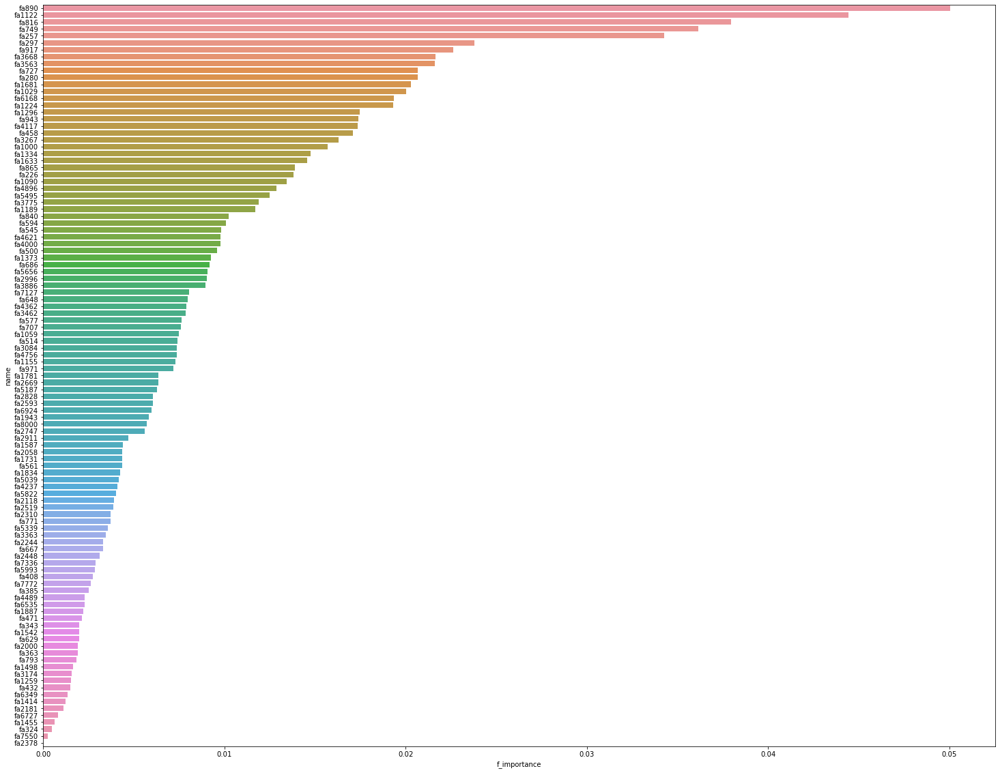

In [402]:
rfecv_mask = cv_selector_rf_1.get_support() #list of booleans
rfecv_feat_rf_1 = [] 
for bool, feature in zip(rfecv_mask, X_train1.columns):
    if bool:
        rfecv_feat_rf_1.append(feature)
        
print('Time: ',rfe_rf_time_1)
print('Optimal number of features :', cv_selector_rf_1.n_features_)
print('Best features :', rfecv_feat_rf_1)
n_features = X_train1.shape[1]

n1=np.arange(n_features)
v1=X_train1.columns.values
f1=cv_estimator.feature_importances_

rfecv_rf_1=pd.DataFrame({'idx':n1,'name':v1,'f_importance':f1})
rfecv_rf_1

plt.figure(figsize=(25,20))
sb.barplot(x='f_importance',
            y="name", 
            data=rfecv_rf_1, 
            order=rfecv_rf_1.sort_values('f_importance',ascending=False).name)

Optimal number of features : 9
Best features : ['fa226', 'fa280', 'fa749', 'fa816', 'fa1029', 'fa1090', 'fa2996', 'fa3668', 'fa5656']


<AxesSubplot:xlabel='f_importance', ylabel='name'>

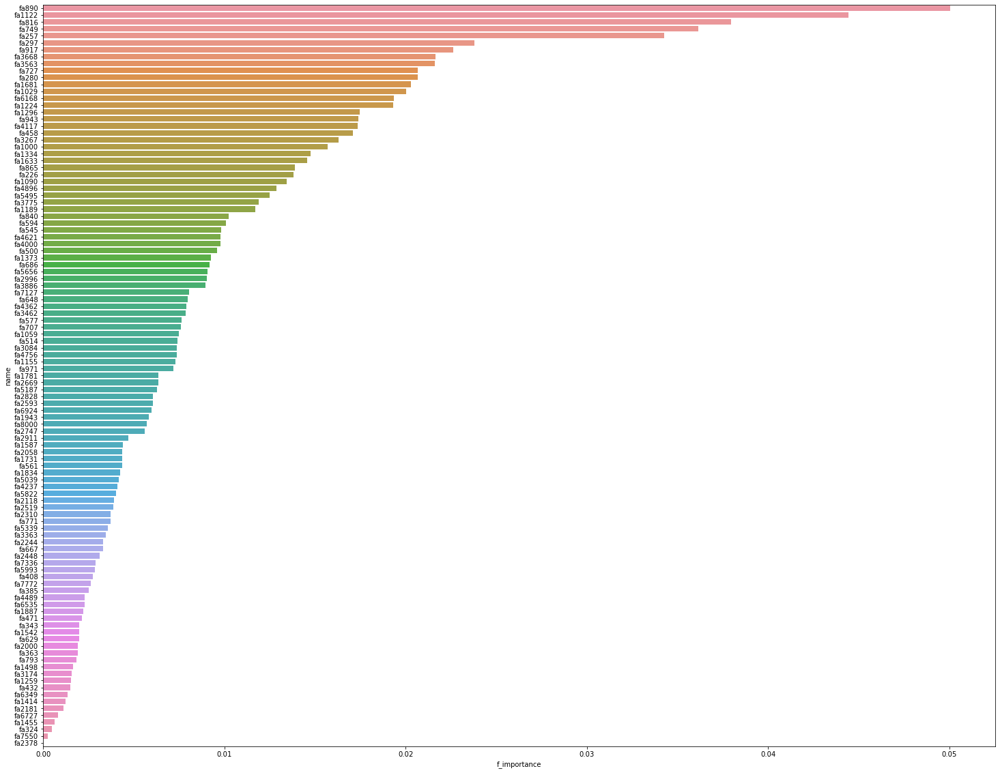

In [106]:
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
cv_estimator = RandomForestClassifier(random_state =12)

cv_estimator.fit(X_train1, y_train1)
cv_selector_rf_1 = RFECV(cv_estimator,cv= 5, step=1,scoring='accuracy')
cv_selector_rf_1 = cv_selector_rf_1.fit(X_train1, y_train1)
rfecv_mask = cv_selector_rf_1.get_support() #list of booleans
rfecv_feat_rf_1 = [] 
for bool, feature in zip(rfecv_mask, X_train1.columns):
    if bool:
        rfecv_feat_rf_1.append(feature)
print('Optimal number of features :', cv_selector_rf_1.n_features_)
print('Best features :', rfecv_feat_rf_1)
n_features = X_train1.shape[1]

n1=np.arange(n_features)
v1=X_train1.columns.values
f1=cv_estimator.feature_importances_

rfecv_rf_1=pd.DataFrame({'idx':n1,'name':v1,'f_importance':f1})
rfecv_rf_1

plt.figure(figsize=(25,20))
sb.barplot(x='f_importance',
            y="name", 
            data=rfecv_rf_1, 
            order=rfecv_rf_1.sort_values('f_importance',ascending=False).name)

##### 02 - SMOTE Results

In [403]:
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
start = timeit.default_timer()

cv_estimator = RandomForestClassifier(random_state =12)
cv_estimator.fit(X_train2, y_train2)
cv_selector_rf_2 = RFECV(cv_estimator,cv= 5, step=1,scoring='accuracy')
cv_selector_rf_2 = cv_selector_rf_2.fit(X_train2, y_train2)

stop = timeit.default_timer()
rfe_rf_time_2=stop-start

Time:  166.62265130000014
Optimal number of features : 22
Best features : ['fa727', 'fa943', 'fa971', 'fa1000', 'fa1029', 'fa1059', 'fa1090', 'fa1122', 'fa1155', 'fa1189', 'fa1296', 'fa1334', 'fa1633', 'fa1731', 'fa1781', 'fa1887', 'fa1943', 'fa2000', 'fa4000', 'fa4117', 'fa4237', 'fa4621']


<AxesSubplot:xlabel='f_importance', ylabel='name'>

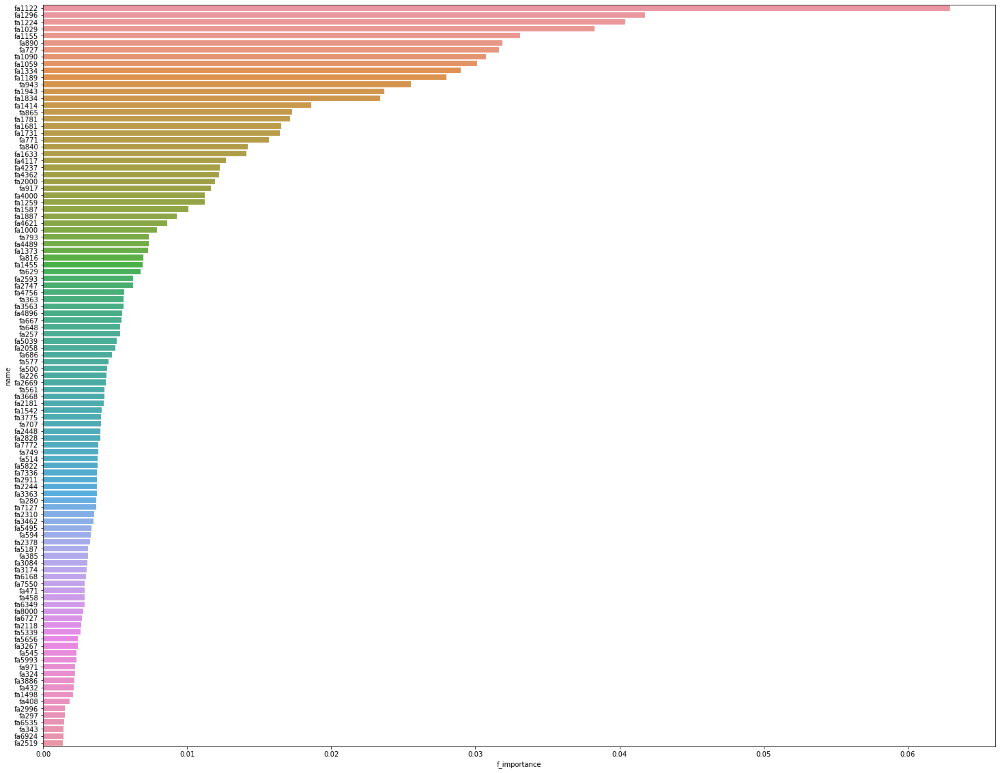

In [404]:
rfecv_mask = cv_selector_rf_2.get_support() #list of booleans
rfecv_feat_rf_2 = [] 
for bool, feature in zip(rfecv_mask, X_train2.columns):
    if bool:
        rfecv_feat_rf_2.append(feature)
        
print('Time: ',rfe_rf_time_2)
print('Optimal number of features :', cv_selector_rf_2.n_features_)
print('Best features :', rfecv_feat_rf_2)
n_features = X_train2.shape[1]

n2=np.arange(n_features)
v2=X_train2.columns.values
f2=cv_estimator.feature_importances_

rfecv_rf_2=pd.DataFrame({'idx':n2,'name':v2,'f_importance':f2})
rfecv_rf_2

plt.figure(figsize=(25,20))
sb.barplot(x='f_importance',
            y="name", 
            data=rfecv_rf_2, 
            order=rfecv_rf_2.sort_values('f_importance',ascending=False).name)

Optimal number of features : 22
Best features : ['fa727', 'fa943', 'fa971', 'fa1000', 'fa1029', 'fa1059', 'fa1090', 'fa1122', 'fa1155', 'fa1189', 'fa1296', 'fa1334', 'fa1633', 'fa1731', 'fa1781', 'fa1887', 'fa1943', 'fa2000', 'fa4000', 'fa4117', 'fa4237', 'fa4621']


<AxesSubplot:xlabel='f_importance', ylabel='name'>

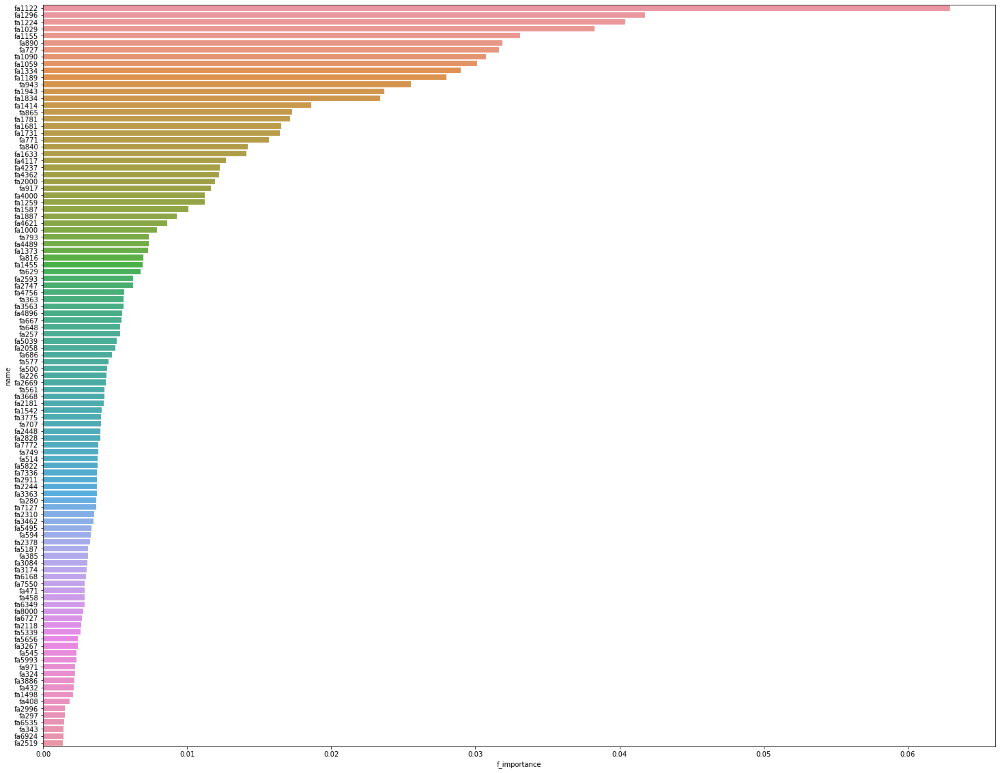

In [107]:
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
cv_estimator = RandomForestClassifier(random_state =12)

cv_estimator.fit(X_train2, y_train2)
cv_selector_rf_2 = RFECV(cv_estimator,cv= 5, step=1,scoring='accuracy')
cv_selector_rf_2 = cv_selector_rf_2.fit(X_train2, y_train2)
rfecv_mask = cv_selector_rf_2.get_support() #list of booleans
rfecv_feat_rf_2 = [] 
for bool, feature in zip(rfecv_mask, X_train2.columns):
    if bool:
        rfecv_feat_rf_2.append(feature)
print('Optimal number of features :', cv_selector_rf_2.n_features_)
print('Best features :', rfecv_feat_rf_2)
n_features = X_train2.shape[1]

n2=np.arange(n_features)
v2=X_train2.columns.values
f2=cv_estimator.feature_importances_

rfecv_rf_2=pd.DataFrame({'idx':n2,'name':v2,'f_importance':f2})
rfecv_rf_2

plt.figure(figsize=(25,20))
sb.barplot(x='f_importance',
            y="name", 
            data=rfecv_rf_2, 
            order=rfecv_rf_2.sort_values('f_importance',ascending=False).name)

##### 03 - SMOTEENN Results

In [405]:
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
start = timeit.default_timer()

cv_estimator = RandomForestClassifier(random_state =12)
cv_estimator.fit(X_train3, y_train3)
cv_selector_rf_3 = RFECV(cv_estimator,cv= 5, step=1,scoring='accuracy')
cv_selector_rf_3 = cv_selector_rf_3.fit(X_train3, y_train3)

stop = timeit.default_timer()
rfe_rf_time_3=stop-start

Time:  86.94319420000102
Optimal number of features : 68
Best features : ['fa226', 'fa280', 'fa343', 'fa408', 'fa432', 'fa458', 'fa514', 'fa629', 'fa648', 'fa686', 'fa727', 'fa749', 'fa771', 'fa840', 'fa865', 'fa917', 'fa943', 'fa971', 'fa1029', 'fa1059', 'fa1090', 'fa1122', 'fa1155', 'fa1189', 'fa1224', 'fa1259', 'fa1296', 'fa1334', 'fa1373', 'fa1414', 'fa1455', 'fa1498', 'fa1587', 'fa1633', 'fa1681', 'fa1731', 'fa1781', 'fa1834', 'fa1887', 'fa1943', 'fa2000', 'fa2058', 'fa2118', 'fa2181', 'fa2310', 'fa2378', 'fa2519', 'fa3174', 'fa3563', 'fa3668', 'fa3775', 'fa4000', 'fa4117', 'fa4237', 'fa4362', 'fa4489', 'fa4621', 'fa4756', 'fa4896', 'fa5039', 'fa5187', 'fa6168', 'fa6349', 'fa6727', 'fa6924', 'fa7127', 'fa7336', 'fa7772']


<AxesSubplot:xlabel='f_importance', ylabel='name'>

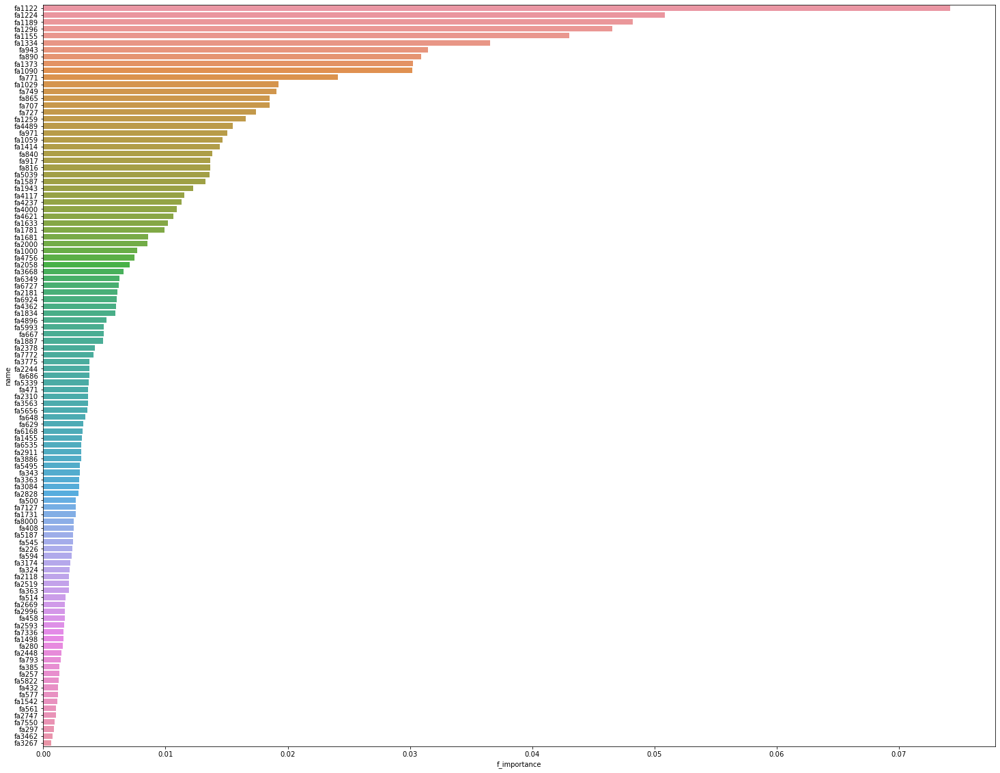

In [406]:
rfecv_mask = cv_selector_rf_3.get_support() #list of booleans
rfecv_feat_rf_3 = [] 
for bool, feature in zip(rfecv_mask, X_train3.columns):
    if bool:
        rfecv_feat_rf_3.append(feature)
        
print('Time: ',rfe_rf_time_3)
print('Optimal number of features :', cv_selector_rf_3.n_features_)
print('Best features :', rfecv_feat_rf_3)
n_features = X_train3.shape[1]

n3=np.arange(n_features)
v3=X_train3.columns.values
f3=cv_estimator.feature_importances_

rfecv_rf_3=pd.DataFrame({'idx':n3,'name':v3,'f_importance':f3})
rfecv_rf_3

plt.figure(figsize=(25,20))
sb.barplot(x='f_importance',
            y="name", 
            data=rfecv_rf_3, 
            order=rfecv_rf_3.sort_values('f_importance',ascending=False).name)

Optimal number of features : 68
Best features : ['fa226', 'fa280', 'fa343', 'fa408', 'fa432', 'fa458', 'fa514', 'fa629', 'fa648', 'fa686', 'fa727', 'fa749', 'fa771', 'fa840', 'fa865', 'fa917', 'fa943', 'fa971', 'fa1029', 'fa1059', 'fa1090', 'fa1122', 'fa1155', 'fa1189', 'fa1224', 'fa1259', 'fa1296', 'fa1334', 'fa1373', 'fa1414', 'fa1455', 'fa1498', 'fa1587', 'fa1633', 'fa1681', 'fa1731', 'fa1781', 'fa1834', 'fa1887', 'fa1943', 'fa2000', 'fa2058', 'fa2118', 'fa2181', 'fa2310', 'fa2378', 'fa2519', 'fa3174', 'fa3563', 'fa3668', 'fa3775', 'fa4000', 'fa4117', 'fa4237', 'fa4362', 'fa4489', 'fa4621', 'fa4756', 'fa4896', 'fa5039', 'fa5187', 'fa6168', 'fa6349', 'fa6727', 'fa6924', 'fa7127', 'fa7336', 'fa7772']


<AxesSubplot:xlabel='f_importance', ylabel='name'>

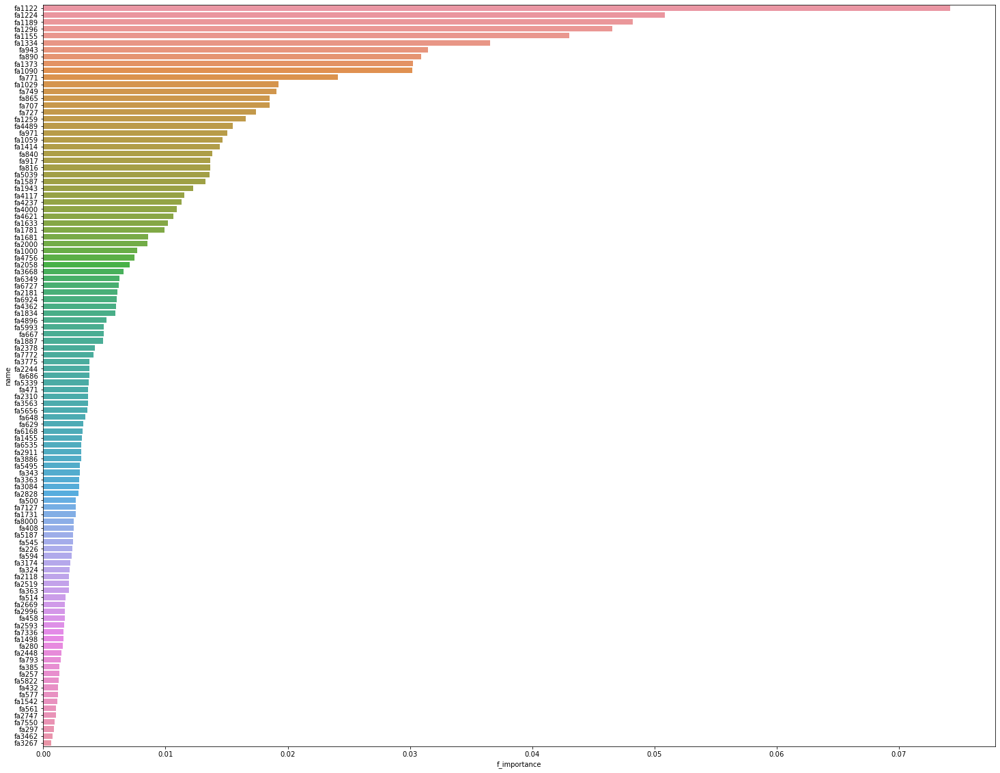

In [108]:
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
cv_estimator = RandomForestClassifier(random_state =12)

cv_estimator.fit(X_train3, y_train3)
cv_selector_rf_3 = RFECV(cv_estimator,cv= 5, step=1,scoring='accuracy')
cv_selector_rf_3 = cv_selector_rf_3.fit(X_train3, y_train3)
rfecv_mask = cv_selector_rf_3.get_support() #list of booleans
rfecv_feat_rf_3 = [] 
for bool, feature in zip(rfecv_mask, X_train3.columns):
    if bool:
        rfecv_feat_rf_3.append(feature)
print('Optimal number of features :', cv_selector_rf_3.n_features_)
print('Best features :', rfecv_feat_rf_3)
n_features = X_train3.shape[1]

n3=np.arange(n_features)
v3=X_train3.columns.values
f3=cv_estimator.feature_importances_

rfecv_rf_3=pd.DataFrame({'idx':n3,'name':v3,'f_importance':f3})
rfecv_rf_3

plt.figure(figsize=(25,20))
sb.barplot(x='f_importance',
            y="name", 
            data=rfecv_rf_3, 
            order=rfecv_rf_3.sort_values('f_importance',ascending=False).name)

##### 04 - SMOTETomek Results

In [407]:
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
start = timeit.default_timer()

cv_estimator = RandomForestClassifier(random_state =12)
cv_estimator.fit(X_train4, y_train4)
cv_selector_rf_4 = RFECV(cv_estimator,cv= 5, step=1,scoring='accuracy')
cv_selector_rf_4 = cv_selector_rf_4.fit(X_train4, y_train4)

stop = timeit.default_timer()
rfe_rf_time_4=stop-start

Time:  98.28606640000362
Optimal number of features : 61
Best features : ['fa226', 'fa257', 'fa343', 'fa385', 'fa432', 'fa471', 'fa561', 'fa594', 'fa629', 'fa648', 'fa667', 'fa686', 'fa727', 'fa749', 'fa771', 'fa865', 'fa890', 'fa917', 'fa971', 'fa1000', 'fa1029', 'fa1059', 'fa1090', 'fa1122', 'fa1155', 'fa1189', 'fa1224', 'fa1259', 'fa1296', 'fa1334', 'fa1373', 'fa1455', 'fa1498', 'fa1681', 'fa1731', 'fa1781', 'fa1834', 'fa1887', 'fa1943', 'fa2000', 'fa2058', 'fa2181', 'fa2244', 'fa2747', 'fa2996', 'fa3363', 'fa3462', 'fa3563', 'fa3668', 'fa3775', 'fa3886', 'fa4000', 'fa4117', 'fa4237', 'fa4362', 'fa4489', 'fa4621', 'fa4756', 'fa4896', 'fa5039', 'fa5187']


<AxesSubplot:xlabel='f_importance', ylabel='name'>

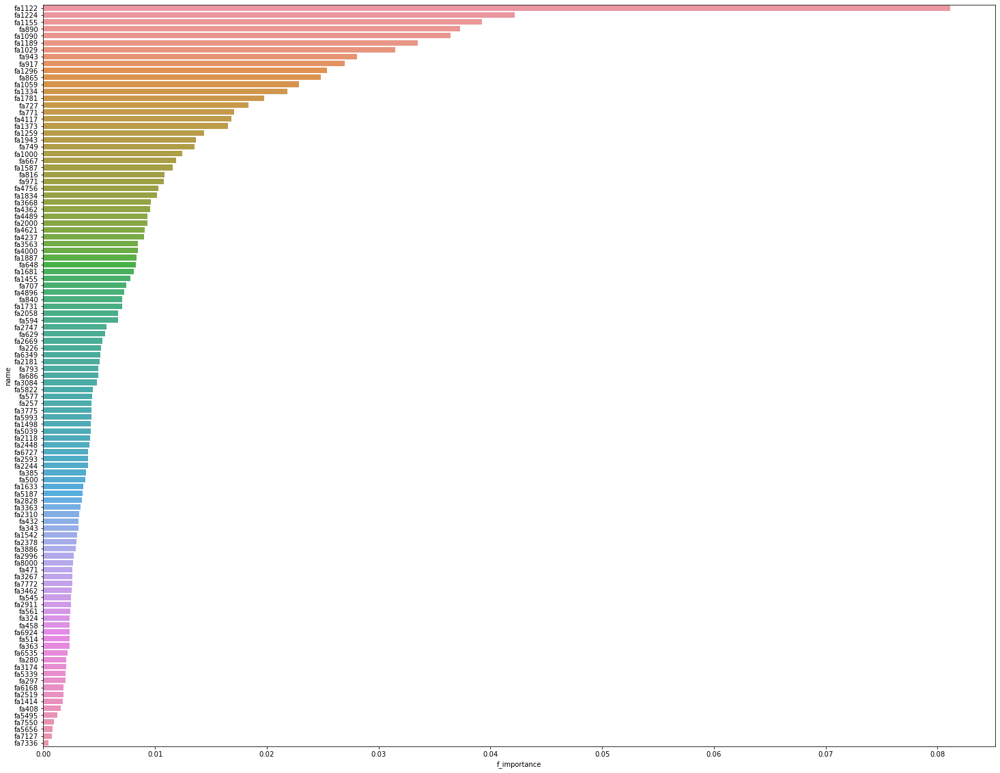

In [408]:
rfecv_mask = cv_selector_rf_4.get_support() #list of booleans
rfecv_feat_rf_4 = [] 
for bool, feature in zip(rfecv_mask, X_train4.columns):
    if bool:
        rfecv_feat_rf_4.append(feature)
        
print('Time: ',rfe_rf_time_4)
print('Optimal number of features :', cv_selector_rf_4.n_features_)
print('Best features :', rfecv_feat_rf_4)
n_features = X_train4.shape[1]

n4=np.arange(n_features)
v4=X_train4.columns.values
f4=cv_estimator.feature_importances_

rfecv_rf_4=pd.DataFrame({'idx':n4,'name':v4,'f_importance':f4})
rfecv_rf_4

plt.figure(figsize=(25,20))
sb.barplot(x='f_importance',
            y="name", 
            data=rfecv_rf_4, 
            order=rfecv_rf_4.sort_values('f_importance',ascending=False).name)

Optimal number of features : 37
Best features : ['fa226', 'fa667', 'fa686', 'fa727', 'fa749', 'fa890', 'fa917', 'fa971', 'fa1000', 'fa1029', 'fa1059', 'fa1090', 'fa1122', 'fa1155', 'fa1189', 'fa1224', 'fa1259', 'fa1296', 'fa1334', 'fa1373', 'fa1455', 'fa1834', 'fa1887', 'fa1943', 'fa2000', 'fa2181', 'fa3563', 'fa3668', 'fa3775', 'fa4000', 'fa4117', 'fa4237', 'fa4362', 'fa4489', 'fa4621', 'fa4756', 'fa5039']


<AxesSubplot:xlabel='f_importance', ylabel='name'>

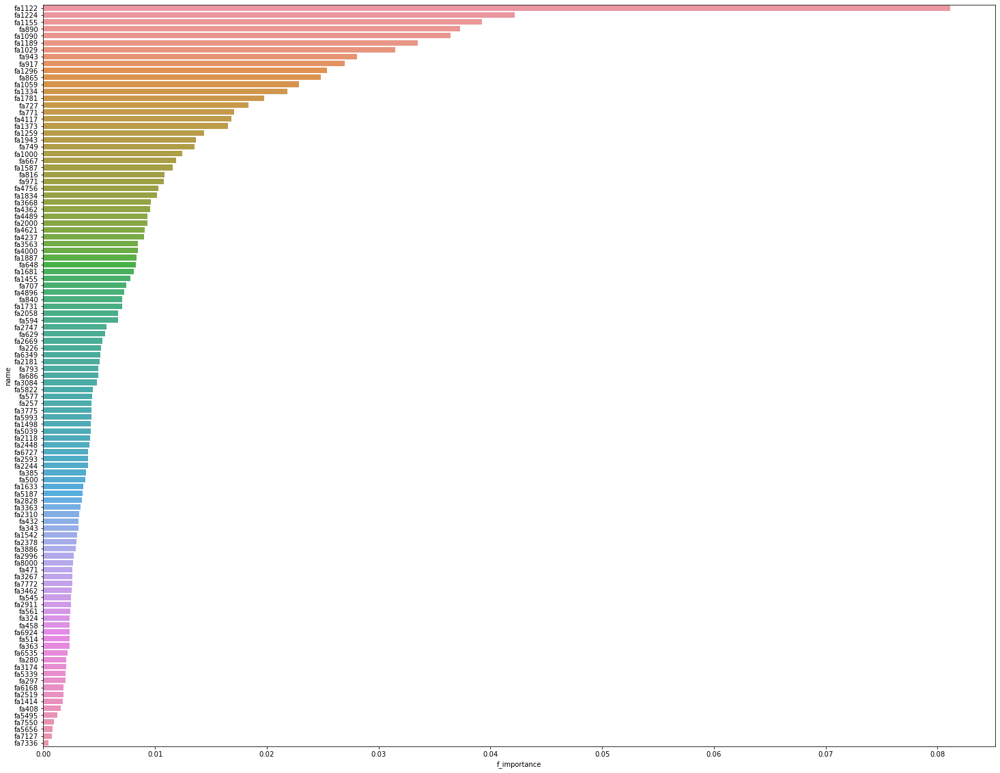

In [109]:
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
cv_estimator = RandomForestClassifier(random_state =12)

cv_estimator.fit(X_train4, y_train4)
cv_selector_rf_4 = RFECV(cv_estimator,cv= 3, step=1,scoring='accuracy')
cv_selector_rf_4 = cv_selector_rf_4.fit(X_train4, y_train4)
rfecv_mask = cv_selector_rf_4.get_support() #list of booleans
rfecv_feat_rf_4 = [] 
for bool, feature in zip(rfecv_mask, X_train4.columns):
    if bool:
        rfecv_feat_rf_4.append(feature)
print('Optimal number of features :', cv_selector_rf_4.n_features_)
print('Best features :', rfecv_feat_rf_4)
n_features = X_train4.shape[1]

n4=np.arange(n_features)
v4=X_train4.columns.values
f4=cv_estimator.feature_importances_

rfecv_rf_4=pd.DataFrame({'idx':n4,'name':v4,'f_importance':f4})
rfecv_rf_4

plt.figure(figsize=(25,20))
sb.barplot(x='f_importance',
            y="name", 
            data=rfecv_rf_4, 
            order=rfecv_rf_4.sort_values('f_importance',ascending=False).name)

#### 03 - Sequential Feature Selection

##### Selection of K

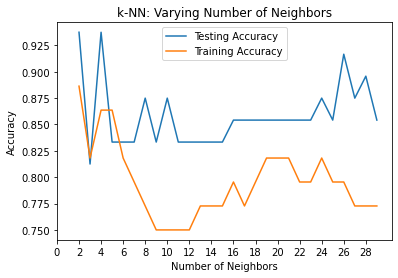

In [320]:
import matplotlib.pyplot as plt

# Setup arrays to store train and test accuracies
neighbors = np.arange(2, 30)
train_accuracy = np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))

# Loop over different values of k
for i, k in enumerate(neighbors):
    # Setup a k-NN Classifier with k neighbors: knn
    knn = KNeighborsClassifier(n_neighbors=k)

    # Fit the classifier to the training data
    knn.fit(scaler.fit_transform(X_train1), y_train1)
    
    #Compute accuracy on the training set
    train_accuracy[i] = knn.score(scaler.fit_transform(X_train1), y_train1)

    #Compute accuracy on the testing set
    test_accuracy[i] = knn.score(scaler.transform(X_test1), y_test1)

# Generate plot
plt.title('k-NN: Varying Number of Neighbors')
plt.plot(neighbors, test_accuracy, label = 'Testing Accuracy')
plt.plot(neighbors, train_accuracy, label = 'Training Accuracy')
plt.xticks(np.arange(0, len(neighbors)+1, 2))
plt.legend()
plt.xlabel('Number of Neighbors')
plt.ylabel('Accuracy')
plt.show()

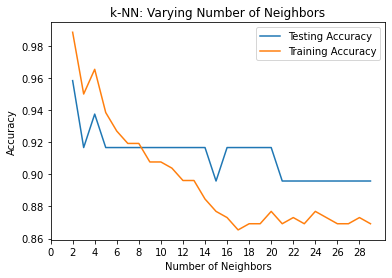

In [319]:
import matplotlib.pyplot as plt

# Setup arrays to store train and test accuracies
neighbors = np.arange(2, 30)
train_accuracy = np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))

# Loop over different values of k
for i, k in enumerate(neighbors):
    # Setup a k-NN Classifier with k neighbors: knn
    knn = KNeighborsClassifier(n_neighbors=k)

    # Fit the classifier to the training data
    knn.fit(scaler.fit_transform(X_train2), y_train2)
    
    #Compute accuracy on the training set
    train_accuracy[i] = knn.score(scaler.fit_transform(X_train2), y_train2)

    #Compute accuracy on the testing set
    test_accuracy[i] = knn.score(scaler.transform(X_test2), y_test2)

# Generate plot
plt.title('k-NN: Varying Number of Neighbors')
plt.plot(neighbors, test_accuracy, label = 'Testing Accuracy')
plt.plot(neighbors, train_accuracy, label = 'Training Accuracy')
plt.xticks(np.arange(0, len(neighbors)+1, 2))
plt.legend()
plt.xlabel('Number of Neighbors')
plt.ylabel('Accuracy')
plt.show()

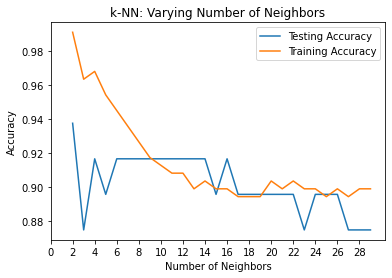

In [312]:
import matplotlib.pyplot as plt

# Setup arrays to store train and test accuracies
neighbors = np.arange(2, 30)
train_accuracy = np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))

# Loop over different values of k
for i, k in enumerate(neighbors):
    # Setup a k-NN Classifier with k neighbors: knn
    knn = KNeighborsClassifier(n_neighbors=k)

    # Fit the classifier to the training data
    knn.fit(scaler.fit_transform(X_train3), y_train3)
    
    #Compute accuracy on the training set
    train_accuracy[i] = knn.score(scaler.fit_transform(X_train3), y_train3)

    #Compute accuracy on the testing set
    test_accuracy[i] = knn.score(scaler.transform(X_test3), y_test3)

# Generate plot
plt.title('k-NN: Varying Number of Neighbors')
plt.plot(neighbors, test_accuracy, label = 'Testing Accuracy')
plt.plot(neighbors, train_accuracy, label = 'Training Accuracy')
plt.xticks(np.arange(0, len(neighbors)+1, 2))
plt.legend()
plt.xlabel('Number of Neighbors')
plt.ylabel('Accuracy')
plt.show()

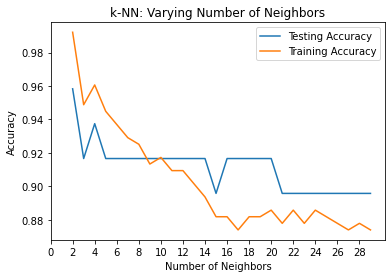

In [311]:
import matplotlib.pyplot as plt

# Setup arrays to store train and test accuracies
neighbors = np.arange(2, 30)
train_accuracy = np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))

# Loop over different values of k
for i, k in enumerate(neighbors):
    # Setup a k-NN Classifier with k neighbors: knn
    knn = KNeighborsClassifier(n_neighbors=k)

    # Fit the classifier to the training data
    knn.fit(scaler.fit_transform(X_train4), y_train4)
    
    #Compute accuracy on the training set
    train_accuracy[i] = knn.score(scaler.fit_transform(X_train4), y_train4)

    #Compute accuracy on the testing set
    test_accuracy[i] = knn.score(scaler.transform(X_test4), y_test4)

# Generate plot
plt.title('k-NN: Varying Number of Neighbors')
plt.plot(neighbors, test_accuracy, label = 'Testing Accuracy')
plt.plot(neighbors, train_accuracy, label = 'Training Accuracy')
plt.xticks(np.arange(0, len(neighbors)+1, 2))
plt.legend()
plt.xlabel('Number of Neighbors')
plt.ylabel('Accuracy')
plt.show()

##### 00 - Original Results

In [820]:
from sklearn.neighbors import KNeighborsClassifier
from mlxtend.feature_selection import SequentialFeatureSelector as sfs
from sklearn.preprocessing import StandardScaler

scaler=StandardScaler()
X_train0_scale=scaler.fit_transform(X_train0)
X = pd.DataFrame(X_train0_scale,columns=X_train0.columns)
y = y_train0
knn = KNeighborsClassifier(n_neighbors=2)


# Sequential Forward Selection
start = timeit.default_timer()
sfs0 = sfs(knn, 
          k_features=50, 
          forward=True, 
          floating=False, 
          scoring='accuracy',
          cv=3,
          n_jobs=-1)
sfs0 = sfs0.fit(X, y)
stop = timeit.default_timer()
sfs_time_0=stop-start

print("Time: ", sfs_time_0)
print('\nSequential Forward Selection (k=3):')
print(sfs0.k_feature_idx_)
print('CV Score:')
print(sfs0.k_score_)

###################################################

# Sequential Backward Selection
start = timeit.default_timer()
sbs0 = sfs(knn, 
          k_features=5, 
          forward=False, 
          floating=False, 
          scoring='accuracy',
          cv=3,
          n_jobs=-1)
sbs0 = sbs0.fit(X, y)
stop = timeit.default_timer()
sbs_time_0=stop-start

print("Time: ", sbs_time_0)
print('\nSequential Backward Selection (k=3):')
print(sbs0.k_feature_idx_)
print('CV Score:')
print(sbs0.k_score_)

###################################################


Time:  108.95034849998774

Sequential Forward Selection (k=3):
(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 24, 25, 27, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 66, 68, 70, 71, 72, 73, 79, 99, 100, 101, 102, 103, 104, 105, 106)
CV Score:
0.9406535947712418
Time:  152.0728991000069

Sequential Backward Selection (k=3):
(6, 7, 19, 48, 78)
CV Score:
0.9142483660130719


In [836]:
sfs_score_0=pd.DataFrame.from_dict(sfs0.get_metric_dict()).T.avg_score
max_sfs_score_0 =max(sfs_score_0)
max_sfs_score_0
max_sfs_index_0 = min(sfs_score_0.index[sfs_score_0.values==max_sfs_score_0])
max_sfs_index_0

22

In [837]:
sfs_feat_0=[sfs0.feature_names[i] for i in np.asarray(sfs0.k_feature_idx_[0:max_sfs_index_0+1])]
sfs_feat_0

['fa226',
 'fa257',
 'fa280',
 'fa297',
 'fa324',
 'fa343',
 'fa363',
 'fa385',
 'fa408',
 'fa432',
 'fa458',
 'fa749',
 'fa771',
 'fa816',
 'fa865',
 'fa890',
 'fa917',
 'fa943',
 'fa971',
 'fa1000',
 'fa1029',
 'fa1059',
 'fa1090']

In [830]:
# pd.DataFrame.from_dict(sfs1.get_metric_dict()).T

In [831]:
# pd.DataFrame.from_dict(sbs1.get_metric_dict()).T

In [838]:
sbs_score_0=pd.DataFrame.from_dict(sbs0.get_metric_dict()).T.avg_score
max_sbs_score_0 =max(sbs_score_0)
max_sbs_score_0
max_sbs_index_0 = min(sbs_score_0.index[sbs_score_0.values==max_sbs_score_0])
max_sbs_index_0

9

In [839]:
sbs_feat_0=np.array(pd.DataFrame.from_dict(sbs0.get_metric_dict()).T.iloc[len(sbs0.feature_names)-max_sbs_index_0].feature_names)
sbs_feat_0

array(['fa257', 'fa343', 'fa363', 'fa385', 'fa408', 'fa648', 'fa1498',
       'fa2000', 'fa3563'], dtype='<U6')

In [840]:
## With top 5 features
sbs_feat_0=[sbs0.feature_names[i] for i in np.asarray(sbs0.k_feature_idx_)]
sbs_feat_0

['fa363', 'fa385', 'fa648', 'fa1498', 'fa3563']

In [841]:
sbs0.k_score_

0.9142483660130719

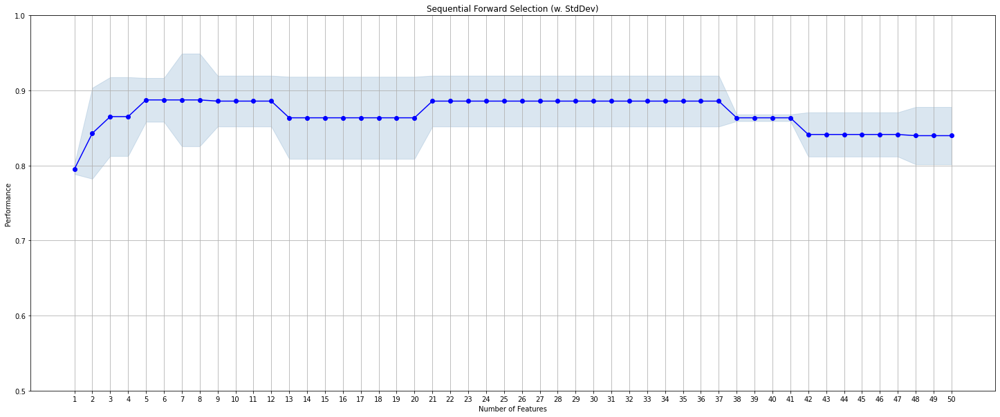

In [845]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
import matplotlib.pyplot as plt
fig1 = plot_sfs(sfs1.get_metric_dict(), kind='std_dev',figsize=(25,10))

plt.ylim([0.5, 1])
plt.title('Sequential Forward Selection (w. StdDev)')
plt.grid()
plt.show()

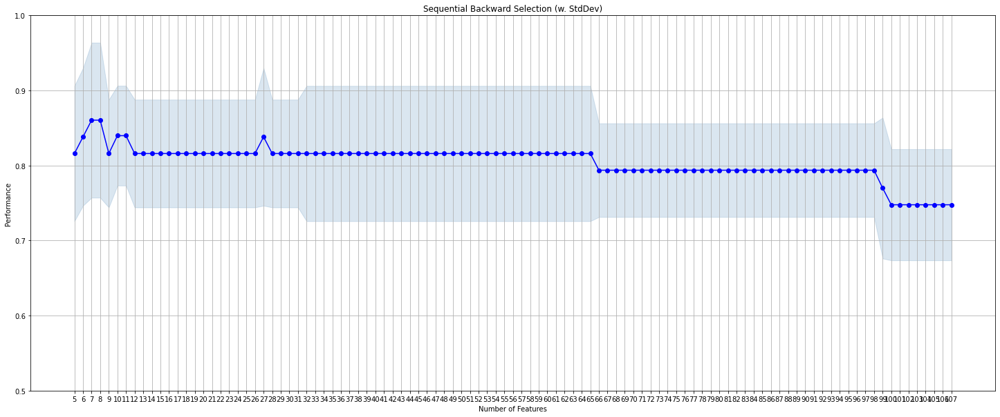

In [844]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
import matplotlib.pyplot as plt


# fig1=plt.figure(figsize=(20,8), dpi= 100, facecolor='w', edgecolor='k')
plot_sfs(sbs1.get_metric_dict(), kind='std_dev',figsize=(25,10))

plt.ylim([0.5, 1])
plt.title('Sequential Backward Selection (w. StdDev)')
plt.grid()
plt.show()


##### 01 - Nearmiss Results

In [438]:
from sklearn.neighbors import KNeighborsClassifier
from mlxtend.feature_selection import SequentialFeatureSelector as sfs
from sklearn.preprocessing import StandardScaler

scaler=StandardScaler()
X_train1_scale=scaler.fit_transform(X_train1)
X = pd.DataFrame(X_train1_scale,columns=X_train1.columns)
y = y_train1
knn = KNeighborsClassifier(n_neighbors=2)


# Sequential Forward Selection
start = timeit.default_timer()
sfs1 = sfs(knn, 
          k_features=50, 
          forward=True, 
          floating=False, 
          scoring='accuracy',
          cv=3,
          n_jobs=-1)
sfs1 = sfs1.fit(X, y)
stop = timeit.default_timer()
sfs_time_1=stop-start

print("Time: ", sfs_time_1)
print('\nSequential Forward Selection (k=3):')
print(sfs1.k_feature_idx_)
print('CV Score:')
print(sfs1.k_score_)

###################################################

# Sequential Backward Selection
start = timeit.default_timer()
sbs1 = sfs(knn, 
          k_features=5, 
          forward=False, 
          floating=False, 
          scoring='accuracy',
          cv=3,
          n_jobs=-1)
sbs1 = sbs1.fit(X, y)
stop = timeit.default_timer()
sbs_time_1=stop-start

print("Time: ", sbs_time_1)
print('\nSequential Backward Selection (k=3):')
print(sbs1.k_feature_idx_)
print('CV Score:')
print(sbs1.k_score_)

###################################################


Time:  115.06259020000289

Sequential Forward Selection (k=3):
(0, 4, 5, 6, 7, 8, 11, 13, 14, 15, 16, 18, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 67, 72, 78, 100, 103, 106)
CV Score:
0.8396825396825397
Time:  162.4613795000041

Sequential Backward Selection (k=3):
(0, 35, 39, 44, 77)
CV Score:
0.815873015873016


In [828]:
sfs_score_1=pd.DataFrame.from_dict(sfs1.get_metric_dict()).T.avg_score
max_sfs_score_1 =max(sfs_score_1)
max_sfs_score_1
max_sfs_index_1 = min(sfs_score_1.index[sfs_score_1.values==max_sfs_score_1])
max_sfs_index_1

5

In [829]:
sfs_feat_1=[sfs1.feature_names[i] for i in np.asarray(sfs1.k_feature_idx_[0:max_sfs_index_1])]
sfs_feat_1

['fa226', 'fa324', 'fa343', 'fa363', 'fa385']

In [830]:
# pd.DataFrame.from_dict(sfs1.get_metric_dict()).T

In [831]:
# pd.DataFrame.from_dict(sbs1.get_metric_dict()).T

In [832]:
sbs_score_1=pd.DataFrame.from_dict(sbs1.get_metric_dict()).T.avg_score
max_sbs_score_1 =max(sbs_score_1)
max_sbs_score_1
max_sbs_index_1 = min(sbs_score_1.index[sbs_score_1.values==max_sbs_score_1])
max_sbs_index_1

7

In [833]:
sbs_feat_1=np.array(pd.DataFrame.from_dict(sbs1.get_metric_dict()).T.iloc[len(sbs1.feature_names)-max_sbs_index_1].feature_names)
sbs_feat_1

array(['fa226', 'fa1029', 'fa1155', 'fa1189', 'fa1334', 'fa1373',
       'fa3462'], dtype='<U6')

In [834]:
## With top 5 features
sbs_feat_1=[sbs1.feature_names[i] for i in np.asarray(sbs1.k_feature_idx_)]
sbs_feat_1

['fa226', 'fa1029', 'fa1155', 'fa1334', 'fa3462']

In [835]:
sbs1.k_score_

0.815873015873016

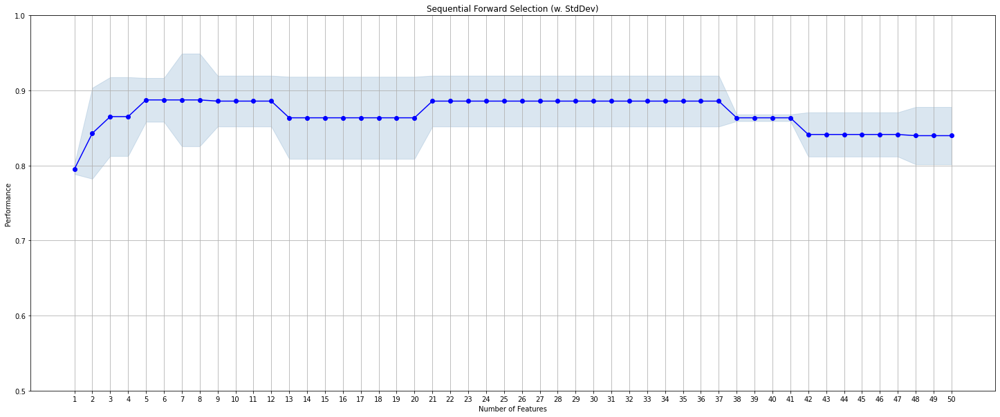

In [846]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
import matplotlib.pyplot as plt
fig1 = plot_sfs(sfs1.get_metric_dict(), kind='std_dev',figsize=(25,10))

plt.ylim([0.5, 1])
plt.title('Sequential Forward Selection (w. StdDev)')
plt.grid()
plt.show()

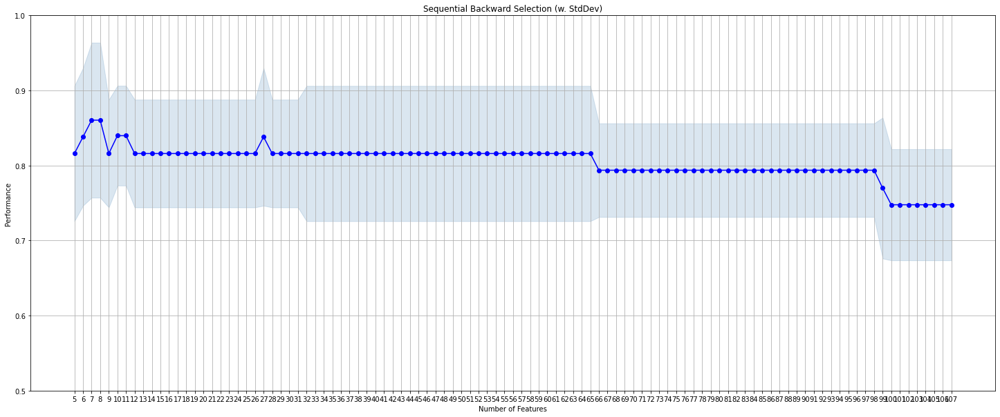

In [487]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
import matplotlib.pyplot as plt


# fig1=plt.figure(figsize=(20,8), dpi= 100, facecolor='w', edgecolor='k')
plot_sfs(sbs1.get_metric_dict(), kind='std_dev',figsize=(25,10))

plt.ylim([0.5, 1])
plt.title('Sequential Backward Selection (w. StdDev)')
plt.grid()
plt.show()


##### 02 - SMOTE Results

In [439]:
from sklearn.neighbors import KNeighborsClassifier
from mlxtend.feature_selection import SequentialFeatureSelector as sfs

scaler=StandardScaler()
X_train2_scale=scaler.fit_transform(X_train2)
X = pd.DataFrame(X_train2_scale,columns=X_train2.columns)
y = y_train2
knn = KNeighborsClassifier(n_neighbors=2)


# Sequential Forward Selection
start = timeit.default_timer()
sfs2 = sfs(knn, 
          k_features=50, 
          forward=True, 
          floating=False, 
          scoring='accuracy',
          cv=3,
          n_jobs=-1)
sfs2 = sfs2.fit(X, y)
stop = timeit.default_timer()
sfs_time_2=stop-start

print("Time: ", sfs_time_2)
print('\nSequential Forward Selection (k=3):')
print(sfs2.k_feature_idx_)
print('CV Score:')
print(sfs2.k_score_)

###################################################

# Sequential Backward Selection
start = timeit.default_timer()
sbs2 = sfs(knn, 
          k_features=5, 
          forward=False, 
          floating=False, 
          scoring='accuracy',
          cv=3,
          n_jobs=-1)
sbs2 = sbs2.fit(X, y)
stop = timeit.default_timer()
sbs_time_2=stop-start

print("Time: ", sbs_time_2)
print('\nSequential Backward Selection (k=3):')
print(sbs2.k_feature_idx_)
print('CV Score:')
print(sbs2.k_score_)

###################################################


Time:  148.38595440000063

Sequential Forward Selection (k=3):
(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 22, 24, 26, 31, 32, 34, 35, 36, 37, 38, 39, 43, 44, 45, 46, 55, 56, 57, 58, 60, 61, 62, 64, 69, 70, 71, 72, 76, 77, 79, 80, 81, 82, 87)
CV Score:
0.9577653033948142
Time:  179.41846559999976

Sequential Backward Selection (k=3):
(8, 37, 43, 73, 85)
CV Score:
0.9269357569277377


In [488]:
pd.DataFrame.from_dict(sfs2.get_metric_dict()).T

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
1,"(39,)","[0.8160919540229885, 0.8390804597701149, 0.848...",0.83467,"(fa1155,)",0.030891,0.013727,0.009707
2,"(39, 61)","[0.8735632183908046, 0.9080459770114943, 0.918...",0.900071,"(fa1155, fa2181)",0.043281,0.019233,0.0136
3,"(39, 61, 82)","[0.9425287356321839, 0.8850574712643678, 0.930...",0.919273,"(fa1155, fa2181, fa4000)",0.055604,0.024709,0.017472
4,"(0, 39, 61, 82)","[0.9425287356321839, 0.9080459770114943, 0.953...",0.934688,"(fa226, fa1155, fa2181, fa4000)",0.043572,0.019363,0.013691
5,"(0, 39, 61, 79, 82)","[0.9540229885057471, 0.9080459770114943, 0.976...",0.946271,"(fa226, fa1155, fa2181, fa3668, fa4000)",0.064307,0.028577,0.020207
6,"(0, 39, 61, 77, 79, 82)","[0.9425287356321839, 0.9195402298850575, 0.976...",0.946271,"(fa226, fa1155, fa2181, fa3462, fa3668, fa4000)",0.052889,0.023503,0.016619
7,"(0, 39, 61, 69, 77, 79, 82)","[0.9540229885057471, 0.9310344827586207, 0.976...",0.953934,"(fa226, fa1155, fa2181, fa2747, fa3462, fa3668...",0.041993,0.018661,0.013195
8,"(0, 39, 57, 61, 69, 77, 79, 82)","[0.9770114942528736, 0.9310344827586207, 0.965...",0.957721,"(fa226, fa1155, fa1943, fa2181, fa2747, fa3462...",0.043847,0.019485,0.013778
9,"(0, 39, 57, 61, 69, 77, 79, 81, 82)","[0.9770114942528736, 0.9195402298850575, 0.976...",0.957765,"(fa226, fa1155, fa1943, fa2181, fa2747, fa3462...",0.060825,0.027029,0.019113
10,"(0, 37, 39, 57, 61, 69, 77, 79, 81, 82)","[0.9770114942528736, 0.9425287356321839, 0.965...",0.961552,"(fa226, fa1090, fa1155, fa1943, fa2181, fa2747...",0.032183,0.014301,0.010113


In [489]:
pd.DataFrame.from_dict(sbs2.get_metric_dict()).T

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
107,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.9195402298850575, 0.9310344827586207, 0.941...",0.930812,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.020509,0.009114,0.006444
106,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.9195402298850575, 0.9310344827586207, 0.941...",0.930812,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.020509,0.009114,0.006444
105,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.9195402298850575, 0.9310344827586207, 0.941...",0.930812,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.020509,0.009114,0.006444
104,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.9195402298850575, 0.9310344827586207, 0.941...",0.930812,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.020509,0.009114,0.006444
103,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.9195402298850575, 0.9310344827586207, 0.953...",0.934688,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.031725,0.014098,0.009969
...,...,...,...,...,...,...,...
9,"(0, 8, 13, 17, 37, 43, 64, 73, 85)","[0.9425287356321839, 0.9540229885057471, 0.953...",0.950013,"(fa226, fa408, fa514, fa594, fa1090, fa1296, f...",0.01192,0.005297,0.003745
8,"(0, 8, 13, 37, 43, 64, 73, 85)","[0.9425287356321839, 0.9425287356321839, 0.953...",0.946182,"(fa226, fa408, fa514, fa1090, fa1296, fa2378, ...",0.011626,0.005166,0.003653
7,"(0, 8, 37, 43, 64, 73, 85)","[0.9310344827586207, 0.9540229885057471, 0.941...",0.942306,"(fa226, fa408, fa1090, fa1296, fa2378, fa3084,...",0.021131,0.00939,0.00664
6,"(0, 8, 37, 43, 73, 85)","[0.9310344827586207, 0.9540229885057471, 0.941...",0.942306,"(fa226, fa408, fa1090, fa1296, fa3084, fa4362)",0.021131,0.00939,0.00664


In [821]:
sfs_score_2=pd.DataFrame.from_dict(sfs2.get_metric_dict()).T.avg_score
max_sfs_score_2 =max(sfs_score_2)
max_sfs_score_2
max_sfs_index_2 = min(sfs_score_2.index[sfs_score_2.values==max_sfs_score_2])
max_sfs_index_2

11

In [822]:
sfs_feat_2=[sfs2.feature_names[i] for i in np.asarray(sfs2.k_feature_idx_[0:max_sfs_index_2+1])]
sfs_feat_2

['fa226',
 'fa257',
 'fa280',
 'fa297',
 'fa324',
 'fa343',
 'fa363',
 'fa385',
 'fa408',
 'fa432',
 'fa458',
 'fa471']

In [823]:
sbs_score_2=pd.DataFrame.from_dict(sbs2.get_metric_dict()).T.avg_score
max_sbs_score_2 =max(sbs_score_2)
max_sbs_score_2
max_sbs_index_2 = min(sbs_score_2.index[sbs_score_2.values==max_sbs_score_2])
max_sbs_index_2

31

In [825]:
sbs_feat_2=np.array(pd.DataFrame.from_dict(sbs2.get_metric_dict()).T.iloc[len(sbs2.feature_names)-max_sbs_index_2].feature_names)
sbs_feat_2

array(['fa226', 'fa257', 'fa280', 'fa297', 'fa324', 'fa343', 'fa385',
       'fa408', 'fa432', 'fa458', 'fa500', 'fa514', 'fa577', 'fa594',
       'fa629', 'fa1059', 'fa1090', 'fa1122', 'fa1224', 'fa1259',
       'fa1296', 'fa1334', 'fa1834', 'fa1887', 'fa2310', 'fa2378',
       'fa2669', 'fa3084', 'fa3174', 'fa4000', 'fa4362'], dtype='<U6')

In [493]:
## With top 5 features
sbs_feat_2=[sbs2.feature_names[i] for i in np.asarray(sbs2.k_feature_idx_)]
sbs_feat_2

['fa408', 'fa1090', 'fa1296', 'fa3084', 'fa4362']

In [494]:
sbs2.k_score_

0.9269357569277377

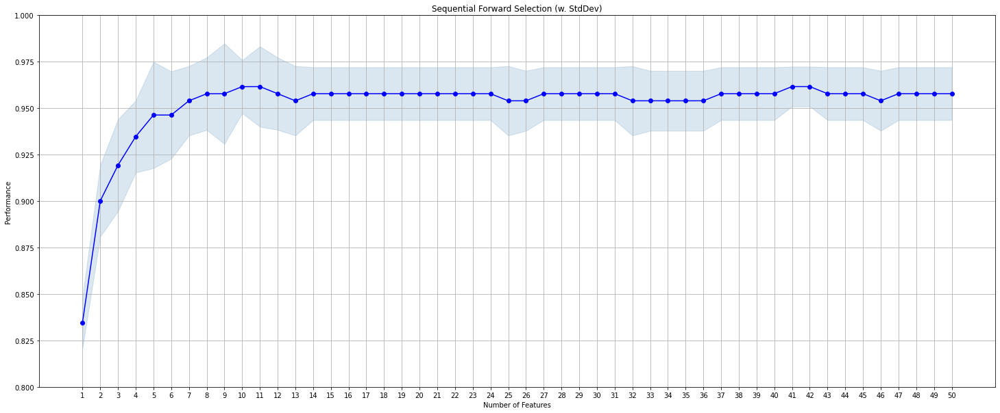

In [848]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
import matplotlib.pyplot as plt
fig1 = plot_sfs(sfs2.get_metric_dict(), kind='std_dev',figsize=(25,10))

plt.ylim([0.8, 1])
plt.title('Sequential Forward Selection (w. StdDev)')
plt.grid()
plt.show()

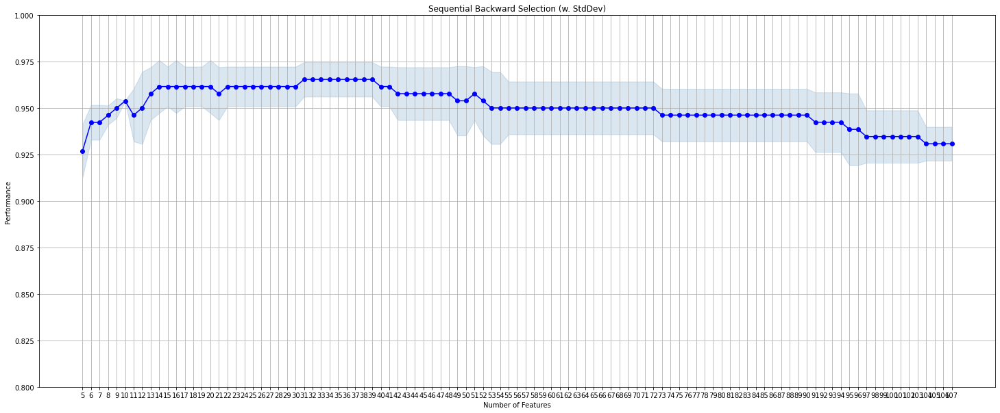

In [849]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
import matplotlib.pyplot as plt


# fig1=plt.figure(figsize=(20,8), dpi= 100, facecolor='w', edgecolor='k')
plot_sfs(sbs2.get_metric_dict(), kind='std_dev',figsize=(25,10))

plt.ylim([0.8, 1])
plt.title('Sequential Backward Selection (w. StdDev)')
plt.grid()
plt.show()


##### 03 - SMOTEENN Results

In [124]:
from sklearn.neighbors import KNeighborsClassifier
from mlxtend.feature_selection import SequentialFeatureSelector as sfs

scaler=StandardScaler()
X_train3_scale=scaler.fit_transform(X_train3)
X = pd.DataFrame(X_train3_scale,columns=X_train3.columns)
y = y_train3
knn = KNeighborsClassifier(n_neighbors=2)


# Sequential Forward Selection
start = timeit.default_timer()
sfs3 = sfs(knn, 
          k_features=50, 
          forward=True, 
          floating=False, 
          scoring='accuracy',
          cv=3,
          n_jobs=-1)
sfs3 = sfs3.fit(X, y)
stop = timeit.default_timer()
sfs_time_3=stop-start

print("Time: ", sfs_time_3)
print('\nSequential Forward Selection (k=3):')
print(sfs3.k_feature_idx_)
print('CV Score:')
print(sfs3.k_score_)

# ###################################################

# Sequential Backward Selection
start = timeit.default_timer()
sbs3 = sfs(knn, 
          k_features=5, 
          forward=False, 
          floating=False, 
          scoring='accuracy',
          cv=3,
          n_jobs=-1)
sbs3 = sbs3.fit(X, y)
stop = timeit.default_timer()
sbs_time_3=stop-start

print("Time: ", sbs_time_3)
print('\nSequential Backward Selection (k=3):')
print(sbs3.k_feature_idx_)
print('CV Score:')
print(sbs3.k_score_)

###################################################



Sequential Forward Selection (k=3):
(0, 1, 2, 3, 4, 6, 12, 13, 14, 29, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 56, 57, 58, 59, 68, 69, 70, 71, 72, 73, 74, 75, 77, 79, 80, 81, 82, 83, 84, 85, 94, 97, 98, 99, 100, 104)
CV Score:
0.9771055301877221

Sequential Backward Selection (k=3):
(9, 56, 71, 85, 98)
CV Score:
0.954211060375444


In [498]:
pd.DataFrame.from_dict(sfs3.get_metric_dict()).T

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
1,"(44,)","[0.8904109589041096, 0.8082191780821918, 0.861...",0.853247,"(fa1334,)",0.076539,0.034012,0.02405
2,"(44, 100)","[0.8767123287671232, 0.9041095890410958, 0.930...",0.903792,"(fa1334, fa6727)",0.049468,0.021983,0.015544
3,"(44, 75, 100)","[0.958904109589041, 0.9452054794520548, 0.9305...",0.944888,"(fa1334, fa3267, fa6727)",0.026049,0.011575,0.008185
4,"(44, 72, 75, 100)","[0.958904109589041, 0.958904109589041, 0.95833...",0.958714,"(fa1334, fa2996, fa3267, fa6727)",0.000605,0.000269,0.00019
5,"(44, 72, 75, 82, 100)","[0.9863013698630136, 0.958904109589041, 0.9583...",0.967846,"(fa1334, fa2996, fa3267, fa4000, fa6727)",0.029371,0.013052,0.009229
6,"(0, 44, 72, 75, 82, 100)","[0.958904109589041, 0.9726027397260274, 0.9861...",0.972539,"(fa226, fa1334, fa2996, fa3267, fa4000, fa6727)",0.024995,0.011107,0.007854
7,"(0, 44, 71, 72, 75, 82, 100)","[0.958904109589041, 0.9863013698630136, 1.0]",0.981735,"(fa226, fa1334, fa2911, fa2996, fa3267, fa4000...",0.038447,0.017085,0.012081
8,"(0, 44, 71, 72, 75, 77, 82, 100)","[0.9863013698630136, 0.9863013698630136, 1.0]",0.990868,"(fa226, fa1334, fa2911, fa2996, fa3267, fa3462...",0.014532,0.006458,0.004566
9,"(0, 44, 69, 71, 72, 75, 77, 82, 100)","[0.9863013698630136, 0.9863013698630136, 1.0]",0.990868,"(fa226, fa1334, fa2747, fa2911, fa2996, fa3267...",0.014532,0.006458,0.004566
10,"(0, 44, 52, 69, 71, 72, 75, 77, 82, 100)","[0.9863013698630136, 0.9726027397260274, 1.0]",0.986301,"(fa226, fa1334, fa1681, fa2747, fa2911, fa2996...",0.02517,0.011185,0.007909


In [499]:
pd.DataFrame.from_dict(sbs3.get_metric_dict()).T

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
107,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.9452054794520548, 0.9315068493150684, 0.944...",0.940386,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.014145,0.006286,0.004445
106,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.9452054794520548, 0.9315068493150684, 0.958...",0.945015,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.024647,0.010953,0.007745
105,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.9452054794520548, 0.9452054794520548, 0.958...",0.949581,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.013926,0.006189,0.004376
104,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.9452054794520548, 0.9452054794520548, 0.958...",0.949581,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.013926,0.006189,0.004376
103,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.9452054794520548, 0.9452054794520548, 0.958...",0.949581,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.013926,0.006189,0.004376
...,...,...,...,...,...,...,...
9,"(1, 4, 7, 9, 56, 71, 85, 98, 103)","[0.9726027397260274, 0.9863013698630136, 0.972...",0.977042,"(fa257, fa324, fa385, fa432, fa1887, fa2911, f...",0.014738,0.006549,0.004631
8,"(1, 4, 9, 56, 71, 85, 98, 103)","[0.958904109589041, 0.9863013698630136, 0.9722...",0.972476,"(fa257, fa324, fa432, fa1887, fa2911, fa4362, ...",0.025173,0.011186,0.00791
7,"(4, 9, 56, 71, 85, 98, 103)","[0.9863013698630136, 0.9726027397260274, 0.972...",0.977042,"(fa324, fa432, fa1887, fa2911, fa4362, fa6349,...",0.014738,0.006549,0.004631
6,"(4, 9, 56, 71, 85, 98)","[0.9726027397260274, 0.958904109589041, 0.9722...",0.96791,"(fa324, fa432, fa1887, fa2911, fa4362, fa6349)",0.014334,0.00637,0.004504


In [500]:
sfs_score_3=pd.DataFrame.from_dict(sfs3.get_metric_dict()).T.avg_score
max_sfs_score_3 =max(sfs_score_3)
max_sfs_score_3
max_sfs_index_3 = min(sfs_score_3.index[sfs_score_3.values==max_sfs_score_3])
max_sfs_index_3

8

In [501]:
sfs_feat_3=[sfs3.feature_names[i] for i in np.asarray(sfs3.k_feature_idx_[0:max_sfs_index_3+1])]
sfs_feat_3

['fa226',
 'fa257',
 'fa280',
 'fa297',
 'fa324',
 'fa363',
 'fa500',
 'fa514',
 'fa545']

In [502]:
sbs_score_3=pd.DataFrame.from_dict(sbs3.get_metric_dict()).T.avg_score
max_sbs_score_3 =max(sbs_score_3)
max_sbs_score_3
max_sbs_index_3 = min(sbs_score_3.index[sbs_score_3.values==max_sbs_score_3])
max_sbs_index_3

7

In [503]:
sbs_feat_3=np.array(pd.DataFrame.from_dict(sbs3.get_metric_dict()).T.iloc[len(sbs3.feature_names)-7].feature_names)
sbs_feat_3

array(['fa324', 'fa432', 'fa1887', 'fa2911', 'fa4362', 'fa6349', 'fa7336'],
      dtype='<U6')

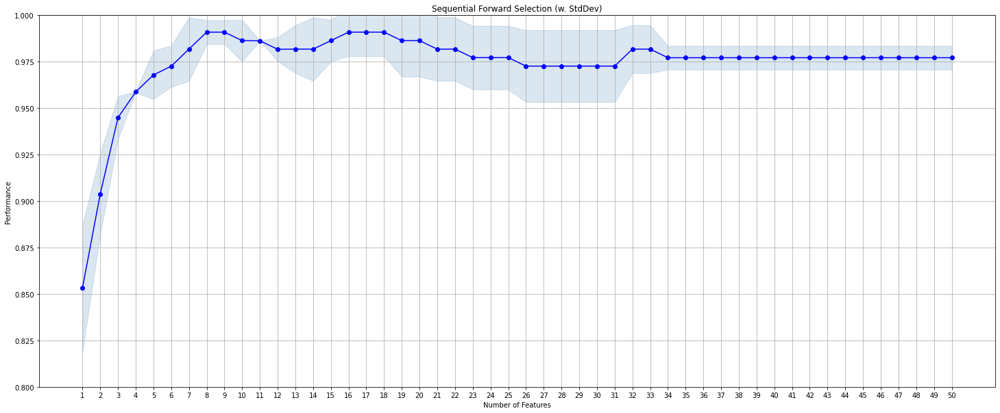

In [504]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
import matplotlib.pyplot as plt
fig1 = plot_sfs(sfs3.get_metric_dict(), kind='std_dev',figsize=(25,10))

plt.ylim([0.8, 1])
plt.title('Sequential Forward Selection (w. StdDev)')
plt.grid()
plt.show()

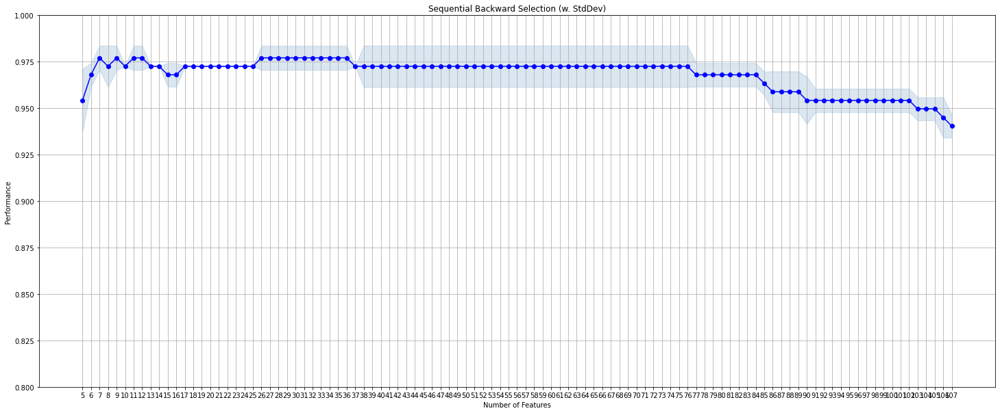

In [505]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
import matplotlib.pyplot as plt


# fig1=plt.figure(figsize=(20,8), dpi= 100, facecolor='w', edgecolor='k')
plot_sfs(sbs3.get_metric_dict(), kind='std_dev',figsize=(25,10))

plt.ylim([0.8, 1])
plt.title('Sequential Backward Selection (w. StdDev)')
plt.grid()
plt.show()


##### 04 - SMOTETomek Results

In [506]:
from sklearn.neighbors import KNeighborsClassifier
from mlxtend.feature_selection import SequentialFeatureSelector as sfs

scaler=StandardScaler()
X_train4_scale=scaler.fit_transform(X_train4)
X = pd.DataFrame(X_train4_scale,columns=X_train4.columns)
y = y_train4
knn = KNeighborsClassifier(n_neighbors=2)


# Sequential Forward Selection
start = timeit.default_timer()
sfs4 = sfs(knn, 
          k_features=50, 
          forward=True, 
          floating=False, 
          scoring='accuracy',
          cv=3,
          n_jobs=-1)
sfs4 = sfs4.fit(X, y)
stop = timeit.default_timer()
sfs_time_4=stop-start

print("Time: ", sfs_time_4)
print('\nSequential Forward Selection (k=2):')
print(sfs4.k_feature_idx_)
print('CV Score:')
print(sfs4.k_score_)

###################################################

# Sequential Backward Selection
start = timeit.default_timer()
sbs4 = sfs(knn, 
          k_features=5, 
          forward=False, 
          floating=False, 
          scoring='accuracy',
          cv=3,
          n_jobs=-1)
sbs4 = sbs4.fit(X, y)
stop = timeit.default_timer()
sbs_time_4=stop-start

print("Time: ", sbs_time_4)
print('\nSequential Backward Selection (k=2):')
print(sbs4.k_feature_idx_)
print('CV Score:')
print(sbs4.k_score_)

###################################################


Time:  62.82603620000009

Sequential Forward Selection (k=2):
(0, 2, 3, 4, 5, 6, 8, 10, 11, 12, 13, 14, 16, 18, 20, 21, 23, 24, 25, 26, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 47, 48, 49, 50, 51, 55, 59, 60, 61, 62, 66, 84, 101)
CV Score:
0.9606909430438842
Time:  215.81613229999493

Sequential Backward Selection (k=2):
(8, 40, 73, 85, 102)
CV Score:
0.9370214752567693


In [507]:
pd.DataFrame.from_dict(sfs4.get_metric_dict()).T

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
1,"(34,)","[0.8470588235294118, 0.8235294117647058, 0.869...",0.846545,"(fa1000,)",0.041825,0.018586,0.013142
2,"(0, 34)","[0.8823529411764706, 0.9176470588235294, 0.916...",0.905556,"(fa226, fa1000)",0.036932,0.016412,0.011605
3,"(0, 34, 66)","[0.9294117647058824, 0.9294117647058824, 0.952...",0.937068,"(fa226, fa1000, fa2519)",0.024366,0.010828,0.007656
4,"(0, 34, 47, 66)","[0.9176470588235294, 0.9411764705882353, 0.964...",0.941036,"(fa226, fa1000, fa1455, fa2519)",0.042847,0.01904,0.013464
5,"(0, 29, 34, 47, 66)","[0.9411764705882353, 0.9647058823529412, 0.952...",0.952754,"(fa226, fa865, fa1000, fa1455, fa2519)",0.021624,0.009609,0.006795
6,"(0, 29, 34, 35, 47, 66)","[0.9294117647058824, 0.9647058823529412, 0.964...",0.952801,"(fa226, fa865, fa1000, fa1029, fa1455, fa2519)",0.03722,0.01654,0.011695
7,"(0, 29, 34, 35, 36, 47, 66)","[0.9294117647058824, 0.9529411764705882, 0.976...",0.952848,"(fa226, fa865, fa1000, fa1029, fa1059, fa1455,...",0.042976,0.019097,0.013504
8,"(0, 29, 30, 34, 35, 36, 47, 66)","[0.9294117647058824, 0.9411764705882353, 0.976...",0.948926,"(fa226, fa865, fa890, fa1000, fa1029, fa1059, ...",0.04471,0.019868,0.014049
9,"(0, 29, 30, 34, 35, 36, 47, 48, 66)","[0.9411764705882353, 0.9529411764705882, 0.964...",0.952801,"(fa226, fa865, fa890, fa1000, fa1029, fa1059, ...",0.021231,0.009435,0.006671
10,"(0, 29, 30, 31, 34, 35, 36, 47, 48, 66)","[0.9411764705882353, 0.9529411764705882, 0.964...",0.952801,"(fa226, fa865, fa890, fa917, fa1000, fa1029, f...",0.021231,0.009435,0.006671


In [508]:
pd.DataFrame.from_dict(sbs4.get_metric_dict()).T

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
107,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.9176470588235294, 0.9294117647058824, 0.952...",0.933147,"(fa226, fa257, fa280, fa297, fa324, fa343, fa3...",0.032458,0.014424,0.010199
106,"(0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[0.9294117647058824, 0.9294117647058824, 0.952...",0.937068,"(fa226, fa280, fa297, fa324, fa343, fa363, fa3...",0.024366,0.010828,0.007656
105,"(0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[0.9411764705882353, 0.9294117647058824, 0.952...",0.94099,"(fa226, fa280, fa297, fa324, fa343, fa363, fa3...",0.021104,0.009378,0.006631
104,"(0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[0.9411764705882353, 0.9294117647058824, 0.952...",0.94099,"(fa226, fa280, fa297, fa324, fa343, fa363, fa3...",0.021104,0.009378,0.006631
103,"(0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[0.9411764705882353, 0.9294117647058824, 0.952...",0.94099,"(fa226, fa280, fa297, fa324, fa343, fa363, fa3...",0.021104,0.009378,0.006631
...,...,...,...,...,...,...,...
9,"(3, 8, 39, 40, 55, 62, 73, 85, 102)","[0.9176470588235294, 0.9647058823529412, 0.976...",0.952848,"(fa297, fa408, fa1155, fa1189, fa1834, fa2244,...",0.056997,0.025328,0.01791
8,"(3, 8, 40, 55, 62, 73, 85, 102)","[0.9411764705882353, 0.9529411764705882, 0.976...",0.956769,"(fa297, fa408, fa1189, fa1834, fa2244, fa3084,...",0.032739,0.014548,0.010287
7,"(8, 40, 55, 62, 73, 85, 102)","[0.9529411764705882, 0.9647058823529412, 0.964...",0.960644,"(fa408, fa1189, fa1834, fa2244, fa3084, fa4362...",0.012263,0.00545,0.003853
6,"(8, 40, 62, 73, 85, 102)","[0.9529411764705882, 0.9647058823529412, 0.952...",0.956676,"(fa408, fa1189, fa2244, fa3084, fa4362, fa7127)",0.012788,0.005683,0.004018


In [509]:
sfs_score_4=pd.DataFrame.from_dict(sfs4.get_metric_dict()).T.avg_score
max_sfs_score_4 =max(sfs_score_4)
max_sfs_index_4 = min(sfs_score_4.index[sfs_score_4.values==max_sfs_score_4])
sfs_feat_4=[sfs4.feature_names[i] for i in np.asarray(sfs4.k_feature_idx_[0:max_sfs_index_4+1])]
sfs_feat_4

['fa226',
 'fa280',
 'fa297',
 'fa324',
 'fa343',
 'fa363',
 'fa408',
 'fa458',
 'fa471',
 'fa500',
 'fa514',
 'fa545',
 'fa577',
 'fa629',
 'fa667',
 'fa686',
 'fa727',
 'fa749',
 'fa771',
 'fa793',
 'fa840',
 'fa865',
 'fa890',
 'fa917',
 'fa943',
 'fa971',
 'fa1000',
 'fa1029',
 'fa1059',
 'fa1090',
 'fa1122',
 'fa1155',
 'fa1189',
 'fa1224',
 'fa1259',
 'fa1296',
 'fa1334',
 'fa1455',
 'fa1498']

In [510]:
sbs_score_4=pd.DataFrame.from_dict(sbs4.get_metric_dict()).T.avg_score
max_sbs_score_4 =max(sbs_score_4)
max_sbs_score_4
max_sbs_index_4 = min(sbs_score_4.index[sbs_score_4.values==max_sbs_score_4])
max_sbs_index_4

22

In [511]:
pd.DataFrame.from_dict(sbs4.get_metric_dict()).T.iloc[22]

feature_idx      (0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...
cv_scores        [0.9529411764705882, 0.9411764705882353, 0.964...
avg_score                                                 0.952801
feature_names    (fa226, fa280, fa297, fa324, fa343, fa363, fa3...
ci_bound                                                  0.021231
std_dev                                                   0.009435
std_err                                                   0.006671
Name: 85, dtype: object

In [512]:
sbs4.k_feature_idx_

(8, 40, 73, 85, 102)

In [513]:
sbs_feat_4=[sbs4.feature_names[i] for i in np.asarray(sbs4.k_feature_idx_)]
sbs_feat_4

['fa408', 'fa1189', 'fa3084', 'fa4362', 'fa7127']

In [514]:
sbs4.k_score_

0.9370214752567693

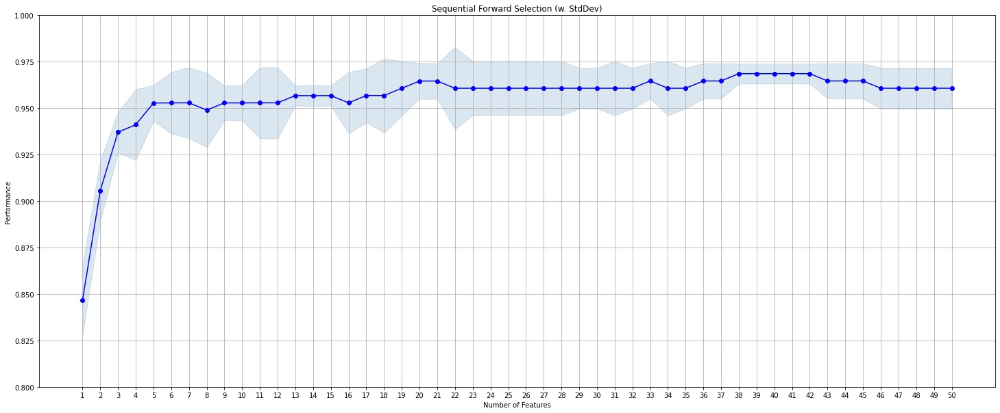

In [515]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
import matplotlib.pyplot as plt
fig1 = plot_sfs(sfs4.get_metric_dict(), kind='std_dev',figsize=(25,10))

plt.ylim([0.8, 1])
plt.title('Sequential Forward Selection (w. StdDev)')
plt.grid()
plt.show()

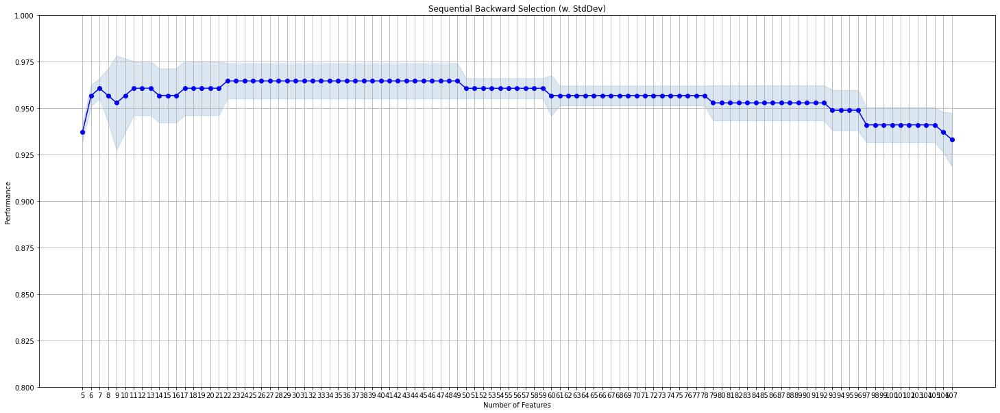

In [516]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
import matplotlib.pyplot as plt


# fig1=plt.figure(figsize=(20,8), dpi= 100, facecolor='w', edgecolor='k')
plot_sfs(sbs4.get_metric_dict(), kind='std_dev',figsize=(25,10))

plt.ylim([0.8, 1])
plt.title('Sequential Backward Selection (w. StdDev)')
plt.grid()
plt.show()


### 03 - Embedded Methods

#### 01 - Lasso

In [409]:
from sklearn.linear_model import Lasso, LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import SelectFromModel
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

##### 00 - Original Results

Time:  37.01772489999712
tuned hyperparameter :(best parameters)  {'C': 0.244205309454865, 'penalty': 'l1'}
accuracy : 0.9341666666666667
total features: 107
selected features: 6
features with coefficients shrank to zero: 101


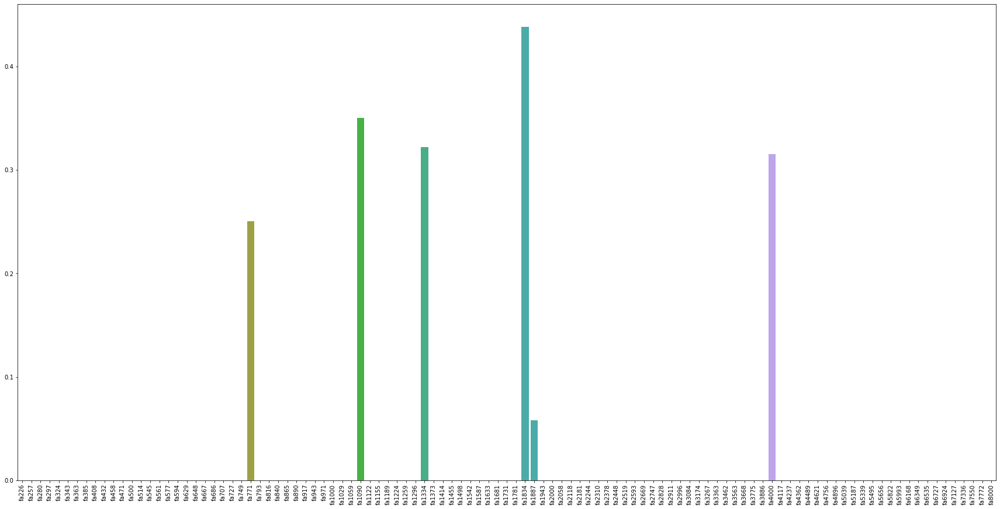

In [1106]:
# Grid search cross validation
start = timeit.default_timer()

grid={"C":np.logspace(-6,6,50), "penalty":["l1"]}# l1 lasso l2 ridge
logreg=LogisticRegression(solver='liblinear')
logreg_cv=GridSearchCV(logreg,grid,cv=10)
logreg_cv.fit(scaler.fit_transform(X_train0), y_train0)

best_logC=logreg_cv.best_params_['C']
best_penalty=logreg_cv.best_params_['penalty']

sel_0 = SelectFromModel(LogisticRegression(C=best_logC, penalty=best_penalty, solver='liblinear'))
sel_0.fit(scaler.fit_transform(X_train0), y_train0)
stop = timeit.default_timer()
lr_lasso_time_0=stop-start

print('Time: ',lr_lasso_time_0)
print("tuned hyperparameter :(best parameters) ",logreg_cv.best_params_)
print("accuracy :",logreg_cv.best_score_)

X_train0.columns[(sel_0.get_support())]

lasso_feat_0 = X_train0.columns[(sel_0.get_support())]
print('total features: {}'.format((X_train0.shape[1])))
print('selected features: {}'.format(len(lasso_feat_0)))
print('features with coefficients shrank to zero: {}'.format(
np.sum(sel_0.estimator_.coef_ == 0)))

coefs_0=abs(pd.Series(sel_0.estimator_.coef_.flatten(order='C')))
freq_0=pd.Series(X_train0.columns)

freq_importance_0=pd.concat([freq_0,coefs_0],keys=['freq','coef'],axis=1)

plt.figure(figsize=(30, 15))
sb.barplot(data=freq_importance_0,x=freq_0,y=coefs_0)
plt.xticks(rotation=90);

##### 01 - Nearmiss Results

Time:  3.0640353999915533
tuned hyperparameter :(best parameters)  {'C': 0.1389495494373136, 'penalty': 'l1'}
accuracy : 0.775
total features: 107
selected features: 3
features with coefficients shrank to zero: 104


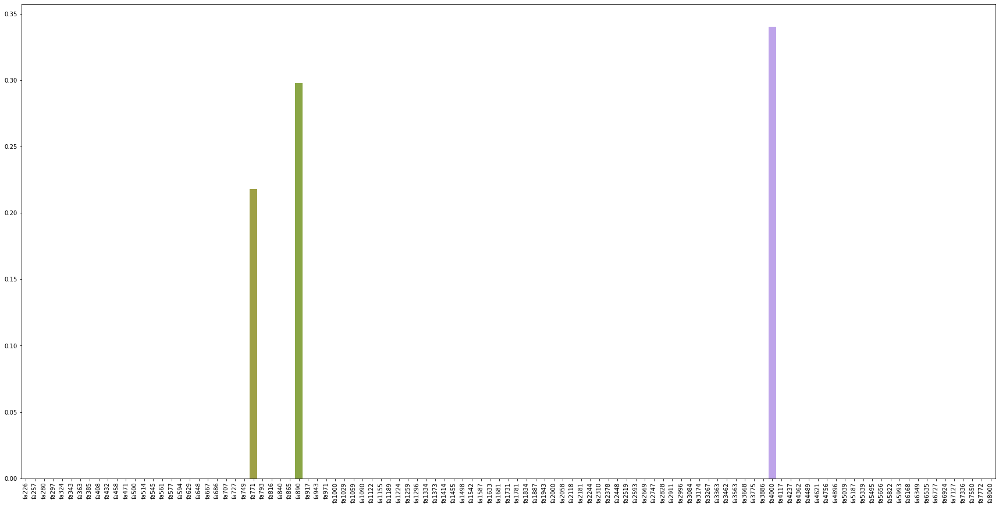

In [1107]:
# Grid search cross validation
start = timeit.default_timer()
grid={"C":np.logspace(-6,6,50), "penalty":["l1"]}# l1 lasso l2 ridge
logreg=LogisticRegression(solver='liblinear')
logreg_cv=GridSearchCV(logreg,grid,cv=10)
logreg_cv.fit(scaler.fit_transform(X_train1), y_train1)

best_logC=logreg_cv.best_params_['C']
best_penalty=logreg_cv.best_params_['penalty']

sel_1 = SelectFromModel(LogisticRegression(C=best_logC, penalty=best_penalty, solver='liblinear'))
sel_1.fit(scaler.fit_transform(X_train1), y_train1)
stop = timeit.default_timer()
lr_lasso_time_1=stop-start

print('Time: ',lr_lasso_time_1)
print("tuned hyperparameter :(best parameters) ",logreg_cv.best_params_)
print("accuracy :",logreg_cv.best_score_)

X_train1.columns[(sel_1.get_support())]

lasso_feat_1 = X_train1.columns[(sel_1.get_support())]
print('total features: {}'.format((X_train1.shape[1])))
print('selected features: {}'.format(len(lasso_feat_1)))
print('features with coefficients shrank to zero: {}'.format(
np.sum(sel_1.estimator_.coef_ == 0)))

coefs_1=abs(pd.Series(sel_1.estimator_.coef_.flatten(order='C')))
freq_1=pd.Series(X_train1.columns)

freq_importance_1=pd.concat([freq_1,coefs_1],keys=['freq','coef'],axis=1)

plt.figure(figsize=(30, 15))
sb.barplot(data=freq_importance_1,x=freq_1,y=coefs_1)
plt.xticks(rotation=90);

##### 02 - SMOTE Results

Time:  38.81445100001292
tuned hyperparameter :(best parameters)  {'C': 104811.3134154683, 'penalty': 'l1'}
accuracy : 0.95
total features: 107
selected features: 107
features with coefficients shrank to zero: 0


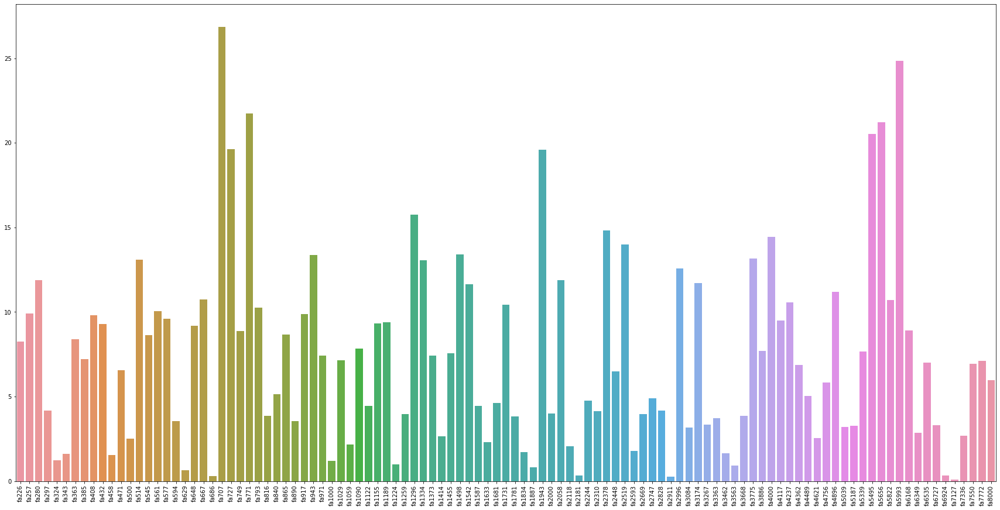

In [1108]:
# Grid search cross validation
start = timeit.default_timer()
grid={"C":np.logspace(-6,6,50), "penalty":["l1"]}# l1 lasso l2 ridge
logreg=LogisticRegression(solver='liblinear')
logreg_cv=GridSearchCV(logreg,grid,cv=10)
logreg_cv.fit(scaler.fit_transform(X_train2), y_train2)

best_logC=logreg_cv.best_params_['C']
best_penalty=logreg_cv.best_params_['penalty']

sel_2 = SelectFromModel(LogisticRegression(C=best_logC, penalty=best_penalty, solver='liblinear'))
sel_2.fit(scaler.fit_transform(X_train2), y_train2)
stop = timeit.default_timer()
lr_lasso_time_2=stop-start

print('Time: ',lr_lasso_time_2)
print("tuned hyperparameter :(best parameters) ",logreg_cv.best_params_)
print("accuracy :",logreg_cv.best_score_)

X_train2.columns[(sel_2.get_support())]

lasso_feat_2 = X_train2.columns[(sel_2.get_support())]
print('total features: {}'.format((X_train2.shape[1])))
print('selected features: {}'.format(len(lasso_feat_2)))
print('features with coefficients shrank to zero: {}'.format(
np.sum(sel_2.estimator_.coef_ == 0)))


coefs_2=abs(pd.Series(sel_2.estimator_.coef_.flatten(order='C')))
freq_2=pd.Series(X_train2.columns)

freq_importance_2=pd.concat([freq_2,coefs_2],keys=['freq','coef'],axis=1)

plt.figure(figsize=(30, 15))
sb.barplot(data=freq_importance_2,x=freq_2,y=coefs_2)
plt.xticks(rotation=90);

##### 03 - SMOTEENN Results

Time:  21.864185300000827
tuned hyperparameter :(best parameters)  {'C': 12.648552168552959, 'penalty': 'l1'}
accuracy : 0.9543290043290045
total features: 107
selected features: 30
features with coefficients shrank to zero: 77


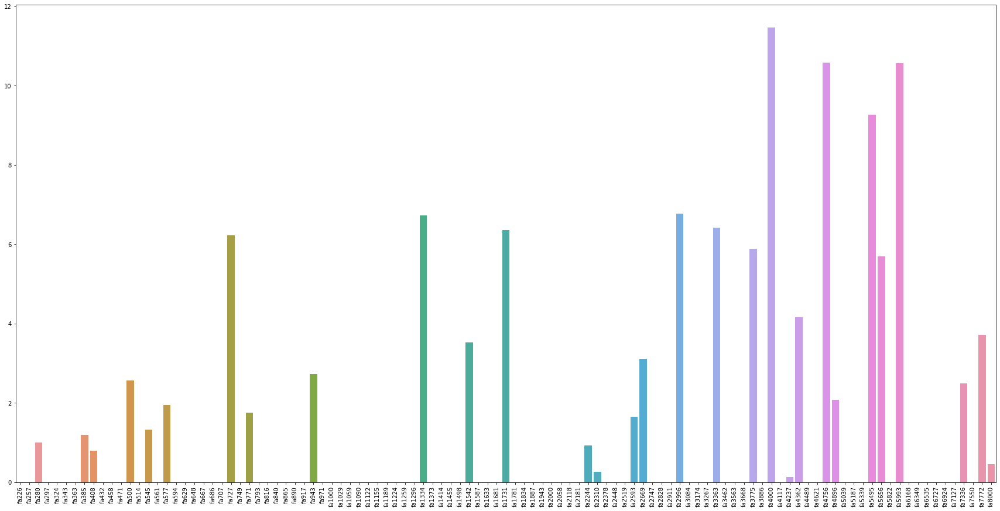

In [1122]:
# Grid search cross validation
start = timeit.default_timer()
grid={"C":np.logspace(-6,6,50), "penalty":["l1"]}# l1 lasso l2 ridge
logreg=LogisticRegression(solver='liblinear')
logreg_cv=GridSearchCV(logreg,grid,cv=10)
logreg_cv.fit(scaler.fit_transform(X_train3), y_train3)

best_logC=logreg_cv.best_params_['C']
best_penalty=logreg_cv.best_params_['penalty']

sel_3 = SelectFromModel(LogisticRegression(C=best_logC, penalty=best_penalty, solver='liblinear'))
sel_3.fit(scaler.fit_transform(X_train3), y_train3)
stop = timeit.default_timer()
lr_lasso_time_3=stop-start

print('Time: ',lr_lasso_time_3)
print("tuned hyperparameter :(best parameters) ",logreg_cv.best_params_)
print("accuracy :",logreg_cv.best_score_)

X_train3.columns[(sel_3.get_support())]

lasso_feat_3 = X_train3.columns[(sel_3.get_support())]
print('total features: {}'.format((X_train3.shape[1])))
print('selected features: {}'.format(len(lasso_feat_3)))
print('features with coefficients shrank to zero: {}'.format(
np.sum(sel_3.estimator_.coef_ == 0)))


coefs_3=abs(pd.Series(sel_3.estimator_.coef_.flatten(order='C')))
freq_3=pd.Series(X_train3.columns)

freq_importance_3=pd.concat([freq_3,coefs_3],keys=['freq','coef'],axis=1)

plt.figure(figsize=(30, 15))
sb.barplot(data=freq_importance_3,x=freq_3,y=coefs_3)
plt.xticks(rotation=90);

##### 04 - SMOTETomek Results

Time:  39.399370400002226
tuned hyperparameter :(best parameters)  {'C': 655.1285568595496, 'penalty': 'l1'}
accuracy : 0.937076923076923
total features: 107
selected features: 100
features with coefficients shrank to zero: 7


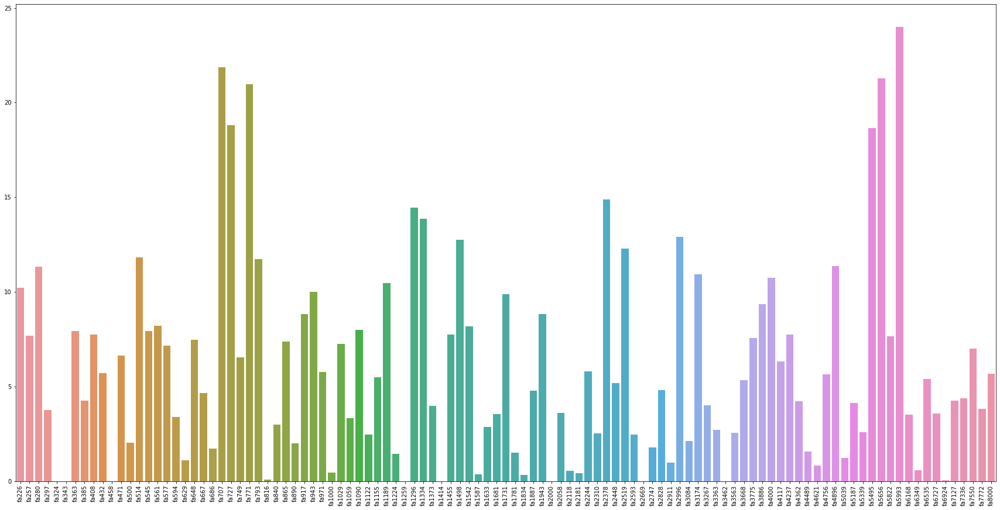

In [1128]:
# Grid search cross validation
start = timeit.default_timer()
grid={"C":np.logspace(-6,6,50), "penalty":["l1"]}# l1 lasso l2 ridge
logreg=LogisticRegression(solver='liblinear')
logreg_cv=GridSearchCV(logreg,grid,cv=10)
logreg_cv.fit(scaler.fit_transform(X_train4), y_train4)

best_logC=logreg_cv.best_params_['C']
best_penalty=logreg_cv.best_params_['penalty']

sel_4 = SelectFromModel(LogisticRegression(C=best_logC, penalty=best_penalty, solver='liblinear'))
sel_4.fit(scaler.fit_transform(X_train4), y_train4)
stop = timeit.default_timer()
lr_lasso_time_4=stop-start

print('Time: ',lr_lasso_time_4)
print("tuned hyperparameter :(best parameters) ",logreg_cv.best_params_)
print("accuracy :",logreg_cv.best_score_)

X_train4.columns[(sel_4.get_support())]

lasso_feat_4 = X_train4.columns[(sel_4.get_support())]
print('total features: {}'.format((X_train4.shape[1])))
print('selected features: {}'.format(len(lasso_feat_4)))
print('features with coefficients shrank to zero: {}'.format(
np.sum(sel_4.estimator_.coef_ == 0)))


coefs_4=abs(pd.Series(sel_4.estimator_.coef_.flatten(order='C')))
freq_4=pd.Series(X_train4.columns)

freq_importance_4=pd.concat([freq_4,coefs_4],keys=['freq','coef'],axis=1)

plt.figure(figsize=(30, 15))
sb.barplot(data=freq_importance_4,x=freq_4,y=coefs_4)
plt.xticks(rotation=90);

## 6.0 - Classification models

### 00 - Original RFECV SVC

In [1008]:
f_train_sv_0=X_train0.loc[:, X_train0.columns.isin(rfe_svc_0)]
f_val_sv_0=X_val0.loc[:, X_val0.columns.isin(rfe_svc_0)]
f_test_sv_0=X_test0.loc[:, X_test0.columns.isin(rfe_svc_0)]

In [1009]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, recall_score,precision_score,roc_auc_score

pipeline = Pipeline([
    ('min_max_scaler', MinMaxScaler()),
    ('std_scaler', StandardScaler())
])

X_train_sv_0 = pd.DataFrame(pipeline.fit_transform(f_train_sv_0),columns=rfe_svc_0)
X_val_sv_0 = pd.DataFrame(pipeline.transform(f_val_sv_0),columns=rfe_svc_0)
X_test_sv_0 = pd.DataFrame(pipeline.transform(f_test_sv_0),columns=rfe_svc_0)

model = SVC(kernel='linear')
model.fit(X_train_sv_0, y_train0)
y_pred=model.predict(X_test_sv_0)
print(y_pred)

acc=classification_report(y_test0, y_pred,output_dict=True)['accuracy']
p=classification_report(y_test0, y_pred,output_dict=True)['macro avg']['precision']
r=classification_report(y_test0, y_pred,output_dict=True)['macro avg']['recall']
f1=classification_report(y_test0, y_pred,output_dict=True)['macro avg']['f1-score']
auc=roc_auc_score(y_test0, y_pred)

rfecv_rf_result_0=list([acc,p,r,f1,auc])

print_score(model, X_train_sv_0, y_train0, X_val_sv_0 , y_val0 , X_test_sv_0, y_test0, 'train')
print_score(model, X_train_sv_0, y_train0, X_val_sv_0 , y_val0 , X_test_sv_0, y_test0, 'val')
print_score(model, X_train_sv_0, y_train0, X_val_sv_0 , y_val0 , X_test_sv_0, y_test0, 'test')
print(acc,p,r,f0,auc)

[0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0
 1 0 0 0 1 0 1 0 0 0 0]
Train Result:
Accuracy Score: 93.42%
_______________________________________________
CLASSIFICATION REPORT:
                    0          1  accuracy   macro avg  weighted avg
precision    0.941176   0.875000  0.934211    0.908088      0.931598
recall       0.984615   0.636364  0.934211    0.810490      0.934211
f1-score     0.962406   0.736842  0.934211    0.849624      0.929759
support    130.000000  22.000000  0.934211  152.000000    152.000000
_______________________________________________
Confusion Matrix: 
 [[128   2]
 [  8  14]]

Validation Result:
Accuracy Score: 92.31%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   0.935484  0.875000  0.923077   0.905242      0.921526
recall      0.966667  0.777778  0.923077   0.872222      0.923077
f1-score    0.950820  0.823529  0.923077   0.

### 01 - Nearmiss RFECV SVC

In [1010]:
f_train_sv_1=X_train1.loc[:, X_train1.columns.isin(rfe_svc_1)]
f_val_sv_1=X_val1.loc[:, X_val1.columns.isin(rfe_svc_1)]
f_test_sv_1=X_test1.loc[:, X_test1.columns.isin(rfe_svc_1)]

In [1011]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, recall_score,precision_score,roc_auc_score

pipeline = Pipeline([
    ('min_max_scaler', MinMaxScaler()),
    ('std_scaler', StandardScaler())
])

X_train_sv_1 = pd.DataFrame(pipeline.fit_transform(f_train_sv_1),columns=rfe_svc_1)
X_val_sv_1 = pd.DataFrame(pipeline.transform(f_val_sv_1),columns=rfe_svc_1)
X_test_sv_1 = pd.DataFrame(pipeline.transform(f_test_sv_1),columns=rfe_svc_1)

model = SVC(kernel='linear')
model.fit(X_train_sv_1, y_train1)
y_pred=model.predict(X_test_sv_1)
print(y_pred)

acc=classification_report(y_test1, y_pred,output_dict=True)['accuracy']
p=classification_report(y_test1, y_pred,output_dict=True)['macro avg']['precision']
r=classification_report(y_test1, y_pred,output_dict=True)['macro avg']['recall']
f1=classification_report(y_test1, y_pred,output_dict=True)['macro avg']['f1-score']
auc=roc_auc_score(y_test1, y_pred)

rfecv_rf_result_1=list([acc,p,r,f1,auc])

print_score(model, X_train_sv_1, y_train1, X_val_sv_1 , y_val1 , X_test_sv_1, y_test1, 'train')
print_score(model, X_train_sv_1, y_train1, X_val_sv_1 , y_val1 , X_test_sv_1, y_test1, 'val')
print_score(model, X_train_sv_1, y_train1, X_val_sv_1 , y_val1 , X_test_sv_1, y_test1, 'test')
print(acc,p,r,f1,auc)

[0 0 0 1 1 0 0 0 0 1 0 1 0 0 0 1 0 0 1 1 1 0 0 1 0 1 1 1 0 1 1 0 1 1 0 0 0
 1 1 0 1 1 1 1 0 0 0 0]
Train Result:
Accuracy Score: 84.09%
_______________________________________________
CLASSIFICATION REPORT:
                   0          1  accuracy  macro avg  weighted avg
precision   0.857143   0.826087  0.840909   0.841615      0.841615
recall      0.818182   0.863636  0.840909   0.840909      0.840909
f1-score    0.837209   0.844444  0.840909   0.840827      0.840827
support    22.000000  22.000000  0.840909  44.000000     44.000000
_______________________________________________
Confusion Matrix: 
 [[18  4]
 [ 3 19]]

Validation Result:
Accuracy Score: 64.10%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   1.000000  0.391304  0.641026   0.695652      0.859532
recall      0.533333  1.000000  0.641026   0.766667      0.641026
f1-score    0.695652  0.562500  0.641026   0.629076      0.

### 02 - SMOTE RFECV RF

In [1012]:
f_train_sv_2=X_train2.loc[:, X_train2.columns.isin(rfe_svc_2)]
f_val_sv_2=X_val2.loc[:, X_val2.columns.isin(rfe_svc_2)]
f_test_sv_2=X_test2.loc[:, X_test2.columns.isin(rfe_svc_2)]

In [1013]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, recall_score,precision_score,roc_auc_score

pipeline = Pipeline([
    ('min_max_scaler', MinMaxScaler()),
    ('std_scaler', StandardScaler())
])

X_train_sv_2 = pd.DataFrame(pipeline.fit_transform(f_train_sv_2),columns=rfe_svc_2)
X_val_sv_2 = pd.DataFrame(pipeline.transform(f_val_sv_2),columns=rfe_svc_2)
X_test_sv_2 = pd.DataFrame(pipeline.transform(f_test_sv_2),columns=rfe_svc_2)

model = SVC(kernel='linear')
model.fit(X_train_sv_2, y_train2)
y_pred=model.predict(X_test_sv_2)
print(y_pred)

acc=classification_report(y_test2, y_pred,output_dict=True)['accuracy']
p=classification_report(y_test2, y_pred,output_dict=True)['macro avg']['precision']
r=classification_report(y_test2, y_pred,output_dict=True)['macro avg']['recall']
f1=classification_report(y_test2, y_pred,output_dict=True)['macro avg']['f1-score']
auc=roc_auc_score(y_test2, y_pred)

rfecv_rf_result_2=list([acc,p,r,f1,auc])

print_score(model, X_train_sv_2, y_train2, X_val_sv_2 , y_val2 , X_test_sv_2, y_test2, 'train')
print_score(model, X_train_sv_2, y_train2, X_val_sv_2 , y_val2 , X_test_sv_2, y_test2, 'val')
print_score(model, X_train_sv_2, y_train2, X_val_sv_2 , y_val2 , X_test_sv_2, y_test2, 'test')
print(acc,p,r,f2,auc)

[0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 1 1 0 0 1 0 0 0 0 0 1 0 0 1 1 0 0 0
 1 0 0 0 1 1 1 0 0 0 0]
Train Result:
Accuracy Score: 89.62%
_______________________________________________
CLASSIFICATION REPORT:
                    0           1  accuracy   macro avg  weighted avg
precision    0.893130    0.899225  0.896154    0.896177      0.896177
recall       0.900000    0.892308  0.896154    0.896154      0.896154
f1-score     0.896552    0.895753  0.896154    0.896152      0.896152
support    130.000000  130.000000  0.896154  260.000000    260.000000
_______________________________________________
Confusion Matrix: 
 [[117  13]
 [ 14 116]]

Validation Result:
Accuracy Score: 82.05%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   0.896552  0.600000  0.820513   0.748276      0.828117
recall      0.866667  0.666667  0.820513   0.766667      0.820513
f1-score    0.881356  0.631579  0.820513

### 03 - SMOTEENN RFECV RF

In [1014]:
f_train_sv_3=X_train3.loc[:, X_train3.columns.isin(rfe_svc_3)]
f_val_sv_3=X_val3.loc[:, X_val3.columns.isin(rfe_svc_3)]
f_test_sv_3=X_test3.loc[:, X_test3.columns.isin(rfe_svc_3)]

In [1015]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, recall_score,precision_score,roc_auc_score

pipeline = Pipeline([
    ('min_max_scaler', MinMaxScaler()),
    ('std_scaler', StandardScaler())
])

X_train_sv_3 = pd.DataFrame(pipeline.fit_transform(f_train_sv_3),columns=rfe_svc_3)
X_val_sv_3 = pd.DataFrame(pipeline.transform(f_val_sv_3),columns=rfe_svc_3)
X_test_sv_3 = pd.DataFrame(pipeline.transform(f_test_sv_3),columns=rfe_svc_3)

model = SVC(kernel='linear')
model.fit(X_train_sv_3, y_train3)
y_pred=model.predict(X_test_sv_3)
print(y_pred)

acc=classification_report(y_test3, y_pred,output_dict=True)['accuracy']
p=classification_report(y_test3, y_pred,output_dict=True)['macro avg']['precision']
r=classification_report(y_test3, y_pred,output_dict=True)['macro avg']['recall']
f1=classification_report(y_test3, y_pred,output_dict=True)['macro avg']['f1-score']
auc=roc_auc_score(y_test3, y_pred)

rfecv_rf_result_3=list([acc,p,r,f1,auc])

print_score(model, X_train_sv_3, y_train3, X_val_sv_3 , y_val3 , X_test_sv_3, y_test3, 'train')
print_score(model, X_train_sv_3, y_train3, X_val_sv_3 , y_val3 , X_test_sv_3, y_test3, 'val')
print_score(model, X_train_sv_3, y_train3, X_val_sv_3 , y_val3 , X_test_sv_3, y_test3, 'test')
print(acc,p,r,f3,auc)

[0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 1 0 0 0 1 0 0 0 0 0 1 0 0 1 1 0 0 0
 1 0 0 0 1 1 1 0 0 0 0]
Train Result:
Accuracy Score: 90.83%
_______________________________________________
CLASSIFICATION REPORT:
                   0           1  accuracy   macro avg  weighted avg
precision   0.888889    0.924370  0.908257    0.906629      0.908582
recall      0.907216    0.909091  0.908257    0.908154      0.908257
f1-score    0.897959    0.916667  0.908257    0.907313      0.908343
support    97.000000  121.000000  0.908257  218.000000    218.000000
_______________________________________________
Confusion Matrix: 
 [[ 88   9]
 [ 11 110]]

Validation Result:
Accuracy Score: 89.74%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   0.964286  0.727273  0.897436   0.845779      0.909590
recall      0.900000  0.888889  0.897436   0.894444      0.897436
f1-score    0.931034  0.800000  0.897436   0.

### 04 - SMOTETomek RFECV RF

In [1016]:
f_train_sv_4=X_train4.loc[:, X_train4.columns.isin(rfe_svc_4)]
f_val_sv_4=X_val4.loc[:, X_val4.columns.isin(rfe_svc_4)]
f_test_sv_4=X_test4.loc[:, X_test4.columns.isin(rfe_svc_4)]

In [1017]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, recall_score,precision_score,roc_auc_score

pipeline = Pipeline([
    ('min_max_scaler', MinMaxScaler()),
    ('std_scaler', StandardScaler())
])

X_train_sv_4 = pd.DataFrame(pipeline.fit_transform(f_train_sv_4),columns=rfe_svc_4)
X_val_sv_4 = pd.DataFrame(pipeline.transform(f_val_sv_4),columns=rfe_svc_4)
X_test_sv_4 = pd.DataFrame(pipeline.transform(f_test_sv_4),columns=rfe_svc_4)

model = SVC(kernel='linear')
model.fit(X_train_sv_4, y_train4)
y_pred=model.predict(X_test_sv_4)
print(y_pred)

acc=classification_report(y_test4, y_pred,output_dict=True)['accuracy']
p=classification_report(y_test4, y_pred,output_dict=True)['macro avg']['precision']
r=classification_report(y_test4, y_pred,output_dict=True)['macro avg']['recall']
f1=classification_report(y_test4, y_pred,output_dict=True)['macro avg']['f1-score']
auc=roc_auc_score(y_test4, y_pred)

rfecv_rf_result_4=list([acc,p,r,f1,auc])

print_score(model, X_train_sv_4, y_train4, X_val_sv_4 , y_val4 , X_test_sv_4, y_test4, 'train')
print_score(model, X_train_sv_4, y_train4, X_val_sv_4 , y_val4 , X_test_sv_4, y_test4, 'val')
print_score(model, X_train_sv_4, y_train4, X_val_sv_4 , y_val4 , X_test_sv_4, y_test4, 'test')
print(acc,p,r,f4,auc)

[0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0
 1 0 0 0 1 1 1 0 0 0 0]
Train Result:
Accuracy Score: 92.91%
_______________________________________________
CLASSIFICATION REPORT:
                    0           1  accuracy   macro avg  weighted avg
precision    0.936000    0.922481  0.929134    0.929240      0.929240
recall       0.921260    0.937008  0.929134    0.929134      0.929134
f1-score     0.928571    0.929688  0.929134    0.929129      0.929129
support    127.000000  127.000000  0.929134  254.000000    254.000000
_______________________________________________
Confusion Matrix: 
 [[117  10]
 [  8 119]]

Validation Result:
Accuracy Score: 84.62%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   0.961538  0.615385  0.846154   0.788462      0.881657
recall      0.833333  0.888889  0.846154   0.861111      0.846154
f1-score    0.892857  0.727273  0.846154

### 00 - Original RFECV RF

In [856]:
f_train_rf_0=X_train0.loc[:, X_train0.columns.isin(rfecv_feat_rf_0)]
f_val_rf_0=X_val0.loc[:, X_val0.columns.isin(rfecv_feat_rf_0)]
f_test_rf_0=X_test0.loc[:, X_test0.columns.isin(rfecv_feat_rf_0)]

In [860]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, recall_score,precision_score,roc_auc_score

X_train_rf_0 = pd.DataFrame(pipeline.fit_transform(f_train_rf_0),columns=rfecv_feat_rf_0)
X_val_rf_0 = pd.DataFrame(pipeline.transform(f_val_rf_0),columns=rfecv_feat_rf_0)
X_test_rf_0 = pd.DataFrame(pipeline.transform(f_test_rf_0),columns=rfecv_feat_rf_0)

model = SVC(kernel='linear')
model.fit(X_train_rf_0, y_train0)
y_pred=model.predict(X_test_rf_0)
print(y_pred)

acc=classification_report(y_test0, y_pred,output_dict=True)['accuracy']
p=classification_report(y_test0, y_pred,output_dict=True)['macro avg']['precision']
r=classification_report(y_test0, y_pred,output_dict=True)['macro avg']['recall']
f1=classification_report(y_test0, y_pred,output_dict=True)['macro avg']['f1-score']
auc=roc_auc_score(y_test0, y_pred)

rfecv_rf_result_0=list([acc,p,r,f1,auc])

print_score(model, X_train_rf_0, y_train0, X_val_rf_0 , y_val0 , X_test_rf_0, y_test0, 'train')
print_score(model, X_train_rf_0, y_train0, X_val_rf_0 , y_val0 , X_test_rf_0, y_test0, 'val')
print_score(model, X_train_rf_0, y_train0, X_val_rf_0 , y_val0 , X_test_rf_0, y_test0, 'test')
print(acc,p,r,f0,auc)

[0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0
 1 0 0 0 1 0 1 0 0 0 0]
Train Result:
Accuracy Score: 94.74%
_______________________________________________
CLASSIFICATION REPORT:
                    0          1  accuracy   macro avg  weighted avg
precision    0.942029   1.000000  0.947368    0.971014      0.950420
recall       1.000000   0.636364  0.947368    0.818182      0.947368
f1-score     0.970149   0.777778  0.947368    0.873964      0.942306
support    130.000000  22.000000  0.947368  152.000000    152.000000
_______________________________________________
Confusion Matrix: 
 [[130   0]
 [  8  14]]

Validation Result:
Accuracy Score: 92.31%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   0.935484  0.875000  0.923077   0.905242      0.921526
recall      0.966667  0.777778  0.923077   0.872222      0.923077
f1-score    0.950820  0.823529  0.923077   0.

In [798]:
f_train_rf_0=X_train0.loc[:, X_train0.columns.isin(rfecv_feat_rf_0)]
f_val_rf_0=X_val0.loc[:, X_val0.columns.isin(rfecv_feat_rf_0)]
f_test_rf_0=X_test0.loc[:, X_test0.columns.isin(rfecv_feat_rf_0)]

In [799]:
pipeline = Pipeline([
    ('min_max_scaler', MinMaxScaler()),
    ('std_scaler', StandardScaler())
])

X_train_rf_0 = pipeline.fit_transform(f_train_rf_0)
X_val_rf_0 = pipeline.transform(f_val_rf_0)
X_test_rf_0 = pipeline.transform(f_test_rf_0)

In [800]:
from sklearn.svm import SVC
model = SVC(kernel='linear')
model.fit(X_train_rf_0, y_train0)

model.predict(f_test_rf_0)

# print_score(model, X_train_rf_0, y_train0, X_val_rf_0 , y_val0 , X_test_rf_0, y_test0, 'train')
# print_score(model, X_train_rf_0, y_train0, X_val_rf_0 , y_val0 , X_test_rf_0, y_test0, 'val')
# print_score(model, X_train_rf_0, y_train0, X_val_rf_0 , y_val0 , X_test_rf_0, y_test0, 'test')

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0], dtype=int64)

### 01 - Nearmiss RFECV RF

In [850]:
f_train_rf_1=X_train1.loc[:, X_train1.columns.isin(rfecv_feat_rf_1)]
f_val_rf_1=X_val1.loc[:, X_val1.columns.isin(rfecv_feat_rf_1)]
f_test_rf_1=X_test1.loc[:, X_test1.columns.isin(rfecv_feat_rf_1)]

In [852]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, recall_score,precision_score,roc_auc_score

X_train_rf_1 = pd.DataFrame(pipeline.fit_transform(f_train_rf_1),columns=rfecv_feat_rf_1)
X_val_rf_1 = pd.DataFrame(pipeline.transform(f_val_rf_1),columns=rfecv_feat_rf_1)
X_test_rf_1 = pd.DataFrame(pipeline.transform(f_test_rf_1),columns=rfecv_feat_rf_1)

model = SVC(kernel='linear')
model.fit(X_train_rf_1, y_train1)
y_pred=model.predict(X_test_rf_1)
print(y_pred)

acc=classification_report(y_test1, y_pred,output_dict=True)['accuracy']
p=classification_report(y_test1, y_pred,output_dict=True)['macro avg']['precision']
r=classification_report(y_test1, y_pred,output_dict=True)['macro avg']['recall']
f1=classification_report(y_test1, y_pred,output_dict=True)['macro avg']['f1-score']
auc=roc_auc_score(y_test1, y_pred)

rfecv_rf_result_1=list([acc,p,r,f1,auc])

print_score(model, X_train_rf_1, y_train1, X_val_rf_1 , y_val1 , X_test_rf_1, y_test1, 'train')
print_score(model, X_train_rf_1, y_train1, X_val_rf_1 , y_val1 , X_test_rf_1, y_test1, 'val')
print_score(model, X_train_rf_1, y_train1, X_val_rf_1 , y_val1 , X_test_rf_1, y_test1, 'test')
print(acc,p,r,f1,auc)

[0 0 1 1 1 1 0 0 1 1 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 1 1 1 0 1 1 0 1 1 0 0 0
 1 1 1 1 1 1 1 0 1 0 0]
Train Result:
Accuracy Score: 84.09%
_______________________________________________
CLASSIFICATION REPORT:
                   0          1  accuracy  macro avg  weighted avg
precision   0.857143   0.826087  0.840909   0.841615      0.841615
recall      0.818182   0.863636  0.840909   0.840909      0.840909
f1-score    0.837209   0.844444  0.840909   0.840827      0.840827
support    22.000000  22.000000  0.840909  44.000000     44.000000
_______________________________________________
Confusion Matrix: 
 [[18  4]
 [ 3 19]]

Validation Result:
Accuracy Score: 56.41%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   0.933333  0.333333  0.564103   0.633333      0.794872
recall      0.466667  0.888889  0.564103   0.677778      0.564103
f1-score    0.622222  0.484848  0.564103   0.553535      0.

### 02 - SMOTE RFECV RF

In [783]:
f_train_rf_2=X_train2.loc[:, X_train2.columns.isin(rfecv_feat_rf_2)]
f_val_rf_2=X_val2.loc[:, X_val2.columns.isin(rfecv_feat_rf_2)]
f_test_rf_2=X_test2.loc[:, X_test2.columns.isin(rfecv_feat_rf_2)]

In [861]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, recall_score,precision_score,roc_auc_score

X_train_rf_2 = pd.DataFrame(pipeline.fit_transform(f_train_rf_2),columns=rfecv_feat_rf_2)
X_val_rf_2 = pd.DataFrame(pipeline.transform(f_val_rf_2),columns=rfecv_feat_rf_2)
X_test_rf_2 = pd.DataFrame(pipeline.transform(f_test_rf_2),columns=rfecv_feat_rf_2)

model = SVC(kernel='linear')
model.fit(X_train_rf_2, y_train2)
y_pred=model.predict(X_test_rf_2)
print(y_pred)

acc=classification_report(y_test2, y_pred,output_dict=True)['accuracy']
p=classification_report(y_test2, y_pred,output_dict=True)['macro avg']['precision']
r=classification_report(y_test2, y_pred,output_dict=True)['macro avg']['recall']
f1=classification_report(y_test2, y_pred,output_dict=True)['macro avg']['f1-score']
auc=roc_auc_score(y_test2, y_pred)

rfecv_rf_result_2=list([acc,p,r,f1,auc])

print_score(model, X_train_rf_2, y_train2, X_val_rf_2 , y_val2 , X_test_rf_2, y_test2, 'train')
print_score(model, X_train_rf_2, y_train2, X_val_rf_2 , y_val2 , X_test_rf_2, y_test2, 'val')
print_score(model, X_train_rf_2, y_train2, X_val_rf_2 , y_val2 , X_test_rf_2, y_test2, 'test')
print(acc,p,r,f1,auc)

[0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 1 1 0 0 1 0 1 0 0 0 1 0 0 1 1 0 0 0
 1 0 0 0 1 1 1 0 0 0 0]
Train Result:
Accuracy Score: 88.85%
_______________________________________________
CLASSIFICATION REPORT:
                    0           1  accuracy   macro avg  weighted avg
precision    0.885496    0.891473  0.888462    0.888485      0.888485
recall       0.892308    0.884615  0.888462    0.888462      0.888462
f1-score     0.888889    0.888031  0.888462    0.888460      0.888460
support    130.000000  130.000000  0.888462  260.000000    260.000000
_______________________________________________
Confusion Matrix: 
 [[116  14]
 [ 15 115]]

Validation Result:
Accuracy Score: 89.74%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   0.964286  0.727273  0.897436   0.845779      0.909590
recall      0.900000  0.888889  0.897436   0.894444      0.897436
f1-score    0.931034  0.800000  0.897436

### 03 - SMOTEENN RFECV RF

In [862]:
f_train_rf_3=X_train3.loc[:, X_train3.columns.isin(rfecv_feat_rf_3)]
f_val_rf_3=X_val3.loc[:, X_val3.columns.isin(rfecv_feat_rf_3)]
f_test_rf_3=X_test3.loc[:, X_test3.columns.isin(rfecv_feat_rf_3)]

In [863]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, recall_score,precision_score,roc_auc_score

X_train_rf_3 = pd.DataFrame(pipeline.fit_transform(f_train_rf_3),columns=rfecv_feat_rf_3)
X_val_rf_3 = pd.DataFrame(pipeline.transform(f_val_rf_3),columns=rfecv_feat_rf_3)
X_test_rf_3 = pd.DataFrame(pipeline.transform(f_test_rf_3),columns=rfecv_feat_rf_3)

model = SVC(kernel='linear')
model.fit(X_train_rf_3, y_train3)
y_pred=model.predict(X_test_rf_3)
print(y_pred)

acc=classification_report(y_test3, y_pred,output_dict=True)['accuracy']
p=classification_report(y_test3, y_pred,output_dict=True)['macro avg']['precision']
r=classification_report(y_test3, y_pred,output_dict=True)['macro avg']['recall']
f1=classification_report(y_test3, y_pred,output_dict=True)['macro avg']['f1-score']
auc=roc_auc_score(y_test3, y_pred)

rfecv_rf_result_3=list([acc,p,r,f1,auc])

print_score(model, X_train_rf_3, y_train3, X_val_rf_3 , y_val3 , X_test_rf_3, y_test3, 'train')
print_score(model, X_train_rf_3, y_train3, X_val_rf_3 , y_val3 , X_test_rf_3, y_test3, 'val')
print_score(model, X_train_rf_3, y_train3, X_val_rf_3 , y_val3 , X_test_rf_3, y_test3, 'test')
print(acc,p,r,f1,auc)

[1 1 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 1 0 0 0 1 0 0 0 0 0 1 0 0 1 1 0 0 1
 1 0 0 0 1 1 1 0 0 0 0]
Train Result:
Accuracy Score: 93.58%
_______________________________________________
CLASSIFICATION REPORT:
                   0           1  accuracy   macro avg  weighted avg
precision   0.927835    0.942149   0.93578    0.934992       0.93578
recall      0.927835    0.942149   0.93578    0.934992       0.93578
f1-score    0.927835    0.942149   0.93578    0.934992       0.93578
support    97.000000  121.000000   0.93578  218.000000     218.00000
_______________________________________________
Confusion Matrix: 
 [[ 90   7]
 [  7 114]]

Validation Result:
Accuracy Score: 76.92%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   0.888889  0.500000  0.769231   0.694444      0.799145
recall      0.800000  0.666667  0.769231   0.733333      0.769231
f1-score    0.842105  0.571429  0.769231   0.

### 04 - SMOTETomek RFECV RF

In [864]:
f_train_rf_4=X_train4.loc[:, X_train4.columns.isin(rfecv_feat_rf_4)]
f_val_rf_4=X_val4.loc[:, X_val4.columns.isin(rfecv_feat_rf_4)]
f_test_rf_4=X_test4.loc[:, X_test4.columns.isin(rfecv_feat_rf_4)]

In [865]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, recall_score,precision_score,roc_auc_score

X_train_rf_4 = pd.DataFrame(pipeline.fit_transform(f_train_rf_4),columns=rfecv_feat_rf_4)
X_val_rf_4 = pd.DataFrame(pipeline.transform(f_val_rf_4),columns=rfecv_feat_rf_4)
X_test_rf_4 = pd.DataFrame(pipeline.transform(f_test_rf_4),columns=rfecv_feat_rf_4)

model = SVC(kernel='linear')
model.fit(X_train_rf_4, y_train4)
y_pred=model.predict(X_test_rf_4)
print(y_pred)

acc=classification_report(y_test4, y_pred,output_dict=True)['accuracy']
p=classification_report(y_test4, y_pred,output_dict=True)['macro avg']['precision']
r=classification_report(y_test4, y_pred,output_dict=True)['macro avg']['recall']
f1=classification_report(y_test4, y_pred,output_dict=True)['macro avg']['f1-score']
auc=roc_auc_score(y_test4, y_pred)

rfecv_rf_result_4=list([acc,p,r,f1,auc])

print_score(model, X_train_rf_4, y_train4, X_val_rf_4 , y_val4 , X_test_rf_4, y_test4, 'train')
print_score(model, X_train_rf_4, y_train4, X_val_rf_4 , y_val4 , X_test_rf_4, y_test4, 'val')
print_score(model, X_train_rf_4, y_train4, X_val_rf_4 , y_val4 , X_test_rf_4, y_test4, 'test')
print(acc,p,r,f1,auc)

[0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 1 0 0 1 0 0 1 0 0 1 1 0 0 1
 1 0 0 0 1 1 1 0 0 0 0]
Train Result:
Accuracy Score: 96.06%
_______________________________________________
CLASSIFICATION REPORT:
                    0           1  accuracy   macro avg  weighted avg
precision    0.968000    0.953488   0.96063    0.960744      0.960744
recall       0.952756    0.968504   0.96063    0.960630      0.960630
f1-score     0.960317    0.960938   0.96063    0.960627      0.960627
support    127.000000  127.000000   0.96063  254.000000    254.000000
_______________________________________________
Confusion Matrix: 
 [[121   6]
 [  4 123]]

Validation Result:
Accuracy Score: 87.18%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   0.962963  0.666667  0.871795   0.814815      0.894587
recall      0.866667  0.888889  0.871795   0.877778      0.871795
f1-score    0.912281  0.761905  0.871795

### 01 - Original SBS

In [870]:
f_train_sbs0=X_train0.loc[:, X_train0.columns.isin(sbs_feat_0)]
f_val_sbs0=X_val0.loc[:, X_val0.columns.isin(sbs_feat_0)]
f_test_sbs0=X_test0.loc[:, X_test0.columns.isin(sbs_feat_0)]

In [871]:
pipeline = Pipeline([
    ('min_max_scaler', MinMaxScaler()),
    ('std_scaler', StandardScaler())
])

X_train_sbs0 = pipeline.fit_transform(f_train_sbs0)
X_val_sbs0 = pipeline.transform(f_val_sbs0)
X_test_sbs0 = pipeline.transform(f_test_sbs0)

In [872]:
from sklearn.svm import SVC
model = SVC(kernel='linear')
model.fit(X_train_sbs0, y_train0)

print_score(model, X_train_sbs0, y_train0, X_val_sbs0 , y_val0 , X_test_sbs0, y_test0, 'train')
print_score(model, X_train_sbs0, y_train0, X_val_sbs0 , y_val0 , X_test_sbs0, y_test0, 'val')
print_score(model, X_train_sbs0, y_train0, X_val_sbs0 , y_val0 , X_test_sbs0, y_test0, 'test')

Train Result:
Accuracy Score: 93.42%
_______________________________________________
CLASSIFICATION REPORT:
                    0          1  accuracy   macro avg  weighted avg
precision    0.934783   0.928571  0.934211    0.931677      0.933884
recall       0.992308   0.590909  0.934211    0.791608      0.934211
f1-score     0.962687   0.722222  0.934211    0.842454      0.927883
support    130.000000  22.000000  0.934211  152.000000    152.000000
_______________________________________________
Confusion Matrix: 
 [[129   1]
 [  9  13]]

Validation Result:
Accuracy Score: 97.44%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   0.967742  1.000000  0.974359   0.983871      0.975186
recall      1.000000  0.888889  0.974359   0.944444      0.974359
f1-score    0.983607  0.941176  0.974359   0.962392      0.973815
support    30.000000  9.000000  0.974359  39.000000     39.000000
____________

### 01 - Nearmiss SBS

In [873]:
f_train_sbs1=X_train1.loc[:, X_train1.columns.isin(sbs_feat_1)]
f_val_sbs1=X_val1.loc[:, X_val1.columns.isin(sbs_feat_1)]
f_test_sbs1=X_test1.loc[:, X_test1.columns.isin(sbs_feat_1)]

In [874]:
pipeline = Pipeline([
    ('min_max_scaler', MinMaxScaler()),
    ('std_scaler', StandardScaler())
])

X_train_sbs1 = pipeline.fit_transform(f_train_sbs1)
X_val_sbs1 = pipeline.transform(f_val_sbs1)
X_test_sbs1 = pipeline.transform(f_test_sbs1)

In [875]:
from sklearn.svm import SVC
model = SVC(kernel='linear')
model.fit(X_train_sbs1, y_train1)

print_score(model, X_train_sbs1, y_train1, X_val_sbs1 , y_val1 , X_test_sbs1, y_test1, 'train')
print_score(model, X_train_sbs1, y_train1, X_val_sbs1 , y_val1 , X_test_sbs1, y_test1, 'val')
print_score(model, X_train_sbs1, y_train1, X_val_sbs1 , y_val1 , X_test_sbs1, y_test1, 'test')

Train Result:
Accuracy Score: 79.55%
_______________________________________________
CLASSIFICATION REPORT:
                   0          1  accuracy  macro avg  weighted avg
precision   0.782609   0.809524  0.795455   0.796066      0.796066
recall      0.818182   0.772727  0.795455   0.795455      0.795455
f1-score    0.800000   0.790698  0.795455   0.795349      0.795349
support    22.000000  22.000000  0.795455  44.000000     44.000000
_______________________________________________
Confusion Matrix: 
 [[18  4]
 [ 5 17]]

Validation Result:
Accuracy Score: 71.79%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   0.952381  0.444444  0.717949   0.698413      0.835165
recall      0.666667  0.888889  0.717949   0.777778      0.717949
f1-score    0.784314  0.592593  0.717949   0.688453      0.740070
support    30.000000  9.000000  0.717949  39.000000     39.000000
__________________________

### 02 - SMOTE SBS

In [876]:
f_train_sbs2=X_train2.loc[:, X_train2.columns.isin(sbs_feat_2)]
f_val_sbs2=X_val2.loc[:, X_val2.columns.isin(sbs_feat_2)]
f_test_sbs2=X_test2.loc[:, X_test2.columns.isin(sbs_feat_2)]

In [877]:
pipeline = Pipeline([
    ('min_max_scaler', MinMaxScaler()),
    ('std_scaler', StandardScaler())
])

X_train_sbs2 = pipeline.fit_transform(f_train_sbs2)
X_val_sbs2 = pipeline.transform(f_val_sbs2)
X_test_sbs2 = pipeline.transform(f_test_sbs2)

In [878]:
from sklearn.svm import SVC
model = SVC(kernel='linear')
model.fit(X_train_sbs2, y_train2)

print_score(model, X_train_sbs2, y_train2, X_val_sbs2 , y_val2 , X_test_sbs2, y_test2, 'train')
print_score(model, X_train_sbs2, y_train2, X_val_sbs2 , y_val2 , X_test_sbs2, y_test2, 'val')
print_score(model, X_train_sbs2, y_train2, X_val_sbs2 , y_val2 , X_test_sbs2, y_test2, 'test')

Train Result:
Accuracy Score: 91.15%
_______________________________________________
CLASSIFICATION REPORT:
                    0           1  accuracy   macro avg  weighted avg
precision    0.908397    0.914729  0.911538    0.911563      0.911563
recall       0.915385    0.907692  0.911538    0.911538      0.911538
f1-score     0.911877    0.911197  0.911538    0.911537      0.911537
support    130.000000  130.000000  0.911538  260.000000    260.000000
_______________________________________________
Confusion Matrix: 
 [[119  11]
 [ 12 118]]

Validation Result:
Accuracy Score: 89.74%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   0.964286  0.727273  0.897436   0.845779      0.909590
recall      0.900000  0.888889  0.897436   0.894444      0.897436
f1-score    0.931034  0.800000  0.897436   0.865517      0.900796
support    30.000000  9.000000  0.897436  39.000000     39.000000
_______

### 03 - SMOTEENN SBS

In [879]:
f_train_sbs3=X_train3.loc[:, X_train3.columns.isin(sbs_feat_3)]
f_val_sbs3=X_val3.loc[:, X_val3.columns.isin(sbs_feat_3)]
f_test_sbs3=X_test3.loc[:, X_test3.columns.isin(sbs_feat_3)]

In [880]:
pipeline = Pipeline([
    ('min_max_scaler', MinMaxScaler()),
    ('std_scaler', StandardScaler())
])

X_train_sbs3 = pipeline.fit_transform(f_train_sbs3)
X_val_sbs3 = pipeline.transform(f_val_sbs3)
X_test_sbs3 = pipeline.transform(f_test_sbs3)

In [881]:
from sklearn.svm import SVC
model = SVC(kernel='linear')
model.fit(X_train_sbs3, y_train3)

print_score(model, X_train_sbs3, y_train3, X_val_sbs3 , y_val3 , X_test_sbs3, y_test3, 'train')
print_score(model, X_train_sbs3, y_train3, X_val_sbs3 , y_val3 , X_test_sbs3, y_test3, 'val')
print_score(model, X_train_sbs3, y_train3, X_val_sbs3 , y_val3 , X_test_sbs3, y_test3, 'test')

Train Result:
Accuracy Score: 86.24%
_______________________________________________
CLASSIFICATION REPORT:
                   0           1  accuracy   macro avg  weighted avg
precision   0.868132    0.858268  0.862385    0.863200      0.862657
recall      0.814433    0.900826  0.862385    0.857630      0.862385
f1-score    0.840426    0.879032  0.862385    0.859729      0.861854
support    97.000000  121.000000  0.862385  218.000000    218.000000
_______________________________________________
Confusion Matrix: 
 [[ 79  18]
 [ 12 109]]

Validation Result:
Accuracy Score: 74.36%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   0.884615  0.461538   0.74359   0.673077      0.786982
recall      0.766667  0.666667   0.74359   0.716667      0.743590
f1-score    0.821429  0.545455   0.74359   0.683442      0.757742
support    30.000000  9.000000   0.74359  39.000000     39.000000
____________

### 04 - SMOTETomek SBS

In [1168]:
f_train_sbs4=X_train4.loc[:, X_train4.columns.isin(sbs_feat_4)]
f_val_sbs4=X_val4.loc[:, X_val4.columns.isin(sbs_feat_4)]
f_test_sbs4=X_test4.loc[:, X_test4.columns.isin(sbs_feat_4)]

In [1169]:
pipeline = Pipeline([
    ('min_max_scaler', MinMaxScaler()),
    ('std_scaler', StandardScaler())
])

X_train_sbs4 = pipeline.fit_transform(f_train_sbs4)
X_val_sbs4 = pipeline.transform(f_val_sbs4)
X_test_sbs4 = pipeline.transform(f_test_sbs4)

In [1170]:
from sklearn.svm import SVC
model = SVC(kernel='linear')
model.fit(X_train_sbs4, y_train4)

print_score(model, X_train_sbs4, y_train4, X_val_sbs4 , y_val4 , X_test_sbs4, y_test4, 'train')
print_score(model, X_train_sbs4, y_train4, X_val_sbs4 , y_val4 , X_test_sbs4, y_test4, 'val')
print_score(model, X_train_sbs4, y_train4, X_val_sbs4 , y_val4 , X_test_sbs4, y_test4, 'test')

Train Result:
Accuracy Score: 89.37%
_______________________________________________
CLASSIFICATION REPORT:
                    0           1  accuracy   macro avg  weighted avg
precision    0.878788    0.909836  0.893701    0.894312      0.894312
recall       0.913386    0.874016  0.893701    0.893701      0.893701
f1-score     0.895753    0.891566  0.893701    0.893660      0.893660
support    127.000000  127.000000  0.893701  254.000000    254.000000
_______________________________________________
Confusion Matrix: 
 [[116  11]
 [ 16 111]]

Validation Result:
Accuracy Score: 84.62%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   0.961538  0.615385  0.846154   0.788462      0.881657
recall      0.833333  0.888889  0.846154   0.861111      0.846154
f1-score    0.892857  0.727273  0.846154   0.810065      0.854645
support    30.000000  9.000000  0.846154  39.000000     39.000000
_______

### 00 - Original SVM - ANOVA

In [1087]:
f_train0=X_train0.loc[:, X_train0.columns.isin(anov_feat_0)]
f_val0=X_val0.loc[:,X_val0.columns.isin(anov_feat_0)]
f_test0=X_test0.loc[:, X_test0.columns.isin(anov_feat_0)]

In [1088]:
pipeline = Pipeline([
    ('min_max_scaler', MinMaxScaler()),
    ('std_scaler', StandardScaler())
])

X_train_an0 = pipeline.fit_transform(f_train0)
X_val_an0 = pipeline.transform(f_val0)
X_test_an0 = pipeline.transform(f_test0)

In [1089]:
from sklearn.svm import SVC
model = SVC(kernel='linear')
model.fit(X_train_an0, y_train0)

print_score(model, X_train_an0, y_train0, X_val_an0 , y_val0 , X_test_an0, y_test0, 'train')
print_score(model, X_val_an0, y_train0, X_val_an0 , y_val0 , X_test_an0, y_test0, 'val')
print_score(model, X_test_an0, y_train0, X_val_an0 , y_val0 , X_test_an0, y_test0, 'test')

Train Result:
Accuracy Score: 92.11%
_______________________________________________
CLASSIFICATION REPORT:
                    0          1  accuracy   macro avg  weighted avg
precision    0.927536   0.857143  0.921053    0.892340      0.917348
recall       0.984615   0.545455  0.921053    0.765035      0.921053
f1-score     0.955224   0.666667  0.921053    0.810945      0.913459
support    130.000000  22.000000  0.921053  152.000000    152.000000
_______________________________________________
Confusion Matrix: 
 [[128   2]
 [ 10  12]]

Validation Result:
Accuracy Score: 87.18%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   0.903226  0.750000  0.871795   0.826613      0.867866
recall      0.933333  0.666667  0.871795   0.800000      0.871795
f1-score    0.918033  0.705882  0.871795   0.811958      0.869075
support    30.000000  9.000000  0.871795  39.000000     39.000000
____________

### 01 - Nearmiss SVM - ANOVA

In [1090]:
f_train1=X_train1.loc[:, X_train1.columns.isin(anov_feat_1)]
f_val1=X_val1.loc[:,X_val1.columns.isin(anov_feat_1)]
f_test1=X_test1.loc[:, X_test1.columns.isin(anov_feat_1)]

In [1091]:
pipeline = Pipeline([
    ('min_max_scaler', MinMaxScaler()),
    ('std_scaler', StandardScaler())
])

X_train_an1 = pipeline.fit_transform(f_train1)
X_val_an1 = pipeline.transform(f_val1)
X_test_an1 = pipeline.transform(f_test1)

In [1092]:
from sklearn.svm import SVC
model = SVC(kernel='linear')
model.fit(X_train_an1, y_train1)

print_score(model, X_train_an1, y_train1, X_val_an1 , y_val1 , X_test_an1, y_test1, 'train')
print_score(model, X_val_an1, y_train1, X_val_an1 , y_val1 , X_test_an1, y_test1, 'val')
print_score(model, X_test_an1, y_train1, X_val_an1 , y_val1 , X_test_an1, y_test1, 'test')

Train Result:
Accuracy Score: 79.55%
_______________________________________________
CLASSIFICATION REPORT:
                   0          1  accuracy  macro avg  weighted avg
precision   0.809524   0.782609  0.795455   0.796066      0.796066
recall      0.772727   0.818182  0.795455   0.795455      0.795455
f1-score    0.790698   0.800000  0.795455   0.795349      0.795349
support    22.000000  22.000000  0.795455  44.000000     44.000000
_______________________________________________
Confusion Matrix: 
 [[17  5]
 [ 4 18]]

Validation Result:
Accuracy Score: 79.49%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   0.958333  0.533333  0.794872   0.745833      0.860256
recall      0.766667  0.888889  0.794872   0.827778      0.794872
f1-score    0.851852  0.666667  0.794872   0.759259      0.809117
support    30.000000  9.000000  0.794872  39.000000     39.000000
__________________________

### 02 - SMOTE SVM - ANOVA

In [1093]:
f_train2=X_train2.loc[:, X_train2.columns.isin(anov_feat_2)]
f_val2=X_val2.loc[:, X_val2.columns.isin(anov_feat_2)]
f_test2=X_test2.loc[:, X_test2.columns.isin(anov_feat_2)]

In [1094]:
pipeline = Pipeline([
    ('min_max_scaler', MinMaxScaler()),
    ('std_scaler', StandardScaler())
])

X_train_an2 = pipeline.fit_transform(f_train2)
X_val_an2 = pipeline.transform(f_val2)
X_test_an2 = pipeline.transform(f_test2)

In [1095]:
from sklearn.svm import SVC
model = SVC(kernel='linear')
model.fit(X_train_an2, y_train2)

print_score(model, X_train_an2, y_train2, X_val_an2 , y_val2 , X_test_an2, y_test2, 'train')
print_score(model, X_val_an2, y_train2, X_val_an2 , y_val2 , X_test_an2, y_test2, 'val')
print_score(model, X_test_an2, y_train2, X_val_an2 , y_val2 , X_test_an2, y_test2, 'test')

Train Result:
Accuracy Score: 83.85%
_______________________________________________
CLASSIFICATION REPORT:
                    0           1  accuracy   macro avg  weighted avg
precision    0.814286    0.866667  0.838462    0.840476      0.840476
recall       0.876923    0.800000  0.838462    0.838462      0.838462
f1-score     0.844444    0.832000  0.838462    0.838222      0.838222
support    130.000000  130.000000  0.838462  260.000000    260.000000
_______________________________________________
Confusion Matrix: 
 [[114  16]
 [ 26 104]]

Validation Result:
Accuracy Score: 89.74%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   0.964286  0.727273  0.897436   0.845779      0.909590
recall      0.900000  0.888889  0.897436   0.894444      0.897436
f1-score    0.931034  0.800000  0.897436   0.865517      0.900796
support    30.000000  9.000000  0.897436  39.000000     39.000000
_______

### 03 - SMOTEENN SVM - ANOVA

In [1096]:
f_train3=X_train3.loc[:, X_train3.columns.isin(anov_feat_3)]
f_val3=X_val3.loc[:, X_val3.columns.isin(anov_feat_3)]
f_test3=X_test3.loc[:, X_test3.columns.isin(anov_feat_3)]

In [1097]:
pipeline = Pipeline([
    ('min_max_scaler', MinMaxScaler()),
    ('std_scaler', StandardScaler())
])

X_train_an3 = pipeline.fit_transform(f_train3)
X_val_an3 = pipeline.transform(f_val3)
X_test_an3 = pipeline.transform(f_test3)

In [1098]:
from sklearn.svm import SVC
model = SVC(kernel='linear')
model.fit(X_train_an3, y_train3)

print_score(model, X_train_an3, y_train3, X_val_an3 , y_val3 , X_test_an3, y_test3, 'train')
print_score(model, X_val_an3, y_train3, X_val_an3 , y_val3 , X_test_an3, y_test3, 'val')
print_score(model, X_test_an3, y_train3, X_val_an3 , y_val3 , X_test_an3, y_test3, 'test')

Train Result:
Accuracy Score: 88.53%
_______________________________________________
CLASSIFICATION REPORT:
                   0           1  accuracy   macro avg  weighted avg
precision   0.860000    0.906780  0.885321    0.883390      0.885965
recall      0.886598    0.884298  0.885321    0.885448      0.885321
f1-score    0.873096    0.895397  0.885321    0.884247      0.885475
support    97.000000  121.000000  0.885321  218.000000    218.000000
_______________________________________________
Confusion Matrix: 
 [[ 86  11]
 [ 14 107]]

Validation Result:
Accuracy Score: 87.18%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   0.962963  0.666667  0.871795   0.814815      0.894587
recall      0.866667  0.888889  0.871795   0.877778      0.871795
f1-score    0.912281  0.761905  0.871795   0.837093      0.877579
support    30.000000  9.000000  0.871795  39.000000     39.000000
____________

### 04 - SMOTETomek SVM - ANOVA

In [1099]:
f_train4=X_train4.loc[:, X_train4.columns.isin(anov_feat_4)]
f_val4=X_val4.loc[:, X_val4.columns.isin(anov_feat_4)]
f_test4=X_test4.loc[:, X_test4.columns.isin(anov_feat_4)]

In [1100]:
pipeline = Pipeline([
    ('min_max_scaler', MinMaxScaler()),
    ('std_scaler', StandardScaler())
])

X_train_an4 = pipeline.fit_transform(f_train4)
X_val_an4 = pipeline.transform(f_val4)
X_test_an4 = pipeline.transform(f_test4)

In [1101]:
from sklearn.svm import SVC
model = SVC(kernel='linear')
model.fit(X_train_an4, y_train4)

print_score(model, X_train_an4, y_train4, X_val_an4 , y_val4 , X_test_an4, y_test4, 'train')
print_score(model, X_val_an4, y_train4, X_val_an4 , y_val4 , X_test_an4, y_test4, 'val')
print_score(model, X_test_an4, y_train4, X_val_an4 , y_val4 , X_test_an4, y_test4, 'test')

Train Result:
Accuracy Score: 84.65%
_______________________________________________
CLASSIFICATION REPORT:
                    0           1  accuracy   macro avg  weighted avg
precision    0.818841    0.879310  0.846457    0.849075      0.849075
recall       0.889764    0.803150  0.846457    0.846457      0.846457
f1-score     0.852830    0.839506  0.846457    0.846168      0.846168
support    127.000000  127.000000  0.846457  254.000000    254.000000
_______________________________________________
Confusion Matrix: 
 [[113  14]
 [ 25 102]]

Validation Result:
Accuracy Score: 89.74%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   0.964286  0.727273  0.897436   0.845779      0.909590
recall      0.900000  0.888889  0.897436   0.894444      0.897436
f1-score    0.931034  0.800000  0.897436   0.865517      0.900796
support    30.000000  9.000000  0.897436  39.000000     39.000000
_______

### 00 - Original Lasso

In [1110]:
f_train0=X_train0.loc[:, X_train0.columns.isin(lasso_feat_0)]
f_val0=X_val0.loc[:, X_val0.columns.isin(lasso_feat_0)]
f_test0=X_test0.loc[:, X_test0.columns.isin(lasso_feat_0)]

In [1111]:
pipeline = Pipeline([
    ('min_max_scaler', MinMaxScaler()),
    ('std_scaler', StandardScaler())
])

X_train_l0 = pipeline.fit_transform(f_train0)
X_val_l0 = pipeline.transform(f_val0)
X_test_l0 = pipeline.transform(f_test0)

In [1112]:
from sklearn.svm import SVC
model = SVC(kernel='linear')
model.fit(X_train_l0, y_train0)

print_score(model, X_train_l0, y_train0, X_val_l0 , y_val0 , X_test_l0, y_test0, 'train')
print_score(model, X_val_l0, y_train0, X_val_l0 , y_val0 , X_test_l0, y_test0, 'val')
print_score(model, X_test_l0, y_train0, X_val_l0 , y_val0 , X_test_l0, y_test0, 'test')

Train Result:
Accuracy Score: 92.76%
_______________________________________________
CLASSIFICATION REPORT:
                    0          1  accuracy   macro avg  weighted avg
precision    0.934307   0.866667  0.927632    0.900487      0.924517
recall       0.984615   0.590909  0.927632    0.787762      0.927632
f1-score     0.958801   0.702703  0.927632    0.830752      0.921735
support    130.000000  22.000000  0.927632  152.000000    152.000000
_______________________________________________
Confusion Matrix: 
 [[128   2]
 [  9  13]]

Validation Result:
Accuracy Score: 92.31%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   0.935484  0.875000  0.923077   0.905242      0.921526
recall      0.966667  0.777778  0.923077   0.872222      0.923077
f1-score    0.950820  0.823529  0.923077   0.887175      0.921445
support    30.000000  9.000000  0.923077  39.000000     39.000000
____________

### 01 - Nearmiss Lasso

In [1113]:
f_train1=X_train1.loc[:, X_train1.columns.isin(lasso_feat_1)]
f_val1=X_val1.loc[:, X_val1.columns.isin(lasso_feat_1)]
f_test1=X_test1.loc[:, X_test1.columns.isin(lasso_feat_1)]

In [1114]:
pipeline = Pipeline([
    ('min_max_scaler', MinMaxScaler()),
    ('std_scaler', StandardScaler())
])

X_train_l1 = pipeline.fit_transform(f_train1)
X_val_l1 = pipeline.transform(f_val1)
X_test_l1 = pipeline.transform(f_test1)

In [1115]:
from sklearn.svm import SVC
model = SVC(kernel='linear')
model.fit(X_train_l1, y_train1)

print_score(model, X_train_l1, y_train1, X_val_l1 , y_val1 , X_test_l1, y_test1, 'train')
print_score(model, X_val_l1, y_train1, X_val_l1 , y_val1 , X_test_l1, y_test1, 'val')
print_score(model, X_test_l1, y_train1, X_val_l1 , y_val1 , X_test_l1, y_test1, 'test')

Train Result:
Accuracy Score: 88.64%
_______________________________________________
CLASSIFICATION REPORT:
                   0          1  accuracy  macro avg  weighted avg
precision   0.904762   0.869565  0.886364   0.887164      0.887164
recall      0.863636   0.909091  0.886364   0.886364      0.886364
f1-score    0.883721   0.888889  0.886364   0.886305      0.886305
support    22.000000  22.000000  0.886364  44.000000     44.000000
_______________________________________________
Confusion Matrix: 
 [[19  3]
 [ 2 20]]

Validation Result:
Accuracy Score: 66.67%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   1.000000  0.409091  0.666667   0.704545      0.863636
recall      0.566667  1.000000  0.666667   0.783333      0.666667
f1-score    0.723404  0.580645  0.666667   0.652025      0.690460
support    30.000000  9.000000  0.666667  39.000000     39.000000
__________________________

### 02 - SMOTE Lasso

In [1116]:
f_train2=X_train2.loc[:, X_train2.columns.isin(lasso_feat_2)]
f_val2=X_val2.loc[:, X_val2.columns.isin(lasso_feat_2)]
f_test2=X_test2.loc[:, X_test2.columns.isin(lasso_feat_2)]

In [1117]:
pipeline = Pipeline([
    ('min_max_scaler', MinMaxScaler()),
    ('std_scaler', StandardScaler())
])

X_train_l2 = pipeline.fit_transform(f_train2)
X_val_l2 = pipeline.transform(f_val2)
X_test_l2 = pipeline.transform(f_test2)

In [1118]:
from sklearn.svm import SVC
model = SVC(kernel='linear')
model.fit(X_train_l2, y_train2)

print_score(model, X_train_l2, y_train2, X_val_l2 , y_val2 , X_test_l2, y_test2, 'train')
print_score(model, X_val_l2, y_train2, X_val_l2 , y_val2 , X_test_l2, y_test2, 'val')
print_score(model, X_test_l2, y_train2, X_val_l2 , y_val2 , X_test_l2, y_test2, 'test')

Train Result:
Accuracy Score: 95.38%
_______________________________________________
CLASSIFICATION REPORT:
                    0           1  accuracy   macro avg  weighted avg
precision    1.000000    0.915493  0.953846    0.957746      0.957746
recall       0.907692    1.000000  0.953846    0.953846      0.953846
f1-score     0.951613    0.955882  0.953846    0.953748      0.953748
support    130.000000  130.000000  0.953846  260.000000    260.000000
_______________________________________________
Confusion Matrix: 
 [[118  12]
 [  0 130]]

Validation Result:
Accuracy Score: 84.62%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   0.928571  0.636364  0.846154   0.782468      0.861139
recall      0.866667  0.777778  0.846154   0.822222      0.846154
f1-score    0.896552  0.700000  0.846154   0.798276      0.851194
support    30.000000  9.000000  0.846154  39.000000     39.000000
_______

### 03 - SMOTEENN Lasso

In [1123]:
f_train3=X_train3.loc[:, X_train3.columns.isin(lasso_feat_3)]
f_val3=X_val3.loc[:, X_val3.columns.isin(lasso_feat_3)]
f_test3=X_test3.loc[:, X_test3.columns.isin(lasso_feat_3)]

In [1124]:
pipeline = Pipeline([
    ('min_max_scaler', MinMaxScaler()),
    ('std_scaler', StandardScaler())
])

X_train_l3 = pipeline.fit_transform(f_train3)
X_val_l3 = pipeline.transform(f_val3)
X_test_l3 = pipeline.transform(f_test3)

In [1125]:
from sklearn.svm import SVC
model = SVC(kernel='linear')
model.fit(X_train_l3, y_train3)

print_score(model, X_train_l3, y_train3, X_val_l3 , y_val3 , X_test_l3, y_test3, 'train')
print_score(model, X_val_l3, y_train3, X_val_l3 , y_val3 , X_test_l3, y_test3, 'val')
print_score(model, X_test_l3, y_train3, X_val_l3 , y_val3 , X_test_l3, y_test3, 'test')

Train Result:
Accuracy Score: 96.79%
_______________________________________________
CLASSIFICATION REPORT:
                   0           1  accuracy   macro avg  weighted avg
precision   0.978723    0.959677   0.96789    0.969200      0.968152
recall      0.948454    0.983471   0.96789    0.965962      0.967890
f1-score    0.963351    0.971429   0.96789    0.967390      0.967834
support    97.000000  121.000000   0.96789  218.000000    218.000000
_______________________________________________
Confusion Matrix: 
 [[ 92   5]
 [  2 119]]

Validation Result:
Accuracy Score: 84.62%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   0.961538  0.615385  0.846154   0.788462      0.881657
recall      0.833333  0.888889  0.846154   0.861111      0.846154
f1-score    0.892857  0.727273  0.846154   0.810065      0.854645
support    30.000000  9.000000  0.846154  39.000000     39.000000
____________

### 04 - SOMTETomek Lasso

In [1131]:
f_train4=X_train4.loc[:, X_train4.columns.isin(lasso_feat_4)]
f_val4=X_val4.loc[:, X_val4.columns.isin(lasso_feat_4)]
f_test4=X_test4.loc[:, X_test4.columns.isin(lasso_feat_4)]

In [1132]:
pipeline = Pipeline([
    ('min_max_scaler', MinMaxScaler()),
    ('std_scaler', StandardScaler())
])

X_train_l4 = pipeline.fit_transform(f_train4)
X_val_l4 = pipeline.transform(f_val4)
X_test_l4 = pipeline.transform(f_test4)

In [1133]:
from sklearn.svm import SVC
model = SVC(kernel='linear')
model.fit(X_train_l4, y_train4)

print_score(model, X_train_l4, y_train4, X_val_l4 , y_val4 , X_test_l4, y_test4, 'train')
print_score(model, X_val_l4, y_train4, X_val_l4 , y_val4 , X_test_l4, y_test4, 'val')
print_score(model, X_test_l4, y_train4, X_val_l4 , y_val4 , X_test_l4, y_test4, 'test')

Train Result:
Accuracy Score: 96.46%
_______________________________________________
CLASSIFICATION REPORT:
                    0           1  accuracy   macro avg  weighted avg
precision    1.000000    0.933824  0.964567    0.966912      0.966912
recall       0.929134    1.000000  0.964567    0.964567      0.964567
f1-score     0.963265    0.965779  0.964567    0.964522      0.964522
support    127.000000  127.000000  0.964567  254.000000    254.000000
_______________________________________________
Confusion Matrix: 
 [[118   9]
 [  0 127]]

Validation Result:
Accuracy Score: 84.62%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   0.928571  0.636364  0.846154   0.782468      0.861139
recall      0.866667  0.777778  0.846154   0.822222      0.846154
f1-score    0.896552  0.700000  0.846154   0.798276      0.851194
support    30.000000  9.000000  0.846154  39.000000     39.000000
_______

## Summary of Results

In [ ]:
# acc,p,r,f1,auc

In [1103]:
def results_table(selection_method,feature_name_group):
    
    feature0=eval(feature_name_group+'_0')
    feature1=eval(feature_name_group+'_1')
    feature2=eval(feature_name_group+'_2')
    feature3=eval(feature_name_group+'_3')
    feature4=eval(feature_name_group+'_4')

    result_tr0=classif_score_builder(X_train0,X_val0,X_test0,y_train0,y_val0,y_test0,feature0,'train')
    result_tr1=classif_score_builder(X_train1,X_val1,X_test1,y_train1,y_val1,y_test1,feature1,'train')
    result_tr2=classif_score_builder(X_train2,X_val2,X_test2,y_train2,y_val2,y_test2,feature2,'train')
    result_tr3=classif_score_builder(X_train3,X_val3,X_test3,y_train3,y_val3,y_test3,feature3,'train')
    result_tr4=classif_score_builder(X_train4,X_val4,X_test4,y_train4,y_val4,y_test4,feature4,'train')
    result_val0=classif_score_builder(X_train0,X_val0,X_test0,y_train0,y_val0,y_test0,feature0,'val')
    result_val1=classif_score_builder(X_train1,X_val1,X_test1,y_train1,y_val1,y_test1,feature1,'val')
    result_val2=classif_score_builder(X_train2,X_val2,X_test2,y_train2,y_val2,y_test2,feature2,'val')
    result_val3=classif_score_builder(X_train3,X_val3,X_test3,y_train3,y_val3,y_test3,feature3,'val')
    result_val4=classif_score_builder(X_train4,X_val4,X_test4,y_train4,y_val4,y_test4,feature4,'val')
    result_ts0=classif_score_builder(X_train0,X_val0,X_test0,y_train0,y_val0,y_test0,feature0,'test')
    result_ts1=classif_score_builder(X_train1,X_val1,X_test1,y_train1,y_val1,y_test1,feature1,'test')
    result_ts2=classif_score_builder(X_train2,X_val2,X_test2,y_train2,y_val2,y_test2,feature2,'test')
    result_ts3=classif_score_builder(X_train3,X_val3,X_test3,y_train3,y_val3,y_test3,feature3,'test')
    result_ts4=classif_score_builder(X_train4,X_val4,X_test4,y_train4,y_val4,y_test4,feature4,'test')

    train_results_list=list([result_tr0,result_tr1,result_tr2,result_tr3,result_tr4])

    val_results_list=list([result_val0,result_val1,result_val2,result_val3,result_val4])

    test_results_list=list([result_ts0,result_ts1,result_ts2,result_ts3,result_ts4])

    train_recall=[]
    val_recall=[]
    test_recall=[]

    for scores in train_results_list:
        train_recall.append(scores[2])

    for scores in val_results_list:
        val_recall.append(scores[2])

    for scores in test_results_list:
        test_recall.append(scores[2])

    selected_frequency_list=[feature0,feature1,feature2,feature3,feature4]
    freqlist=[]
    for freq in selected_frequency_list:
        freqlist.append(np.asarray(freq))

    n_features= [len(i) for i in selected_frequency_list]
    model_sampling=['Original','NM2','SMOTE','SMOTEENN','SMOTETomek']

    d={'Feature Selection Methods':[selection_method]*5
       ,'Sampling type':model_sampling
       ,'n_features':n_features
       ,'selected frequencies':freqlist
       ,'training_recall':train_recall
       ,'validation_recall':val_recall
      }
    scores_table=pd.DataFrame(d)
    return scores_table


LIST OF CLASSIFICATION GROUP NAMES

'RFE SVC'--rfe_svc
'RFECV RF'--rfecv_feat_rf
'SFS KNN'--sfs_feat
'SBS KNN'--sbs_feat
'LASSO'--lasso_feat
'ANOVA'--anov_feat


In [1143]:
results_table_all=pd.concat([results_table('RFE SVC','rfe_svc')
           ,results_table('RFECV RF','rfecv_feat_rf')
           ,results_table('SFS KNN','sfs_feat')
           ,results_table('SBS KNN','sbs_feat')
           ,results_table('LASSO','lasso_feat')
           ,results_table('ANOVA','anov_feat')
          ])
results_table_all

,Feature Selection Methods,Sampling type,n_features,selected frequencies,training_recall,validation_recall
0,RFE SVC,Original,7,"[fa749, fa771, fa1090, fa1296, fa1334, fa1834,...",0.810490,0.872222
1,RFE SVC,NM2,6,"[fa1000, fa1090, fa1122, fa2747, fa4000, fa4117]",0.840909,0.766667
2,RFE SVC,SMOTE,16,"[fa1029, fa1059, fa1090, fa1296, fa1781, fa183...",0.896154,0.766667
3,RFE SVC,SMOTEENN,11,"[fa1090, fa1259, fa1296, fa1334, fa2118, fa218...",0.908154,0.894444
4,RFE SVC,SMOTETomek,28,"[fa771, fa1029, fa1059, fa1090, fa1122, fa1259...",0.929134,0.861111
0,RFECV RF,Original,12,"[fa257, fa1090, fa1122, fa1155, fa1224, fa1296...",0.818182,0.872222
1,RFECV RF,NM2,9,"[fa226, fa280, fa749, fa816, fa1029, fa1090, f...",0.840909,0.677778
2,RFECV RF,SMOTE,22,"[fa727, fa943, fa971, fa1000, fa1029, fa1059, ...",0.888462,0.894444
3,RFECV RF,SMOTEENN,68,"[fa226, fa280, fa343, fa408, fa432, fa458, fa5...",0.934992,0.733333
4,RFECV RF,SMOTETomek,61,"[fa226, fa257, fa343, fa385, fa432, fa471, fa5...",0.960630,0.877778


In [1151]:
write_path=os.getcwd()+'\\results.csv'

In [1152]:
results_table_all.to_csv(write_path)

In [1153]:
write_path

'C:\\Users\\AndyJ\\12-Ears\\P1_ANDY\\01 - Code\\results.csv'

### Model Prediction

### Pass or Fail Probability for Absorbance value at given Frequency

In [825]:
y_label=a_data.OverallPoF
x_freq=a_data.filter(regex='f.*')
x_freq

,f226,f257,f280,f297,f324,f343,f363,f385,f408,f432,...,f6168,f6349,f6535,f6727,f6924,f7127,f7336,f7550,f7772,f8000
0,0.0987,0.1274,0.1592,0.1737,0.1700,0.1617,0.1640,0.1799,0.1932,0.1969,...,0.5370,0.4869,0.4301,0.4080,0.3804,0.3291,0.2951,0.2530,0.2282,0.2003
1,0.1114,0.1501,0.1860,0.2033,0.1953,0.1831,0.1825,0.1934,0.2047,0.2090,...,0.2636,0.2578,0.2443,0.2549,0.2604,0.2397,0.2299,0.2048,0.1917,0.1659
2,0.1096,0.1509,0.1941,0.2156,0.2139,0.2065,0.2172,0.2413,0.2607,0.2706,...,0.4269,0.4142,0.3910,0.3799,0.3740,0.3536,0.3473,0.3237,0.3056,0.2881
3,0.0748,0.0953,0.1190,0.1285,0.1233,0.1151,0.1169,0.1294,0.1411,0.1465,...,0.0077,0.0123,0.0066,0.0000,0.0126,0.0231,0.0405,0.0401,0.0391,0.0258
4,0.1863,0.2230,0.2641,0.2836,0.2794,0.2685,0.2701,0.2846,0.3011,0.3072,...,0.2332,0.2216,0.2228,0.2653,0.2596,0.2576,0.2838,0.3598,0.3953,0.3642
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
234,0.0663,0.0736,0.1023,0.1360,0.1672,0.1821,0.1816,0.1662,0.1411,0.1296,...,0.2221,0.1930,0.1592,0.1549,0.1346,0.1250,0.1125,0.1242,0.1356,0.1372
235,0.0688,0.0738,0.0951,0.1238,0.1484,0.1611,0.1607,0.1484,0.1290,0.1222,...,0.5130,0.4766,0.4316,0.4108,0.3587,0.3216,0.2877,0.3026,0.2838,0.2682
236,0.1016,0.1186,0.1060,0.2803,0.1910,0.1980,0.1089,0.0182,0.0000,0.1993,...,0.6157,0.5506,0.4832,0.4501,0.3983,0.3545,0.3115,0.3136,0.2871,0.2679
237,0.0366,0.0414,0.0577,0.0803,0.0986,0.0925,0.0468,0.0273,0.0332,0.0430,...,0.3333,0.2819,0.2302,0.2029,0.1586,0.1279,0.0934,0.0612,0.0427,0.0031


In [826]:
data=pd.concat([x_freq,y_label],axis=1)
plot_data=pd.melt(data,'OverallPoF')
plot_data['PoF'] = np.where(plot_data['OverallPoF']==0, 'Pass', 'Fail')
plot_data.head(5)

,OverallPoF,variable,value,PoF
0,1,f226,0.0987,Fail
1,0,f226,0.1114,Pass
2,0,f226,0.1096,Pass
3,0,f226,0.0748,Pass
4,1,f226,0.1863,Fail


<AxesSubplot:xlabel='value', ylabel='OverallPoF'>

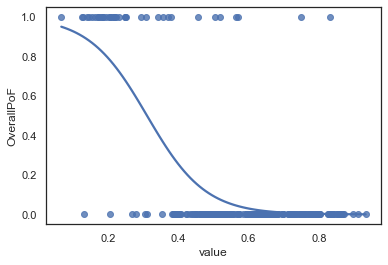

In [827]:
    x = plot_data.loc[(plot_data['variable']=='f1296')].value
    y = plot_data.loc[(plot_data['variable']=='f1296')].OverallPoF
    sb.regplot(x=x, y=y, data=data, logistic=True, ci=None)

In [ ]:
for i in x_freq.columns.values:
    x = plot_data.loc[(plot_data['variable']=='f1296')].value
    y = plot_data.loc[(plot_data['variable']=='f1296')].OverallPoF
    sb.regplot(x=x, y=y, data=data, logistic=True, ci=None)

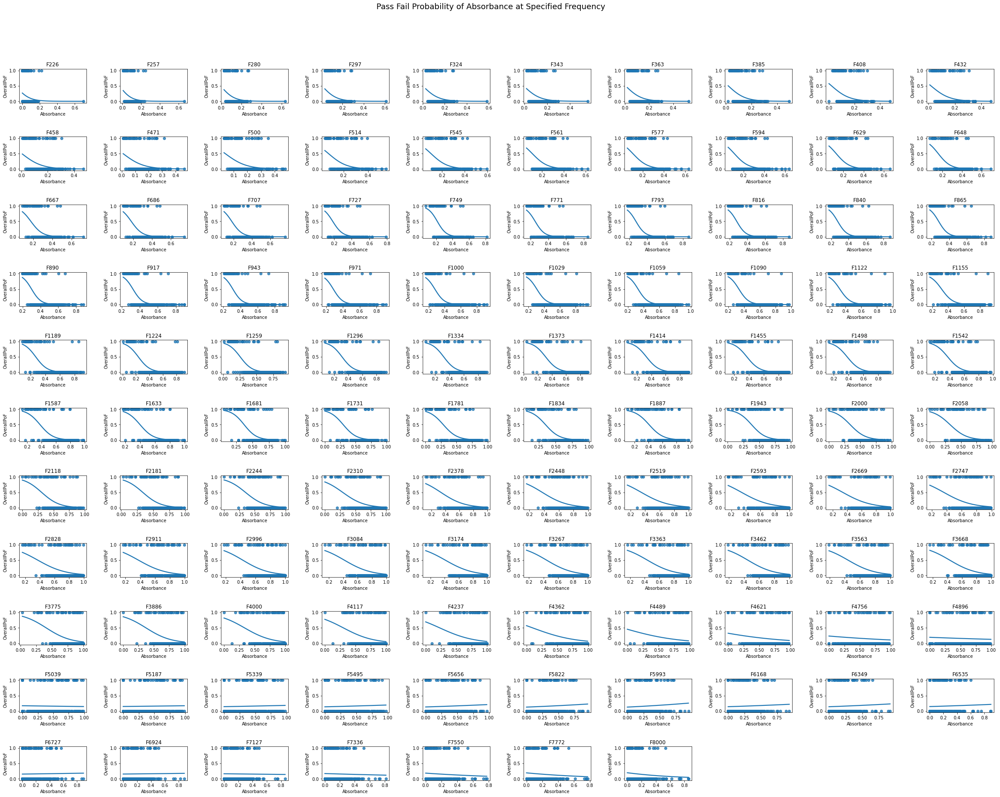

In [143]:
import matplotlib.pyplot as plt
plt.figure(figsize=(40, 30))
plt.subplots_adjust(hspace=1,wspace=0.5)
plt.suptitle("Pass Fail Probability of Absorbance at Specified Frequency", fontsize=18, y=0.95)

freq=x_freq.columns.values

# set number of columns (use 3 to demonstrate the change)
ncols = 10
# calculate number of rows
nrows = len(freq) // ncols + (len(freq) % ncols > 0)

# loop through the length of freq and keep track of index
for n, variable in enumerate(freq):
    x = plot_data.loc[(plot_data['variable']==variable)].value
    y = plot_data.loc[(plot_data['variable']==variable)].OverallPoF
    # add a new subplot iteratively using nrows and cols
    ax = plt.subplot(nrows, ncols, n + 1)

    # filter df and plot ticker on the new subplot axis
    sb.regplot(x=x, y=y, data=data, logistic=True, ci=None,ax=ax)
    
    # chart formatting
    ax.set_title(variable.upper())
    ax.set_xlabel("Absorbance")


## Scoring

In [282]:
from collections import defaultdict

import pandas as pd

from sklearn.metrics import (
    precision_score,
    recall_score,
    f1_score,
    log_loss,
    roc_auc_score,
)

clf_list = [
    (lr, "Logistic"),
    (gnb, "Naive Bayes"),
    (gnb_isotonic, "Naive Bayes + Isotonic"),
    (gnb_sigmoid, "Naive Bayes + Sigmoid"),
]

In [310]:
scores = defaultdict(list)
for i, (clf, name) in enumerate(clf_list):
    clf.fit(X_train, y_train)
    y_prob = clf.predict_proba(X_test)
    y_pred = clf.predict(X_test)
    scores["Classifier"].append(name)

    for metric in [brier_score_loss, log_loss]:
        score_name = metric.__name__.replace("_", " ").replace("score", "").capitalize()
        scores[score_name].append(metric(y_test, y_prob[:, 1]))

    for metric in [precision_score, recall_score, f1_score, roc_auc_score]:
        score_name = metric.__name__.replace("_", " ").replace("score", "").capitalize()
        scores[score_name].append(metric(y_test, y_pred))

    score_df = pd.DataFrame(scores).set_index("Classifier")
    score_df.round(decimals=3)

score_df

NameError: name 'clf_list' is not defined

In [311]:
scores

defaultdict(list, {})

## 7.0 - Model Explainability

In [232]:
iris = datasets.load_iris()
X = iris.data[:, [0, 2]]
y = iris.target

In [239]:
np.array(X_train2)

array([[0.062     , 0.0815    , 0.1046    , ..., 0.757     , 0.7724    ,
        0.7484    ],
       [0.0348    , 0.0649    , 0.096     , ..., 0.0269    , 0.0382    ,
        0.0127    ],
       [0.0026    , 0.0288    , 0.0561    , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.01050229, 0.03085805, 0.05198101, ..., 0.2709446 , 0.24551654,
        0.2116051 ],
       [0.00185767, 0.02255837, 0.04400574, ..., 0.22648901, 0.20991446,
        0.17888015],
       [0.02713952, 0.0436113 , 0.06549947, ..., 0.29777929, 0.29236498,
        0.27756527]])

## 8.0 - Conclusions

In [59]:
pipeline = Pipeline([
    ('min_max_scaler', MinMaxScaler()),
    ('std_scaler', StandardScaler())
])

X_train = pipeline.fit_transform(X_train)
X_test = pipeline.transform(X_test)

In [76]:
from sklearn.svm import SVC
model = SVC(kernel='linear')
model.fit(X_train, y_train)

print_score(model, X_train, y_train, X_test, y_test, train=True)
print_score(model, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    1.0    1.0       1.0        1.0           1.0
recall       1.0    1.0       1.0        1.0           1.0
f1-score     1.0    1.0       1.0        1.0           1.0
support    160.0  160.0       1.0      320.0         320.0
_______________________________________________
Confusion Matrix: 
 [[160   0]
 [  0 160]]

Test Result:
Accuracy Score: 95.83%
_______________________________________________
CLASSIFICATION REPORT:
                  0         1  accuracy  macro avg  weighted avg
precision   1.00000  0.777778  0.958333   0.888889      0.967593
recall      0.95122  1.000000  0.958333   0.975610      0.958333
f1-score    0.97500  0.875000  0.958333   0.925000      0.960417
support    41.00000  7.000000  0.958333  48.000000     48.000000
_______________________________________________
Confusion Matrix: 
 [[39

In [74]:
print("=======================Polynomial Kernel SVM==========================")
from sklearn.svm import SVC

model = SVC(kernel='poly', degree=2, gamma='auto')
model.fit(X_train, y_train)

print_score(model, X_train, y_train, X_test, y_test, train=True)
print_score(model, X_train, y_train, X_test, y_test, train=False)

=======================Polynomial Kernel SVM==========================
Train Result:
Accuracy Score: 95.31%
_______________________________________________
CLASSIFICATION REPORT:
                    0           1  accuracy   macro avg  weighted avg
precision    0.939394    0.967742  0.953125    0.953568      0.953568
recall       0.968750    0.937500  0.953125    0.953125      0.953125
f1-score     0.953846    0.952381  0.953125    0.953114      0.953114
support    160.000000  160.000000  0.953125  320.000000    320.000000
_______________________________________________
Confusion Matrix: 
 [[155   5]
 [ 10 150]]

Test Result:
Accuracy Score: 81.25%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   0.944444  0.416667    0.8125   0.680556      0.867477
recall      0.829268  0.714286    0.8125   0.771777      0.812500
f1-score    0.883117  0.526316    0.8125   0.704716      0.831083
support 

In [75]:
print("=======================Radial Kernel SVM==========================")
from sklearn.svm import SVC

model = SVC(kernel='rbf', gamma=1)
model.fit(X_train, y_train)

print_score(model, X_train, y_train, X_test, y_test, train=True)
print_score(model, X_train, y_train, X_test, y_test, train=False)

=======================Radial Kernel SVM==========================
Train Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    1.0    1.0       1.0        1.0           1.0
recall       1.0    1.0       1.0        1.0           1.0
f1-score     1.0    1.0       1.0        1.0           1.0
support    160.0  160.0       1.0      320.0         320.0
_______________________________________________
Confusion Matrix: 
 [[160   0]
 [  0 160]]

Test Result:
Accuracy Score: 85.42%
_______________________________________________
CLASSIFICATION REPORT:
                   0    1  accuracy  macro avg  weighted avg
precision   0.854167  0.0  0.854167   0.427083      0.729601
recall      1.000000  0.0  0.854167   0.500000      0.854167
f1-score    0.921348  0.0  0.854167   0.460674      0.786985
support    41.000000  7.0  0.854167  48.000000     48.000000
_________________________

## Hyperparameter tuning

In [80]:
from sklearn.model_selection import GridSearchCV

param_grid = {'C': [0.01, 0.1, 0.5, 1, 10, 100], 
              'gamma': [1, 0.75, 0.5, 0.25, 0.1, 0.01, 0.001], 
              'kernel': ['rbf', 'poly', 'linear']} 

grid = GridSearchCV(SVC(), param_grid, refit=True, verbose=1, cv=5)
grid.fit(X_train, y_train)

best_params = grid.best_params_
print(f"Best params: {best_params}")

svm_clf = SVC(**best_params)
svm_clf.fit(X_train, y_train)
print_score(svm_clf, X_train, y_train, X_test, y_test, train=True)
print_score(svm_clf, X_train, y_train, X_test, y_test, train=False)

Fitting 5 folds for each of 126 candidates, totalling 630 fits
Best params: {'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}
Train Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    1.0    1.0       1.0        1.0           1.0
recall       1.0    1.0       1.0        1.0           1.0
f1-score     1.0    1.0       1.0        1.0           1.0
support    160.0  160.0       1.0      320.0         320.0
_______________________________________________
Confusion Matrix: 
 [[160   0]
 [  0 160]]

Test Result:
Accuracy Score: 95.83%
_______________________________________________
CLASSIFICATION REPORT:
                   0         1  accuracy  macro avg  weighted avg
precision   0.953488  1.000000  0.958333   0.976744      0.960271
recall      1.000000  0.714286  0.958333   0.857143      0.958333
f1-score    0.976190  0.833333  0.958333   0.904762      0.955357
support    41.0

### Full dataset

In [61]:
a_data = pd.read_csv('00 - Dataset/02 - Cleaning Results/a_data.csv')
y_data = pd.read_csv('00 - Dataset/02 - Cleaning Results/y_data.csv')
p_data = pd.read_csv('00 - Dataset/02 - Cleaning Results/p_data.csv')

Text(0.5, 0, 'AgeY')

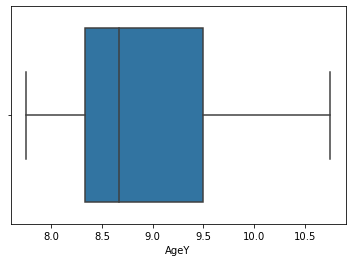

In [62]:
age_range=a_data.AgeM/12
sb.boxplot(age_range)
plt.xlabel('AgeY')

## Multi-collinearity

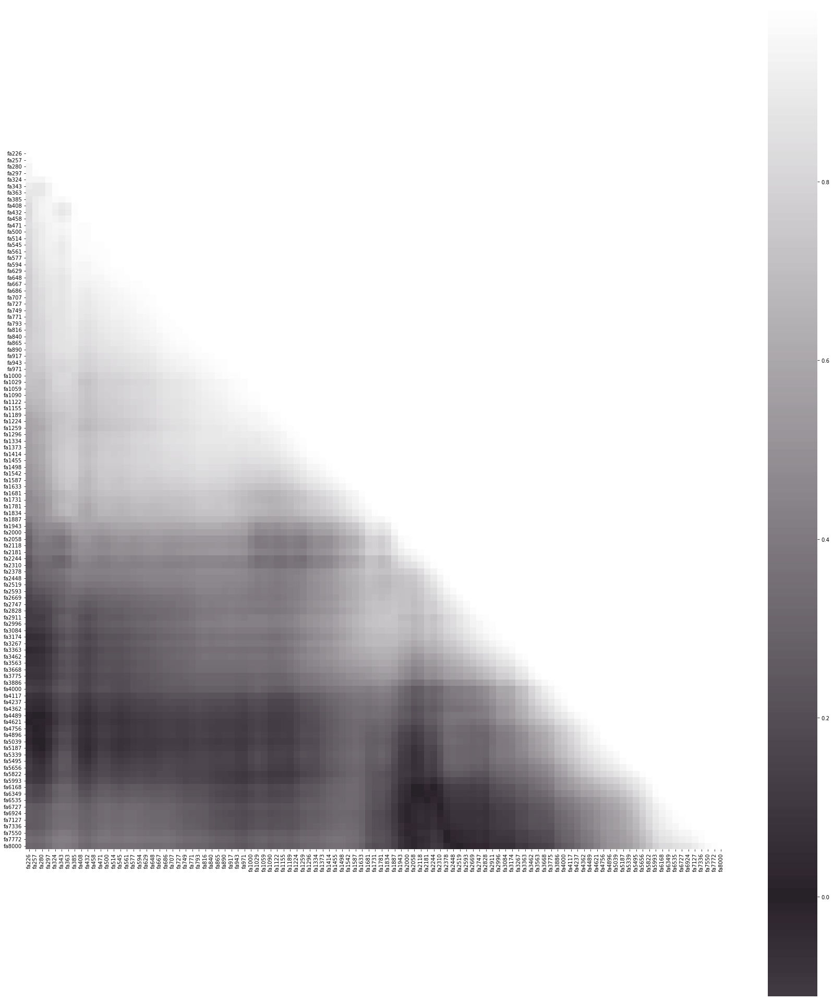

In [60]:

corr = X_train1.corr()

# Create a mask
mask = np.triu(np.ones_like(corr, dtype=bool))

# Create a custom divergin palette
cmap = sb.diverging_palette(0, 0, s=100,l=100,center='dark',as_cmap=True)

plt.figure(figsize=(30, 35))
sb.heatmap(corr, mask=mask, center=0, annot=False,
            fmt='.2f', square=True, cmap=cmap)

plt.show();

## Archived

## Functions

In [8]:
def sliding_window(df,window,counter):
    test_freqs=df.filter(regex=("f.*"))
    feature_idx_end=df.columns.get_loc("Ear.coded")+1
    features=df.iloc[:,:feature_idx_end]
    window_start=window*(counter-1)
    window_end=window*(counter)
    select_freq=test_freqs.iloc[:,window_start:window_end]
    data_window=pd.concat([features,select_freq],axis=1)
    return data_window

def split(data):
    y=data.loc[:,"OverallPoF"]
    X=data.drop(["OverallPoF"],axis=1)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20,random_state=20)
    return X_train,X_test,y_train,y_test

def split_window(data,window,counter):
    X_train=split(sliding_window(data,window,counter))[0]
    Y_train=split(sliding_window(data,window,counter))[2]
    x_test=split(sliding_window(data,window,counter))[1]
    y_test=split(sliding_window(data,window,counter))[3]
    return X_train,x_test,Y_train,y_test

def mix_sort(string):
    return list(map(int,re.findall(r'\d+',string)))[0]

## Loading data set

In [9]:
a_data=pd.read_csv("a_data.csv")
a_data.head()

,Gender,AgeM,ECV,TPP,SC,TympPoF,OAE1,OAE1.4,OAE2,OAE2.8,...,f6168,f6349,f6535,f6727,f6924,f7127,f7336,f7550,f7772,f8000
0,0,112,1.08,0,0.52,1,3.0,10.0,18.0,14.0,...,0.5370,0.4869,0.4301,0.4080,0.3804,0.3291,0.2951,0.2530,0.2282,0.2003
1,0,114,1.28,0,1.28,0,7.0,4.0,9.0,5.0,...,0.2636,0.2578,0.2443,0.2549,0.2604,0.2397,0.2299,0.2048,0.1917,0.1659
2,1,118,1.26,0,0.87,0,9.0,12.0,8.0,12.0,...,0.4269,0.4142,0.3910,0.3799,0.3740,0.3536,0.3473,0.3237,0.3056,0.2881
3,0,119,0.64,0,0.60,0,13.0,9.0,13.0,11.0,...,0.0077,0.0123,0.0066,0.0000,0.0126,0.0231,0.0405,0.0401,0.0391,0.0258
4,0,95,0.92,0,1.65,0,7.0,0.0,2.0,12.0,...,0.2332,0.2216,0.2228,0.2653,0.2596,0.2576,0.2838,0.3598,0.3953,0.3642


## Splitting Training and Testing Set

In [10]:
## Left = 0 Right = 1

In [11]:
# col_exclusion=["OAEPoF","TympPoF"] ## Determined that Gender SC and ECV take up too much variance
col_exclusion=["OAEPoF","TympPoF","Gender","ECV","SC"]

In [12]:
data=a_data.drop(col_exclusion,axis=1)
# data.columns.values.tolist()

In [13]:
y=data.loc[:,"OverallPoF"]
X=data.drop(["OverallPoF"],axis=1)

In [14]:
from sklearn.model_selection import train_test_split
X_train, x_test, Y_train, y_test = train_test_split(X, y, test_size = 0.20,random_state=12)
# X_train.columns.values.tolist()

In [15]:
X_train

,AgeM,TPP,OAE1,OAE1.4,OAE2,OAE2.8,OAE4,Ear.coded,f226,f257,...,f6168,f6349,f6535,f6727,f6924,f7127,f7336,f7550,f7772,f8000
216,97,0,7.5,9.7,8.3,9.5,13.3,1,0.0575,0.0933,...,0.0328,0.0374,0.0126,0.0112,0.0307,0.0162,0.0208,0.0144,0.0337,0.0217
36,121,8,16.0,11.0,16.0,8.0,3.0,0,0.0612,0.1023,...,0.1940,0.2110,0.2030,0.2176,0.2472,0.2470,0.2682,0.2718,0.3107,0.3356
1,114,0,7.0,4.0,9.0,5.0,6.0,0,0.1114,0.1501,...,0.2636,0.2578,0.2443,0.2549,0.2604,0.2397,0.2299,0.2048,0.1917,0.1659
179,117,0,5.7,7.6,0.0,0.4,0.0,1,0.0082,0.0325,...,0.2717,0.2478,0.2058,0.1763,0.1718,0.1403,0.1255,0.0935,0.1069,0.0527
51,105,0,0.0,0.0,0.0,0.0,0.0,0,0.0000,0.0104,...,0.0426,0.0454,0.0011,0.0211,0.0593,0.0151,0.0000,0.0000,0.0000,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3,119,0,13.0,9.0,13.0,11.0,12.0,0,0.0748,0.0953,...,0.0077,0.0123,0.0066,0.0000,0.0126,0.0231,0.0405,0.0401,0.0391,0.0258
130,103,0,3.0,8.0,17.0,12.0,5.0,1,0.1426,0.1903,...,0.5017,0.4453,0.3836,0.3349,0.3005,0.2659,0.2559,0.2345,0.2119,0.1923
134,103,0,6.0,15.0,9.0,12.0,10.0,1,0.0630,0.0828,...,0.1984,0.1776,0.1440,0.1469,0.1433,0.1191,0.1015,0.0759,0.0688,0.0387
155,121,0,13.0,24.0,18.0,11.0,6.0,1,0.0599,0.1016,...,0.2228,0.2295,0.2087,0.2101,0.2288,0.2213,0.2421,0.2534,0.2857,0.2966


## Resampling methods

In [43]:
fails=sum(data.OverallPoF==1)
fails

38

In [44]:
passes=sum(data.OverallPoF==0)
passes

201

In [45]:
len(X_train.columns.values)

9

## Feature Selection

### Feature selection - Sliding window set size

In [57]:
# We need to exclude gender SC and ECV
from sklearn import svm
window_list=[107]
counter_list=[1]

feat_rank={}

for i, window in enumerate(window_list):

    svm_clf = svm.SVC(kernel='linear')
    counter=counter_list[i]
    for j in range(1,counter+1):
        X_train=split_window(data,window,j)[0]
        # x_test=split_window(data,window,j)[1]
        Y_train=split_window(data,window,j)[2]
        # y_test=split_window(data,window,j)[3]

        svm_clf.fit(X_train, Y_train)
        # ax=pd.Series(abs(svm_clf.coef_[0]), index=X_train.columns).nlargest(10).plot(kind='barh')
        # ax.invert_yaxis()
        rank=pd.Series(abs(svm_clf.coef_[0]), index=X_train.columns).nlargest(115).index
    for i, c in enumerate(rank):
        feat_rank[c]=feat_rank.get(c,0)+i

In [58]:
pd.Series(abs(svm_clf.coef_[0]), index=X_train.columns).nlargest(20).index

Index(['f8000', 'f1731', 'f7772', 'f226', 'f5993', 'f1681', 'f257', 'f4000',
       'f1781', 'Ear.coded', 'f280', 'f3084', 'f2996', 'f7550', 'f1059',
       'f1090', 'f1943', 'f1834', 'f297', 'f4117'],
      dtype='object')

In [59]:
feature_ranking=pd.DataFrame(list(feat_rank.items()),columns=['Frequency','Ranking'])
feature_ranking.sort_values(by=['Ranking']).head(50)
frequency_ranking=feature_ranking[feature_ranking["Frequency"].str.contains("f.")]

In [60]:
rank

Index(['f8000', 'f1731', 'f7772', 'f226', 'f5993', 'f1681', 'f257', 'f4000',
       'f1781', 'Ear.coded',
       ...
       'OAE4', 'TPP', 'f6349', 'f3363', 'f1224', 'f1259', 'OAE2.8', 'f5822',
       'f6535', 'f2669'],
      dtype='object', length=115)

In [61]:
fnew=frequency_ranking.copy()

In [62]:
freq_values=frequency_ranking['Frequency'].apply(lambda string: int(string.replace('f',''))).to_numpy()
fnew["fval"]=freq_values

In [63]:
fnew.sort_values('fval',ascending=True,inplace=True)

### Feature selection - Sliding window set size

In [65]:
split_window(data,20,1)[0]

,AgeM,TPP,OAE1,OAE1.4,OAE2,OAE2.8,OAE4,Ear.coded,f226,f257,...,f458,f471,f500,f514,f545,f561,f577,f594,f629,f648
219,102,0,4.5,13.7,8.6,5.8,7.2,1,0.0348,0.0649,...,0.1361,0.1437,0.1730,0.2092,0.2331,0.2395,0.2361,0.2422,0.2593,0.2828
206,95,0,9.4,9.8,8.1,11.9,9.8,1,0.0111,0.0361,...,0.0634,0.0643,0.0881,0.1209,0.1440,0.1477,0.1446,0.1501,0.1675,0.1927
154,117,0,20.0,20.0,18.0,11.0,14.0,1,0.0804,0.1149,...,0.2213,0.2366,0.2700,0.3167,0.3511,0.3705,0.3779,0.3917,0.4153,0.4446
120,112,0,4.0,7.0,11.0,5.0,8.0,1,0.1036,0.1326,...,0.2209,0.2352,0.2699,0.3089,0.3326,0.3396,0.3364,0.3376,0.3487,0.3657
59,116,0,16.5,24.5,18.5,6.1,6.4,0,0.0480,0.0843,...,0.1759,0.1881,0.2247,0.2702,0.3000,0.3093,0.3096,0.3165,0.3354,0.3588
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156,100,0,7.0,9.0,17.0,20.0,11.0,1,0.0163,0.0444,...,0.0823,0.0867,0.1191,0.1603,0.1899,0.1969,0.1923,0.1985,0.2212,0.2562
223,99,0,29.2,17.8,16.6,4.8,5.9,1,0.0207,0.0482,...,0.0821,0.0832,0.1136,0.1569,0.1864,0.1934,0.1862,0.1873,0.2088,0.2414
15,102,0,5.0,3.0,3.0,18.0,13.0,0,0.0620,0.0815,...,0.0875,0.0914,0.1174,0.1516,0.1718,0.1719,0.1598,0.1528,0.1613,0.1813
218,97,0,0.0,6.7,9.2,10.0,5.8,1,0.0000,0.0101,...,0.0180,0.0163,0.0327,0.0570,0.0725,0.0734,0.0671,0.0668,0.0777,0.0958


### Feature score - Sliding window multiple size

In [74]:
# We need to exclude gender SC and ECV
from sklearn import svm
window_list=[107,53,26,15,7,4,2,1]
counter_list=[1,2,4,7,15,26,53,107]

feat_rank={}

for i, window in enumerate(window_list):

    svm_clf = svm.SVC(kernel='linear')
    counter=counter_list[i]
    for j in range(1,counter+1):
        X_train=split_window(data,window,j)[0]
        # x_test=split_window(data,window,j)[1]
        Y_train=split_window(data,window,j)[2]
        # y_test=split_window(data,window,j)[3]

        svm_clf.fit(X_train, Y_train)
        # ax=pd.Series(abs(svm_clf.coef_[0]), index=X_train.columns).nlargest(10).plot(kind='barh')
        # ax.invert_yaxis()
        rank=pd.Series(abs(svm_clf.coef_[0]), index=X_train.columns).nlargest(115).index
    for i, c in enumerate(rank):
        feat_rank[c]=feat_rank.get(c,0)+i

In [75]:
feature_ranking=pd.DataFrame(list(feat_rank.items()),columns=['Frequency','Ranking'])
feature_ranking.sort_values(by=['Ranking']).head(50)
frequency_ranking=feature_ranking[feature_ranking["Frequency"].str.contains("f.")]

In [76]:
fnew=frequency_ranking.copy()

In [77]:
freq_values=frequency_ranking['Frequency'].apply(lambda string: int(string.replace('f',''))).to_numpy()
fnew["fval"]=freq_values

In [116]:
fnew.sort_values('fval',ascending=True,inplace=True)
fnew.head(50)

,Frequency,Ranking,fval
3,f226,3,226
6,f257,6,257
10,f280,10,280
18,f297,18,297
33,f324,33,324
54,f343,54,343
74,f363,74,363
80,f385,80,385
76,f408,76,408
64,f432,64,432


In [140]:
max_score=fnew.Ranking.max()
rank=fnew['Ranking'].apply(lambda val: abs(val-max_score)).to_numpy()
fnew["rank"]=rank
fnew.head(10)

,Frequency,Ranking,fval,rank
3,f226,3,226,207
6,f257,6,257,204
10,f280,10,280,200
18,f297,18,297,192
33,f324,33,324,177
54,f343,54,343,156
74,f363,74,363,136
80,f385,80,385,130
76,f408,76,408,134
64,f432,64,432,146


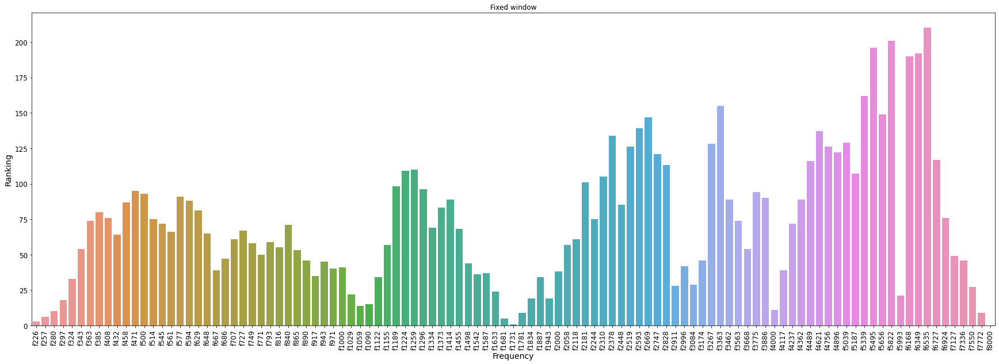

In [142]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 10]
sb.barplot(x='Frequency',y='Ranking',data=fnew)
plt.xticks(rotation=90)
plt.title("Fixed window");

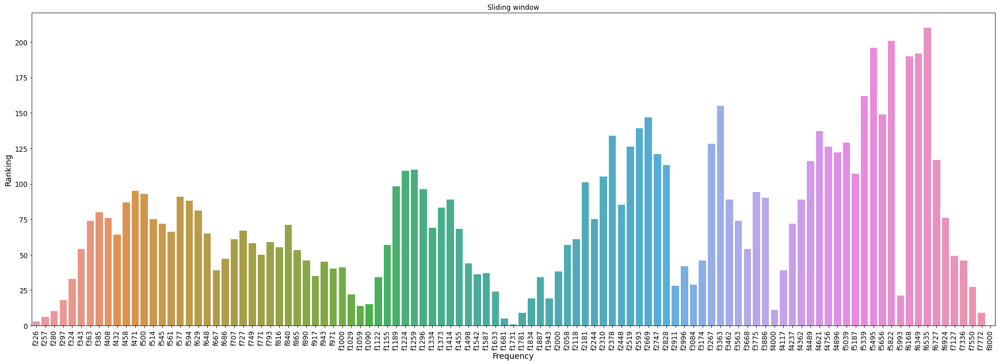

In [81]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 10]
sb.barplot(x='Frequency',y='Ranking',data=fnew)
plt.xticks(rotation=90)
plt.title("Sliding window");

In [82]:
from sklearn.decomposition import PCA
from sklearn.feature_selection import VarianceThreshold
from sklearn.svm import SVC
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFE
from sklearn.model_selection import cross_val_score

## SVM RBF

In [119]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline as pipe

rbf_svc=pipe([
    ("scaler",StandardScaler()),
    ("svm_clf",SVC(kernel="rbf",gamma=0.01,C=1))
])
rbf_svc.fit(X_train, Y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('svm_clf', SVC(C=1, gamma=0.01))])

In [120]:
y_pred=rbf_svc.predict(x_test)
y_pred

array([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0], dtype=int64)

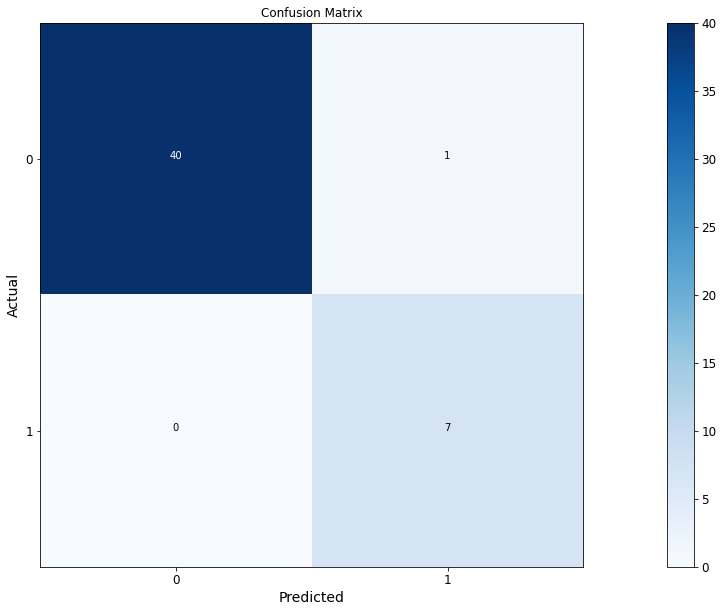

In [122]:
plt.imshow(cf,cmap=plt.cm.Blues,interpolation='nearest')
plt.colorbar()
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
tick_marks = np.arange(len(set(y_pred))) # length of classes
class_labels = ['0','1']
tick_marks
plt.xticks(tick_marks,class_labels)
plt.yticks(tick_marks,class_labels)
# plotting text value inside cells
thresh = cf.max() / 2.
for i,j in itertools.product(range(cf.shape[0]),range(cf.shape[1])):
    plt.text(j,i,format(cf[i,j],'d'),horizontalalignment='center',color='white' if cf[i,j] >thresh else 'black')
plt.show();

In [121]:
from sklearn.metrics import classification_report, confusion_matrix
cf=confusion_matrix(y_test,y_pred)
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[40  1]
 [ 0  7]]
              precision    recall  f1-score   support

           0       1.00      0.98      0.99        41
           1       0.88      1.00      0.93         7

    accuracy                           0.98        48
   macro avg       0.94      0.99      0.96        48
weighted avg       0.98      0.98      0.98        48



## ROC Analysis

C:\Users\AndyJ\anaconda3\envs\py\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


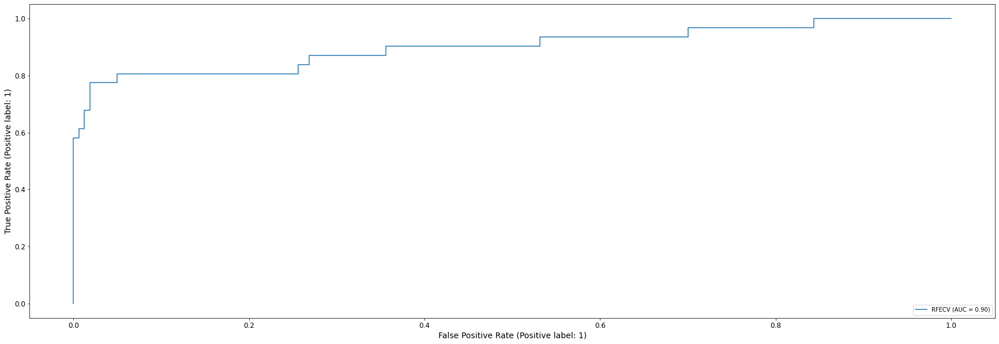

In [99]:
from sklearn.metrics import plot_roc_curve
plot_roc_curve(rfecv, X_train,Y_train )

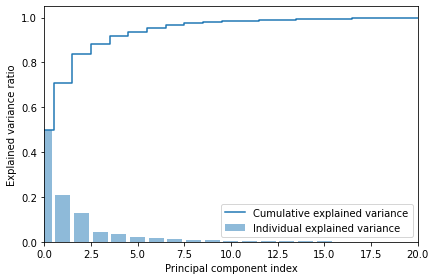

In [330]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.feature_selection import VarianceThreshold
from sklearn.svm import SVC
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFE
from sklearn.model_selection import cross_val_score
sc = StandardScaler()
sc.fit(X_train3)
X_train3_std = sc.transform(X_train3)
X_test3_std = sc.transform(X_test3)
#
# Instantiate PCA
#
pca = PCA()
#
# Determine transformed features
#
X_train3_pca = pca.fit_transform(X_train3_std)
#
# Determine explained variance using explained_variance_ration_ attribute
#
exp_var_pca = pca.explained_variance_ratio_
#
# Cumulative sum of eigenvalues; This will be used to create step plot
# for visualizing the variance explained by each principal component.
#
cum_sum_eigenvalues = np.cumsum(exp_var_pca)
#
# Create the visualization plot
#
plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.xlim(0,20)
plt.show()

## PCA Visualisation

## PCA Explained Variance - All frequencies

In [333]:
import plotly.express as px
from sklearn.decomposition import PCA

df = X_train3
y=y_train2
X= df

pca = PCA(n_components=5)
components = pca.fit_transform(X)

total_var = pca.explained_variance_ratio_.sum() * 100
total_pc1_var = pca.explained_variance_ratio_[0] * 100
total_pc2_var = pca.explained_variance_ratio_[1] * 100
total_pc3_var = pca.explained_variance_ratio_[2] * 100

ano1='PC1'+' '+str(round(total_pc1_var,0)) + '% EV'
ano2='PC2'+' '+str(round(total_pc2_var,0)) + '% EV'
ano3='PC3'+' '+str(round(total_pc3_var,0)) + '% EV'

fig = px.scatter_3d(
    components, x=0, y=1, z=2, color=y['OverallPoF'],
    # title=f'Total Explained Variance: {total_var:.2f}%',
    # labels={'0': 'PC 1'+round(total_pc1_var,0), '1': 'PC 2', '2': 'PC 3'},
    labels={'0': ano1, '1': ano2, '2': ano3},
    width=800, height=800
)
fig.update(layout_coloraxis_showscale=False)
fig.show()


ValueError: All arguments should have the same length. The length of argument `color` is 260, whereas the length of  previously-processed arguments ['0', '1', '2'] is 218

In [330]:
from sklearn.metrics import classification_report, confusion_matrix
cf=confusion_matrix(y_test,y_pred)
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[40  1]
 [ 0  7]]
              precision    recall  f1-score   support

           0       1.00      0.98      0.99        41
           1       0.88      1.00      0.93         7

    accuracy                           0.98        48
   macro avg       0.94      0.99      0.96        48
weighted avg       0.98      0.98      0.98        48



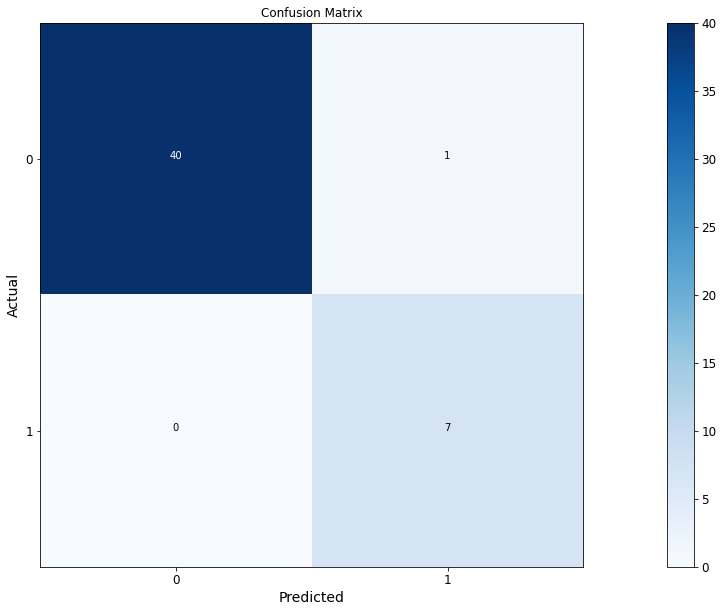

In [331]:
plt.imshow(cf,cmap=plt.cm.Blues,interpolation='nearest')
plt.colorbar()
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
tick_marks = np.arange(len(set(y_pred))) # length of classes
class_labels = ['0','1']
tick_marks
plt.xticks(tick_marks,class_labels)
plt.yticks(tick_marks,class_labels)
# plotting text value inside cells
thresh = cf.max() / 2.
for i,j in itertools.product(range(cf.shape[0]),range(cf.shape[1])):
    plt.text(j,i,format(cf[i,j],'d'),horizontalalignment='center',color='white' if cf[i,j] >thresh else 'black')
plt.show();

In [337]:
from sklearn.metrics import roc_curve, auc
from sklearn.linear_model import SGDClassifier 

model = SGDClassifier(loss='hinge',class_weight='balanced')
model.fit(X_train3, y_train3)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class, not the predicted outputs.

y_train_pred = model.decision_function(X_train3)    
y_test_pred = model.decision_function(X_test3) 

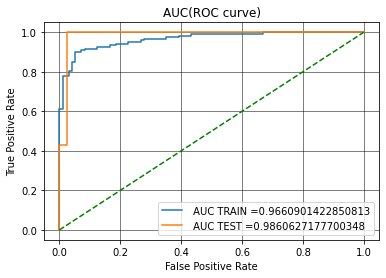

In [339]:
train_fpr, train_tpr, tr_thresholds = roc_curve(y_train3, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test3, y_test_pred)

plt.grid()

plt.plot(train_fpr, train_tpr, label=" AUC TRAIN ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label=" AUC TEST ="+str(auc(test_fpr, test_tpr)))
plt.plot([0,1],[0,1],'g--')
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("AUC(ROC curve)")
plt.grid(color='black', linestyle='-', linewidth=0.5)
plt.show()

## PCA Explained Variance - Frequency range between 1000Hz-1414Hz with SMOTE

In [628]:
import plotly.express as px
from sklearn.decomposition import PCA
from imblearn.over_sampling import SMOTE


sm = SMOTE(random_state=12)
X_sm, y_sm = sm.fit_resample(X_train1, y_train1)

df = X_sm
y=y_sm
X = df[['fa1000','fa1029', 'fa1059', 'fa1090','fa1122','fa1296','fa1334','fa1373','fa1414']]


pca = PCA(n_components=3)
components = pca.fit_transform(X)

total_var = pca.explained_variance_ratio_.sum() * 100
total_pc1_var = pca.explained_variance_ratio_[0] * 100
total_pc2_var = pca.explained_variance_ratio_[1] * 100
total_pc3_var = pca.explained_variance_ratio_[2] * 100

ano1='PC1'+' '+str(round(total_pc1_var,0)) + '% EV'
ano2='PC2'+' '+str(round(total_pc2_var,0)) + '% EV'
ano3='PC3'+' '+str(round(total_pc3_var,0)) + '% EV'

fig = px.scatter_3d(
    components, x=0, y=1, z=2, color=y,
    title=f'Total Explained Variance: {total_var:.2f}%',
    labels={'0': ano1, '1': ano2, '2': ano3},
    width=1000, height=1000
)
fig.update(layout_coloraxis_showscale=False)
fig.show()


ValueError: The truth value of a DataFrame is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

## Frequency plots

In [72]:
freq=X_train1.filter(regex="f.*")
freq_t=freq.T

In [73]:
freq1=freq_t.iloc[:,5]
freq1

fa226     0.0663
fa257     0.0757
fa280     0.0951
fa297     0.1212
fa324     0.1458
           ...  
fa7127    0.1231
fa7336    0.0961
fa7550    0.0916
fa7772    0.0789
fa8000    0.0586
Name: 5, Length: 107, dtype: float64

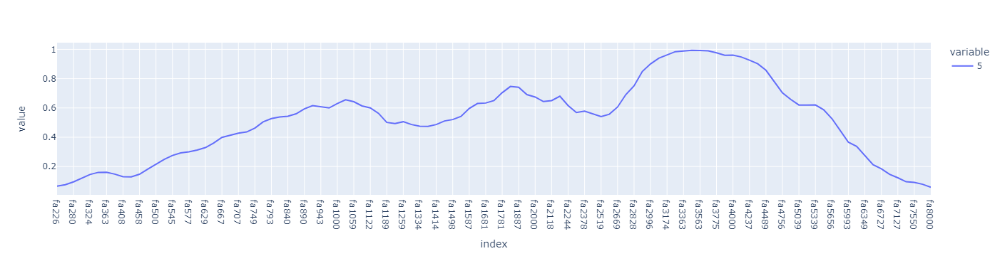

In [74]:
import plotly.express as px
px.line(freq1)

# Archive code

<AxesSubplot:xlabel='value', ylabel='Density'>

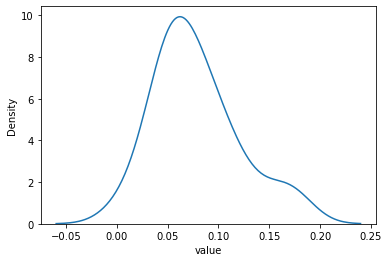

In [57]:
sb.kdeplot(d1)

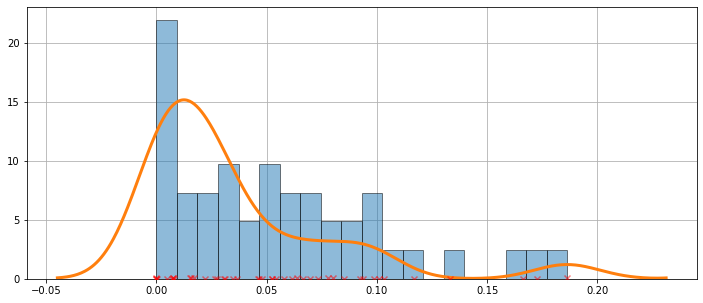

In [59]:
obs_dist = d3

kde = sm.nonparametric.KDEUnivariate(d2)
kde.fit()

fig = plt.figure(figsize=(12, 5))
ax = fig.add_subplot(111)
ax.hist(obs_dist, bins=20, density=True, edgecolor="k", zorder=4, alpha=0.5)
ax.plot(kde.support, kde.density, lw=3, zorder=7)
# Plot the samples
ax.scatter(
    obs_dist,
    np.abs(np.random.randn(obs_dist.size)) / 50,
    marker="x",
    color="red",
    zorder=20,
    label="Data samples",
    alpha=0.5,
)
ax.grid(True, zorder=-5)

In [194]:
import re
string=X_train1.columns.values
for word in string:
    num = re.findall('[\d]+',word)
    print(word,num)

fa226 ['226']
fa257 ['257']
fa280 ['280']
fa297 ['297']
fa324 ['324']
fa343 ['343']
fa363 ['363']
fa385 ['385']
fa408 ['408']
fa432 ['432']
fa458 ['458']
fa471 ['471']
fa500 ['500']
fa514 ['514']
fa545 ['545']
fa561 ['561']
fa577 ['577']
fa594 ['594']
fa629 ['629']
fa648 ['648']
fa667 ['667']
fa686 ['686']
fa707 ['707']
fa727 ['727']
fa749 ['749']
fa771 ['771']
fa793 ['793']
fa816 ['816']
fa840 ['840']
fa865 ['865']
fa890 ['890']
fa917 ['917']
fa943 ['943']
fa971 ['971']
fa1000 ['1000']
fa1029 ['1029']
fa1059 ['1059']
fa1090 ['1090']
fa1122 ['1122']
fa1155 ['1155']
fa1189 ['1189']
fa1224 ['1224']
fa1259 ['1259']
fa1296 ['1296']
fa1334 ['1334']
fa1373 ['1373']
fa1414 ['1414']
fa1455 ['1455']
fa1498 ['1498']
fa1542 ['1542']
fa1587 ['1587']
fa1633 ['1633']
fa1681 ['1681']
fa1731 ['1731']
fa1781 ['1781']
fa1834 ['1834']
fa1887 ['1887']
fa1943 ['1943']
fa2000 ['2000']
fa2058 ['2058']
fa2118 ['2118']
fa2181 ['2181']
fa2244 ['2244']
fa2310 ['2310']
fa2378 ['2378']
fa2448 ['2448']
fa2519 ['251

In [ ]:
data.columns.get_loc("Ear.coded")+1

In [25]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

X = X_train1.loc[:, X_train1.columns.isin(['fa1000', 'fa1029', 'fa1155', 'fa1189', 'fa1224', 'fa1259', 'fa1296', 'fa1334', 'fa1373', 'fa1414'])]

vif_info = pd.DataFrame()
vif_info['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif_info['Column'] = X.columns
vif_info.sort_values('VIF', ascending=False)

,VIF,Column
4,104866.531770,fa1224
3,82557.226424,fa1189
5,74983.418976,fa1259
6,73403.533080,fa1296
7,64267.081904,fa1334
8,47154.071160,fa1373
2,21461.362669,fa1155
9,10606.585888,fa1414
1,9266.253952,fa1029
0,4735.964453,fa1000


In [ ]:
test=data.filter(regex=("f.*")).head(5)

In [52]:
a_data.columns.get_loc("EarSide")

13

In [3]:
iris = datasets.load_iris()
X = iris["data"][:, (2, 3)] # petal length, petal width
y = (iris["target"] == 2).astype(np.float64) # Iris virginica
svm_clf = Pipeline([
("scaler", StandardScaler()),
("linear_svc", LinearSVC(C=1, loss="hinge")),
])
svm_clf.fit(X, y)

NameError: name 'LinearSVC' is not defined

In [11]:
svm_clf.predict([[5.5, 1.7]])

array([1.])

Saving figure higher_dimensions_plot


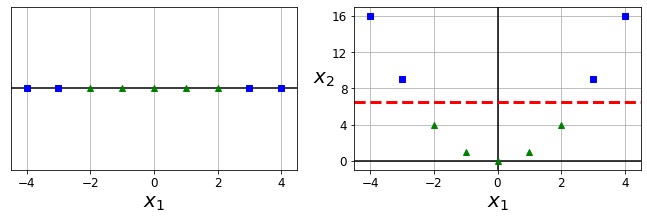

In [17]:
X1D = np.linspace(-4, 4, 9).reshape(-1, 1)
X2D = np.c_[X1D, X1D**2]
y = np.array([0, 0, 1, 1, 1, 1, 1, 0, 0])

plt.figure(figsize=(10, 3))

plt.subplot(121)
plt.grid(True, which='both')
plt.axhline(y=0, color='k')
plt.plot(X1D[:, 0][y==0], np.zeros(4), "bs")
plt.plot(X1D[:, 0][y==1], np.zeros(5), "g^")
plt.gca().get_yaxis().set_ticks([])
plt.xlabel(r"$x_1$", fontsize=20)
plt.axis([-4.5, 4.5, -0.2, 0.2])

plt.subplot(122)
plt.grid(True, which='both')
plt.axhline(y=0, color='k')
plt.axvline(x=0, color='k')
plt.plot(X2D[:, 0][y==0], X2D[:, 1][y==0], "bs")
plt.plot(X2D[:, 0][y==1], X2D[:, 1][y==1], "g^")
plt.xlabel(r"$x_1$", fontsize=20)
plt.ylabel(r"$x_2$  ", fontsize=20, rotation=0)
plt.gca().get_yaxis().set_ticks([0, 4, 8, 12, 16])
plt.plot([-4.5, 4.5], [6.5, 6.5], "r--", linewidth=3)
plt.axis([-4.5, 4.5, -1, 17])

plt.subplots_adjust(right=1)

save_fig("higher_dimensions_plot", tight_layout=False)
plt.show()

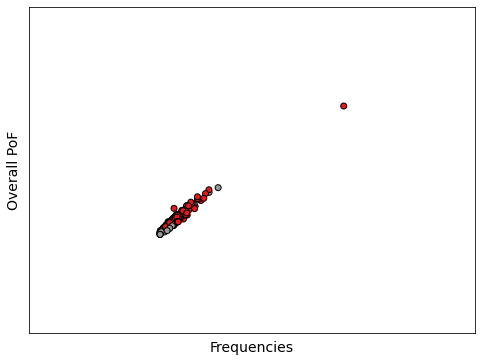

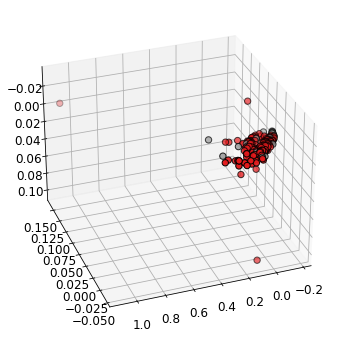

In [98]:
xtrain_a=a_data.iloc[:,[14,15,16,17]]
xtrain_a=xtrain_a.to_numpy()
type(xtrain_a)

ytrain_a=a_data.iloc[:,[12]]
ytrain_a=ytrain_a.to_numpy()

import matplotlib.pyplot as plt

# unused but required import for doing 3d projections with matplotlib < 3.2
import mpl_toolkits.mplot3d  # noqa: F401

from sklearn import datasets
from sklearn.decomposition import PCA

# import some data to play with

X = xtrain_a
y = ytrain_a

x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5

plt.figure(2, figsize=(8, 6))
plt.clf()

# Plot the training points
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.Set1, edgecolor="k")
plt.xlabel("Frequencies")
plt.ylabel("Overall PoF")

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())

# To getter a better understanding of interaction of the dimensions
# plot the first three PCA dimensions
fig = plt.figure(1, figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d", elev=-150, azim=110)

X_reduced = PCA(n_components=3).fit_transform(xtrain_a)
ax.scatter(
    X_reduced[:, 0],
    X_reduced[:, 1],
    X_reduced[:, 2],
    c=y,
    cmap=plt.cm.Set1,
    edgecolor="k",
    s=40,
)

# # ax.set_title("First three PCA directions")
# # ax.set_xlabel("1st eigenvector")
# # ax.w_xaxis.set_ticklabels([])
# # ax.set_ylabel("2nd eigenvector")
# # ax.w_yaxis.set_ticklabels([])
# # ax.set_zlabel("3rd eigenvector")
# # ax.w_zaxis.set_ticklabels([])

# plt.show()

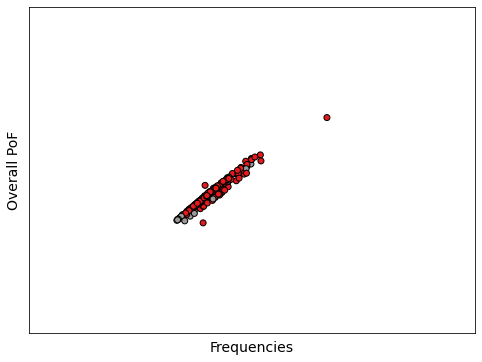

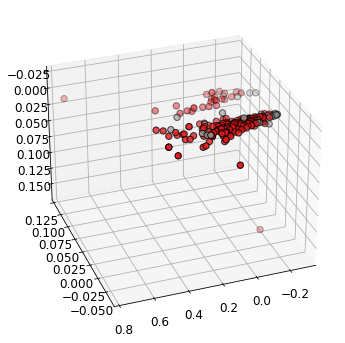

In [100]:
xtrain_a=a_data.iloc[:,20:25]
xtrain_a=xtrain_a.to_numpy()
type(xtrain_a)

ytrain_a=a_data.iloc[:,[12]]
ytrain_a=ytrain_a.to_numpy()

import matplotlib.pyplot as plt

# unused but required import for doing 3d projections with matplotlib < 3.2
import mpl_toolkits.mplot3d  # noqa: F401

from sklearn import datasets
from sklearn.decomposition import PCA

# import some data to play with

X = xtrain_a
y = ytrain_a

x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5

plt.figure(2, figsize=(8, 6))
plt.clf()

# Plot the training points
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.Set1, edgecolor="k")
plt.xlabel("Frequencies")
plt.ylabel("Overall PoF")

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())

# To getter a better understanding of interaction of the dimensions
# plot the first three PCA dimensions
fig = plt.figure(1, figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d", elev=-150, azim=110)

X_reduced = PCA(n_components=3).fit_transform(xtrain_a)
ax.scatter(
    X_reduced[:, 0],
    X_reduced[:, 1],
    X_reduced[:, 2],
    c=y,
    cmap=plt.cm.Set1,
    edgecolor="k",
    s=40,
)

# # ax.set_title("First three PCA directions")
# # ax.set_xlabel("1st eigenvector")
# # ax.w_xaxis.set_ticklabels([])
# # ax.set_ylabel("2nd eigenvector")
# # ax.w_yaxis.set_ticklabels([])
# # ax.set_zlabel("3rd eigenvector")
# # ax.w_zaxis.set_ticklabels([])

# plt.show()

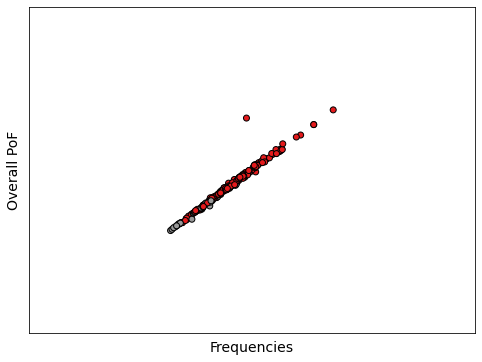

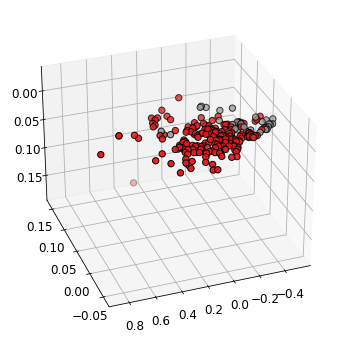

In [101]:
xtrain_a=a_data.iloc[:,30:35]
xtrain_a=xtrain_a.to_numpy()
type(xtrain_a)

ytrain_a=a_data.iloc[:,[12]]
ytrain_a=ytrain_a.to_numpy()

import matplotlib.pyplot as plt

# unused but required import for doing 3d projections with matplotlib < 3.2
import mpl_toolkits.mplot3d  # noqa: F401

from sklearn import datasets
from sklearn.decomposition import PCA

# import some data to play with

X = xtrain_a
y = ytrain_a

x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5

plt.figure(2, figsize=(8, 6))
plt.clf()

# Plot the training points
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.Set1, edgecolor="k")
plt.xlabel("Frequencies")
plt.ylabel("Overall PoF")

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())

# To getter a better understanding of interaction of the dimensions
# plot the first three PCA dimensions
fig = plt.figure(1, figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d", elev=-150, azim=110)

X_reduced = PCA(n_components=3).fit_transform(xtrain_a)
ax.scatter(
    X_reduced[:, 0],
    X_reduced[:, 1],
    X_reduced[:, 2],
    c=y,
    cmap=plt.cm.Set1,
    edgecolor="k",
    s=40,
)

# # ax.set_title("First three PCA directions")
# # ax.set_xlabel("1st eigenvector")
# # ax.w_xaxis.set_ticklabels([])
# # ax.set_ylabel("2nd eigenvector")
# # ax.w_yaxis.set_ticklabels([])
# # ax.set_zlabel("3rd eigenvector")
# # ax.w_zaxis.set_ticklabels([])

# plt.show()

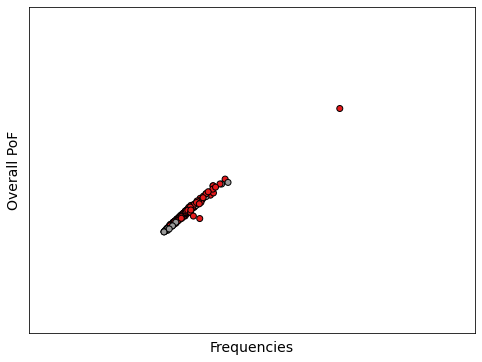

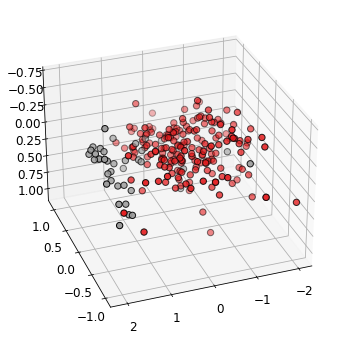

In [112]:
xtrain_a=a_data.iloc[:,15:70]
xtrain_a=xtrain_a.to_numpy()
type(xtrain_a)

ytrain_a=a_data.iloc[:,[12]]
ytrain_a=ytrain_a.to_numpy()

import matplotlib.pyplot as plt

# unused but required import for doing 3d projections with matplotlib < 3.2
import mpl_toolkits.mplot3d  # noqa: F401

from sklearn import datasets
from sklearn.decomposition import PCA

# import some data to play with

X = xtrain_a
y = ytrain_a

x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5

plt.figure(2, figsize=(8, 6))
plt.clf()

# Plot the training points
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.Set1, edgecolor="k")
plt.xlabel("Frequencies")
plt.ylabel("Overall PoF")

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())

# To getter a better understanding of interaction of the dimensions
# plot the first three PCA dimensions
fig = plt.figure(1, figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d", elev=-150, azim=110)

X_reduced = PCA(n_components=3).fit_transform(xtrain_a)
ax.scatter(
    X_reduced[:, 0],
    X_reduced[:, 1],
    X_reduced[:, 2],
    c=y,
    cmap=plt.cm.Set1,
    edgecolor="k",
    s=40,
)

# # ax.set_title("First three PCA directions")
# # ax.set_xlabel("1st eigenvector")
# # ax.w_xaxis.set_ticklabels([])
# # ax.set_ylabel("2nd eigenvector")
# # ax.w_yaxis.set_ticklabels([])
# # ax.set_zlabel("3rd eigenvector")
# # ax.w_zaxis.set_ticklabels([])

# plt.show()

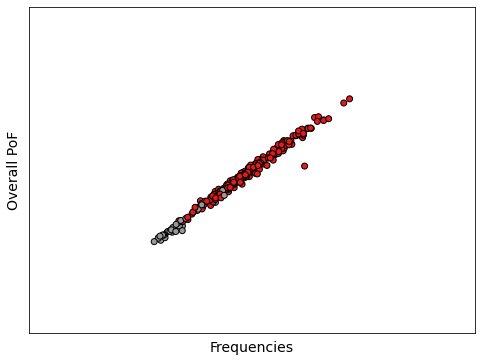

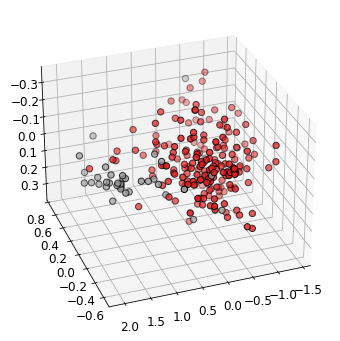

In [106]:
xtrain_a=a_data.iloc[:,50:70]
xtrain_a=xtrain_a.to_numpy()
type(xtrain_a)

ytrain_a=a_data.iloc[:,[12]]
ytrain_a=ytrain_a.to_numpy()

import matplotlib.pyplot as plt

# unused but required import for doing 3d projections with matplotlib < 3.2
import mpl_toolkits.mplot3d  # noqa: F401

from sklearn import datasets
from sklearn.decomposition import PCA

# import some data to play with

X = xtrain_a
y = ytrain_a

x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5

plt.figure(2, figsize=(8, 6))
plt.clf()

# Plot the training points
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.Set1, edgecolor="k")
plt.xlabel("Frequencies")
plt.ylabel("Overall PoF")

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())

# To getter a better understanding of interaction of the dimensions
# plot the first three PCA dimensions
fig = plt.figure(1, figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d", elev=-150, azim=110)

X_reduced = PCA(n_components=3).fit_transform(xtrain_a)
ax.scatter(
    X_reduced[:, 0],
    X_reduced[:, 1],
    X_reduced[:, 2],
    c=y,
    cmap=plt.cm.Set1,
    edgecolor="k",
    s=40,
)

# # ax.set_title("First three PCA directions")
# # ax.set_xlabel("1st eigenvector")
# # ax.w_xaxis.set_ticklabels([])
# # ax.set_ylabel("2nd eigenvector")
# # ax.w_yaxis.set_ticklabels([])
# # ax.set_zlabel("3rd eigenvector")
# # ax.w_zaxis.set_ticklabels([])

# plt.show()



ModuleNotFoundError: No module named 'plotly'

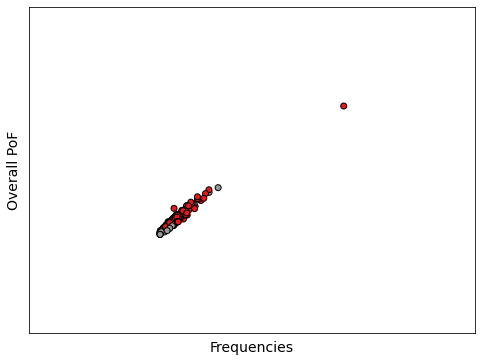

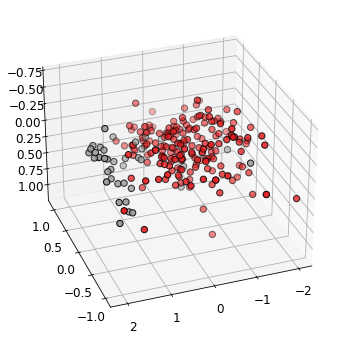

In [110]:
xtrain_a=a_data.iloc[:,14:70]
xtrain_a=xtrain_a.to_numpy()
type(xtrain_a)

ytrain_a=a_data.iloc[:,[12]]
ytrain_a=ytrain_a.to_numpy()

import matplotlib.pyplot as plt

# unused but required import for doing 3d projections with matplotlib < 3.2
import mpl_toolkits.mplot3d  # noqa: F401

from sklearn import datasets
from sklearn.decomposition import PCA

# import some data to play with

X = xtrain_a
y = ytrain_a

x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5

plt.figure(2, figsize=(8, 6))
plt.clf()

# Plot the training points
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.Set1, edgecolor="k")
plt.xlabel("Frequencies")
plt.ylabel("Overall PoF")

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())

# To getter a better understanding of interaction of the dimensions
# plot the first three PCA dimensions
fig = plt.figure(1, figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d", elev=-150, azim=110)

X_reduced = PCA(n_components=3).fit_transform(xtrain_a)
ax.scatter(
    X_reduced[:, 0],
    X_reduced[:, 1],
    X_reduced[:, 2],
    c=y,
    cmap=plt.cm.Set1,
    edgecolor="k",
    s=40,
)

# # ax.set_title("First three PCA directions")
# # ax.set_xlabel("1st eigenvector")
# # ax.w_xaxis.set_ticklabels([])
# # ax.set_ylabel("2nd eigenvector")
# # ax.w_yaxis.set_ticklabels([])
# # ax.set_zlabel("3rd eigenvector")
# # ax.w_zaxis.set_ticklabels([])

# plt.show()

import plotly.express as px
df = px.X_reduced
fig = px.scatter_3d(df, x='sepal_length', y='sepal_width', z='petal_width',
              color='species')
fig.show()

In [109]:
X_reduced

array([[ 1.66328610e+00,  8.36608085e-02, -4.45278187e-02],
       [ 6.11331570e-02,  1.16640289e-01,  5.93475387e-02],
       [-2.08007669e-01,  3.59607440e-03, -1.31390211e-01],
       [-5.65338228e-01,  3.56340831e-01,  6.61622355e-02],
       [-5.25506899e-01,  7.35547114e-01, -2.22206041e-01],
       [ 1.52839520e+00, -3.75086143e-02,  1.03531088e-02],
       [-8.13448122e-01, -4.33759486e-02, -1.61169640e-01],
       [-7.59014647e-01,  1.39773992e-01,  1.36189472e-01],
       [ 1.12433899e+00, -3.23949052e-02,  1.70481349e-01],
       [ 9.43949816e-02,  2.90696319e-01, -1.70558497e-01],
       [ 1.84910197e+00,  2.49142487e-01,  1.65085911e-02],
       [ 1.29112335e+00,  2.91058197e-01,  1.50632707e-02],
       [ 2.34869148e-01, -1.39977885e-02,  8.94884154e-02],
       [ 6.04551337e-01,  1.66229994e-01, -2.09841493e-01],
       [ 4.22601556e-01,  2.51903359e-01, -2.36559137e-01],
       [ 1.86044055e-01, -6.24917647e-01, -8.18218726e-03],
       [-1.26382116e+00,  2.14479001e-01